<a href="https://colab.research.google.com/github/ChristopheMuller/colab/blob/diffusion/diffusion_moons.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Generating 2000 2D 'moon' samples...
Plotting data...


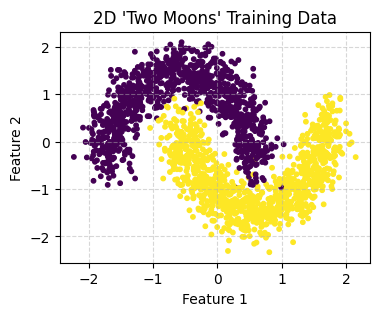

In [ ]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
import numpy as np
import matplotlib.pyplot as plt
from sklearn.datasets import make_moons
from sklearn.preprocessing import StandardScaler

# --- Step 1: Data Functions ---

def get_data(n_samples=2000):
    print(f"Generating {n_samples} 2D 'moon' samples...")
    x, y = make_moons(n_samples=n_samples, noise=0.15, random_state=1)
    scaler = StandardScaler()
    x_scaled = scaler.fit_transform(x).astype(np.float32)
    return x_scaled, y

def plot_data(x_data, y_data):
    print("Plotting data...")
    plt.figure(figsize=(4, 3))
    plt.scatter(x_data[:, 0], x_data[:, 1], c=y_data, cmap='viridis', s=10)
    plt.title("2D 'Two Moons' Training Data")
    plt.xlabel("Feature 1")
    plt.ylabel("Feature 2")
    plt.grid(True, linestyle='--', alpha=0.5)
    plt.show()

X,y = get_data()
plot_data(X,y)

In [ ]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler

def get_data(n_samples=2000):
    print(f"Generating {n_samples} 2D 'intersecting circles' samples...")
    n_samples_per_class = n_samples // 2

    noise = 0.05
    radius = 1.0

    # Circle 1 (Class 0)
    center_0 = (-0.5, 0)
    theta_0 = np.random.uniform(0, 2 * np.pi, n_samples_per_class)
    noise_0 = np.random.normal(0, noise, (n_samples_per_class, 2))
    x_0 = center_0[0] + radius * np.cos(theta_0)
    y_0 = center_0[1] + radius * np.sin(theta_0)
    points_0 = np.stack([x_0, y_0], axis=1) + noise_0

    # Circle 2 (Class 1)
    center_1 = (0.5, 0)
    theta_1 = np.random.uniform(0, 2 * np.pi, n_samples_per_class)
    noise_1 = np.random.normal(0, noise, (n_samples_per_class, 2))
    x_1 = center_1[0] + radius * np.cos(theta_1)
    y_1 = center_1[1] + radius * np.sin(theta_1)
    points_1 = np.stack([x_1, y_1], axis=1) + noise_1

    # Combine
    x = np.concatenate([points_0, points_1], axis=0).astype(np.float32)
    y = np.concatenate([
        np.zeros(n_samples_per_class),
        np.ones(n_samples_per_class)
    ], axis=0).astype(np.int64)

    scaler = StandardScaler()
    x_scaled = scaler.fit_transform(x)

    return x_scaled, y

def plot_data(x_data, y_data):
    print("Plotting data...")
    plt.figure(figsize=(4, 3))
    plt.scatter(x_data[:, 0], x_data[:, 1], c=y_data, cmap='viridis', s=10)
    plt.title("2D 'Two Moons' Training Data")
    plt.xlabel("Feature 1")
    plt.ylabel("Feature 2")
    plt.grid(True, linestyle='--', alpha=0.5)
    plt.show()

X,y = get_data()
plot_data(X,y)

## Unconditional Diffusion

--- 1. Getting Data ---
Generating 5000 2D 'moon' samples...
Plotting data...


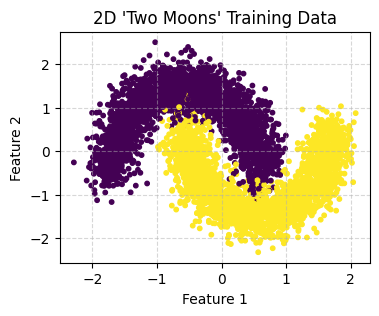


--- 2. Getting Noise Schedule (T=200) ---

--- 3. Plotting Forward Process ---
Generating noisy examples for forward process (full dataset)...


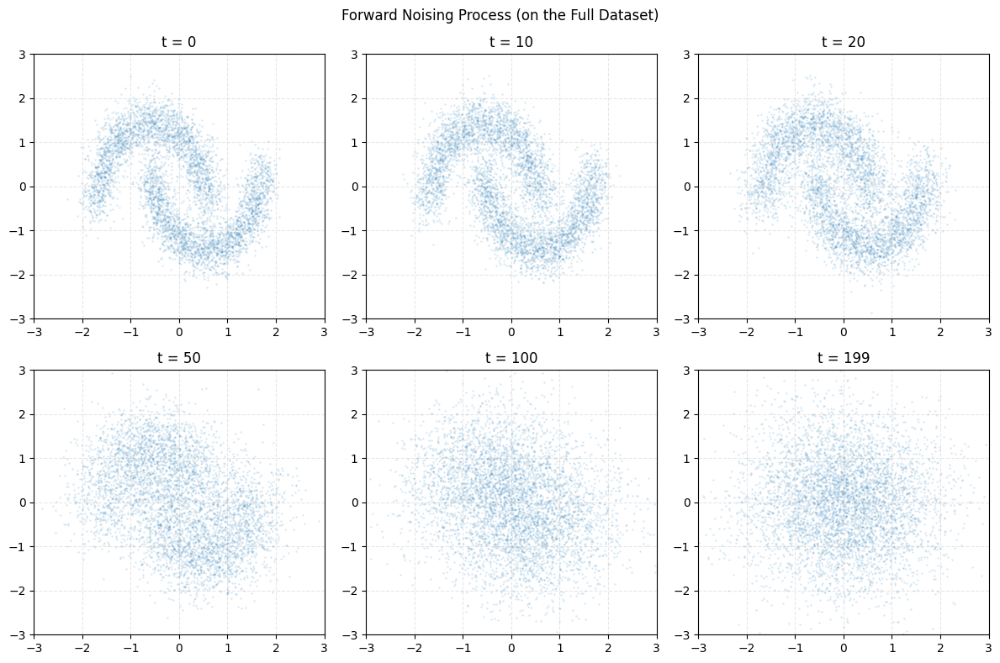


--- 4. Creating Training Dataset ---

--- 5. Building Model ---


Model: "functional_16"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ time_input          │ (None)            │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ point_input         │ (None, 2)         │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ embedding_23        │ (None, 32)        │      6,400 │ time_input[0][0]  │
│ (Embedding)         │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_16      │ (None, 34)        │          0 │ point_input[0][0… │
│ (Concatenate)       │                   │            │ embedding_23[0][… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_52 (Dense)    │ (None, 128)       │      4,480 │ concatenate_16[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_53 (Dense)    │ (None, 128)       │     16,512 │ dense_52[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_54 (Dense)    │ (None, 2)         │        258 │ dense_53[0][0]    │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 27,650 (108.01 KB)

 Trainable params: 27,650 (108.01 KB)

 Non-trainable params: 0 (0.00 B)


--- 6. Setting up Training ---

--- 7. Starting Training ---
Epoch 1/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 0.6463
Epoch 2/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.5755
Epoch 3/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.5105
Epoch 4/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4903
Epoch 5/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4945
Epoch 6/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.5028
Epoch 7/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4959
Epoch 8/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4709
Epoch 9/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4716
Epoch 10/300
21/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4704 
--- Generating points at epoch 10 ---


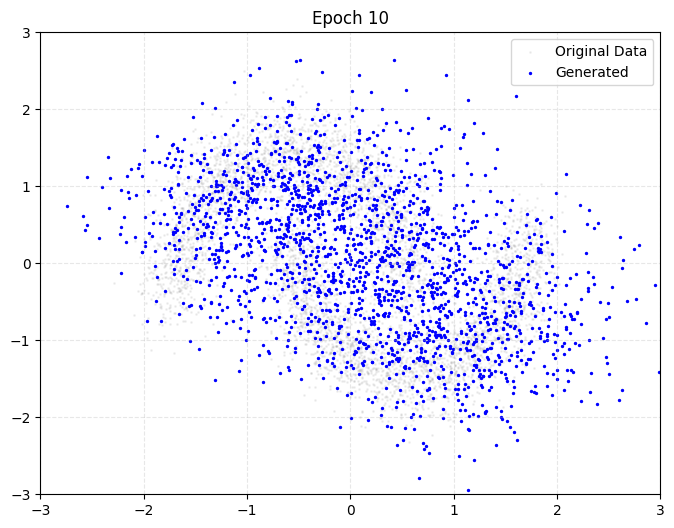

39/39 ━━━━━━━━━━━━━━━━━━━━ 13s 342ms/step - loss: 0.4787
Epoch 11/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4777
Epoch 12/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4825
Epoch 13/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4687
Epoch 14/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4697
Epoch 15/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4589
Epoch 16/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4684
Epoch 17/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4669
Epoch 18/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4651
Epoch 19/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4630
Epoch 20/300
20/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4607  
--- Generating points at epoch 20 ---


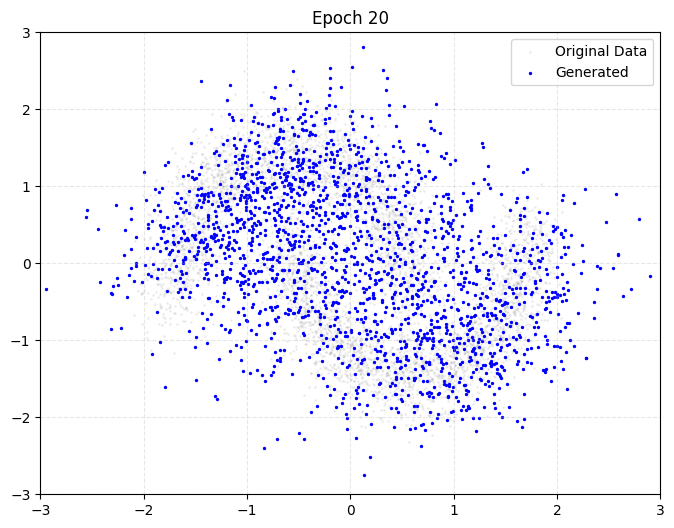

39/39 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.4702
Epoch 21/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.4761
Epoch 22/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4638
Epoch 23/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4699
Epoch 24/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.4580
Epoch 25/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.4638
Epoch 26/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.4763
Epoch 27/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4625
Epoch 28/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.4645
Epoch 29/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.4600
Epoch 30/300
27/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4667
--- Generating points at epoch 30 ---


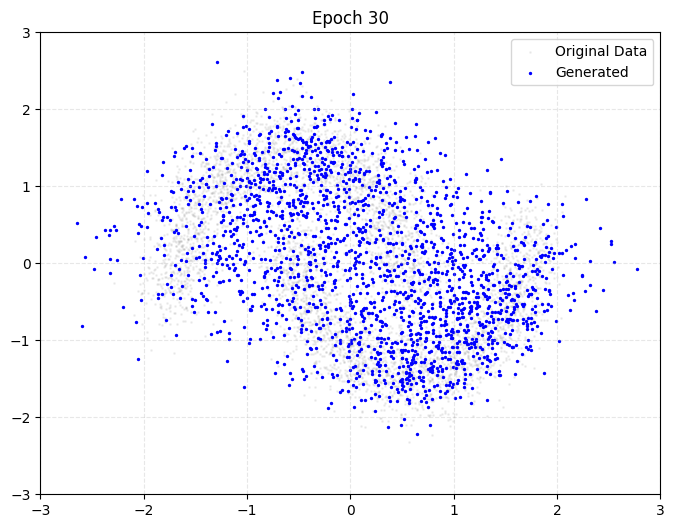

39/39 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.4671
Epoch 31/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4680
Epoch 32/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4629
Epoch 33/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4604
Epoch 34/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4670
Epoch 35/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4627
Epoch 36/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4624
Epoch 37/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4681
Epoch 38/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4603
Epoch 39/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4524
Epoch 40/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4508
--- Generating points at epoch 40 ---


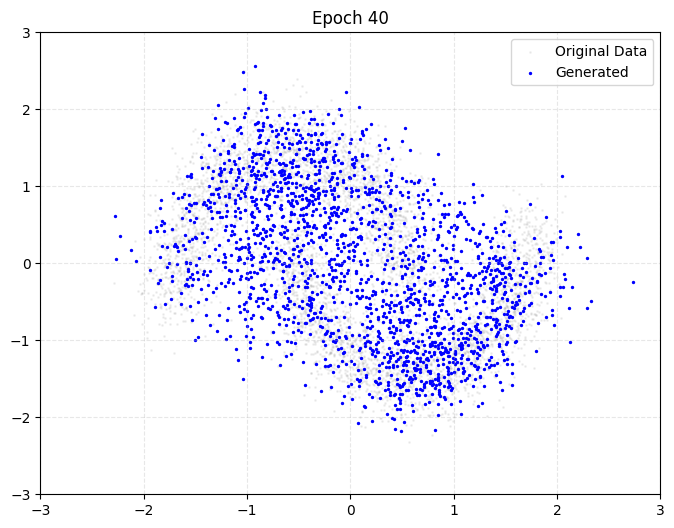

39/39 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 0.4510
Epoch 41/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4553
Epoch 42/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4596
Epoch 43/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4499
Epoch 44/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4631
Epoch 45/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4613
Epoch 46/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4546
Epoch 47/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4616
Epoch 48/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4651
Epoch 49/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4592
Epoch 50/300
38/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4528
--- Generating points at epoch 50 ---


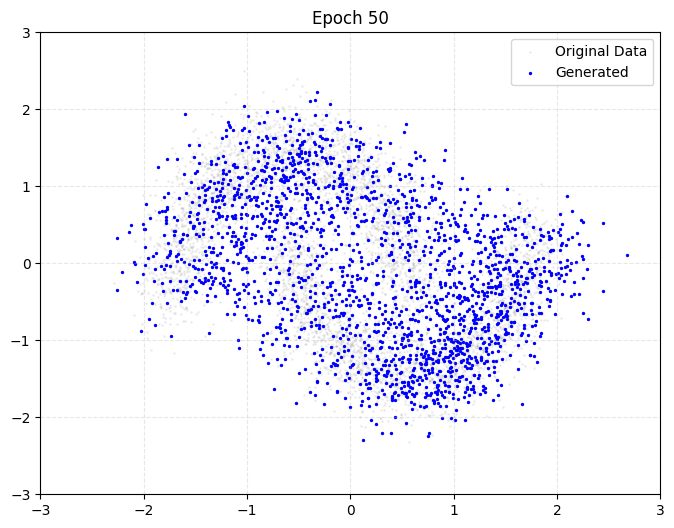

39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.4532
Epoch 51/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4605
Epoch 52/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4576
Epoch 53/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4653
Epoch 54/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4588
Epoch 55/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4378
Epoch 56/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4614
Epoch 57/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4588
Epoch 58/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.4529
Epoch 59/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4671
Epoch 60/300
31/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4524
--- Generating points at epoch 60 ---


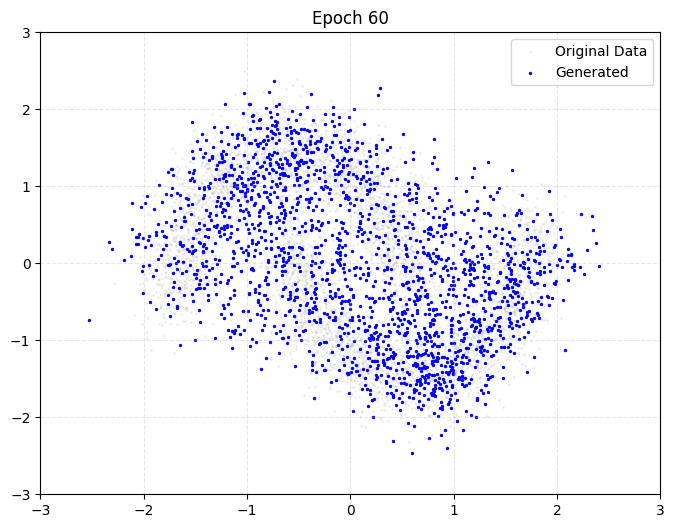

39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.4542
Epoch 61/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4558
Epoch 62/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4553
Epoch 63/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4530
Epoch 64/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4619
Epoch 65/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4636
Epoch 66/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4584
Epoch 67/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4498
Epoch 68/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4500
Epoch 69/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4509
Epoch 70/300
37/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4625
--- Generating points at epoch 70 ---


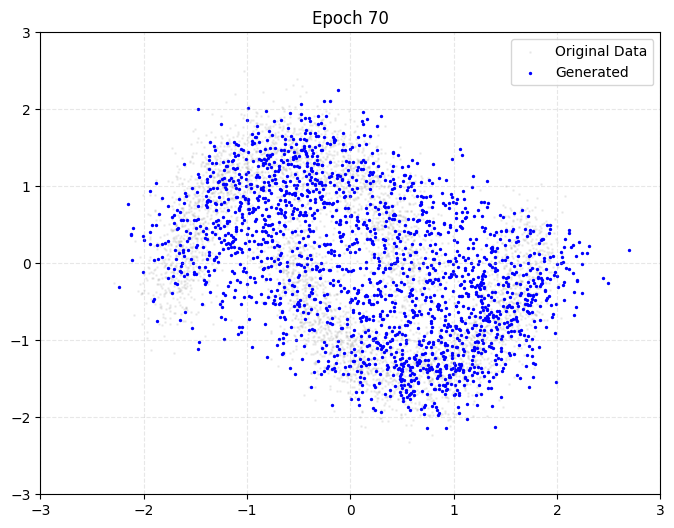

39/39 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 0.4631
Epoch 71/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4538
Epoch 72/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4592
Epoch 73/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4506
Epoch 74/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.4508
Epoch 75/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.4568
Epoch 76/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.4536
Epoch 77/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.4576
Epoch 78/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.4616
Epoch 79/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.4549
Epoch 80/300
28/39 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.4456
--- Generating points at epoch 80 ---


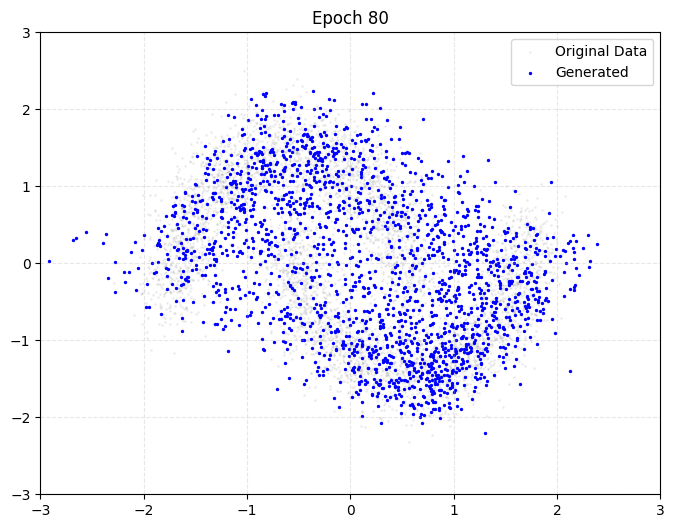

39/39 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - loss: 0.4511
Epoch 81/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.4520
Epoch 82/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4430
Epoch 83/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4535
Epoch 84/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4626
Epoch 85/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4660
Epoch 86/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4477
Epoch 87/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4504
Epoch 88/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4550
Epoch 89/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4459
Epoch 90/300
34/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4484
--- Generating points at epoch 90 ---


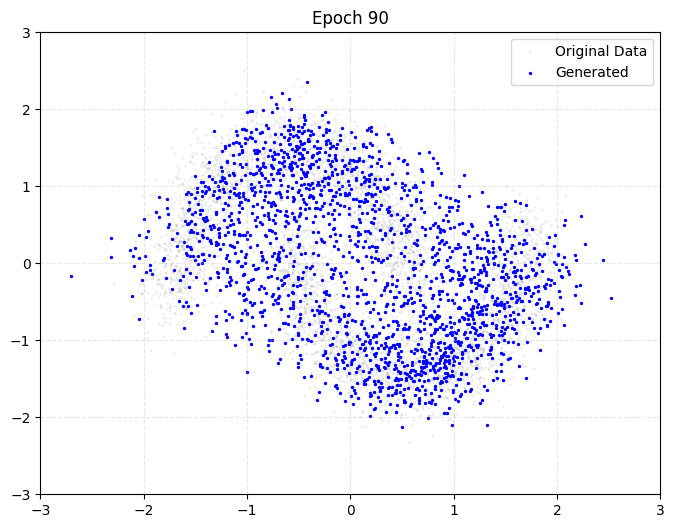

39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.4494
Epoch 91/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4605
Epoch 92/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4472
Epoch 93/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4562
Epoch 94/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4547
Epoch 95/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4584
Epoch 96/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4477
Epoch 97/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4577
Epoch 98/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4599
Epoch 99/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4562
Epoch 100/300
35/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4472
--- Generating points at epoch 100 ---


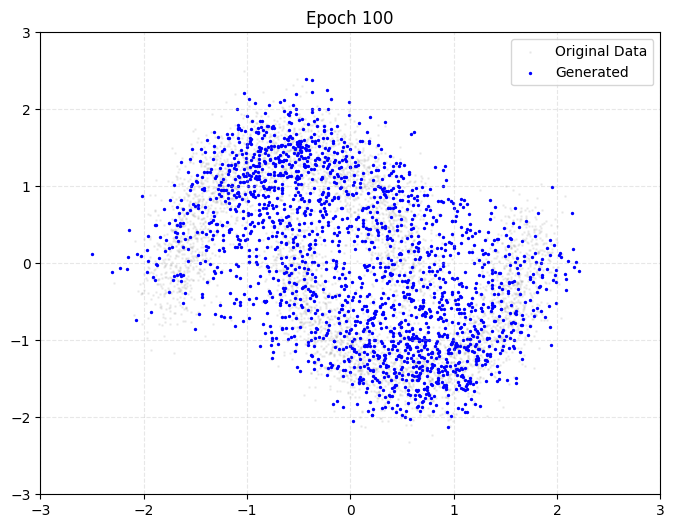

39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.4493
Epoch 101/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4545
Epoch 102/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4507
Epoch 103/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4517
Epoch 104/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4538
Epoch 105/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4415
Epoch 106/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4512
Epoch 107/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4495
Epoch 108/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4480
Epoch 109/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4575
Epoch 110/300
33/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4532
--- Generating points at epoch 110 ---


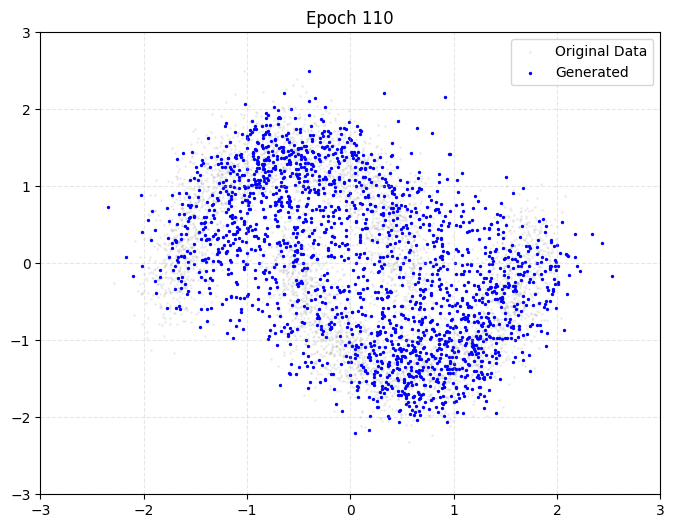

39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.4547
Epoch 111/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4546
Epoch 112/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4321
Epoch 113/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4547
Epoch 114/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4492
Epoch 115/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4647
Epoch 116/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4549
Epoch 117/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4490
Epoch 118/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4508
Epoch 119/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4557
Epoch 120/300
31/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4520
--- Generating points at epoch 120 ---


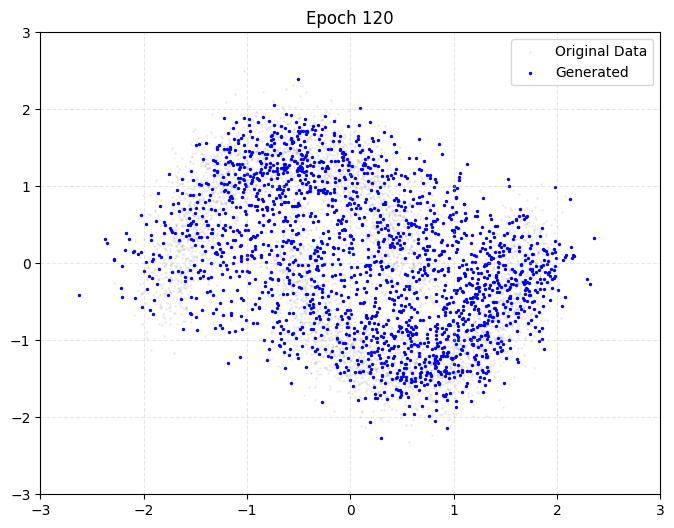

39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.4533
Epoch 121/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4413
Epoch 122/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4525
Epoch 123/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4520
Epoch 124/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4527
Epoch 125/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4560
Epoch 126/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4422
Epoch 127/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.4380
Epoch 128/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.4427
Epoch 129/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4561
Epoch 130/300
37/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4544
--- Generating points at epoch 130 ---


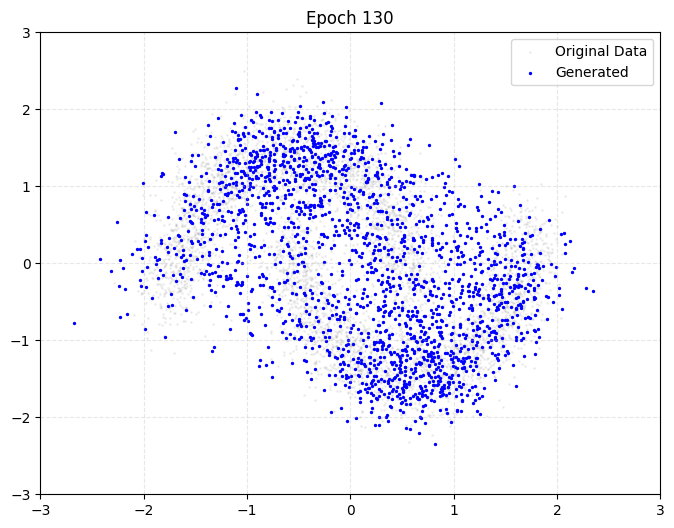

39/39 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - loss: 0.4551
Epoch 131/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 0.4504
Epoch 132/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.4584
Epoch 133/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4651
Epoch 134/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4549
Epoch 135/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4509
Epoch 136/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4555
Epoch 137/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4429
Epoch 138/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4454
Epoch 139/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4564
Epoch 140/300
31/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4511
--- Generating points at epoch 140 ---


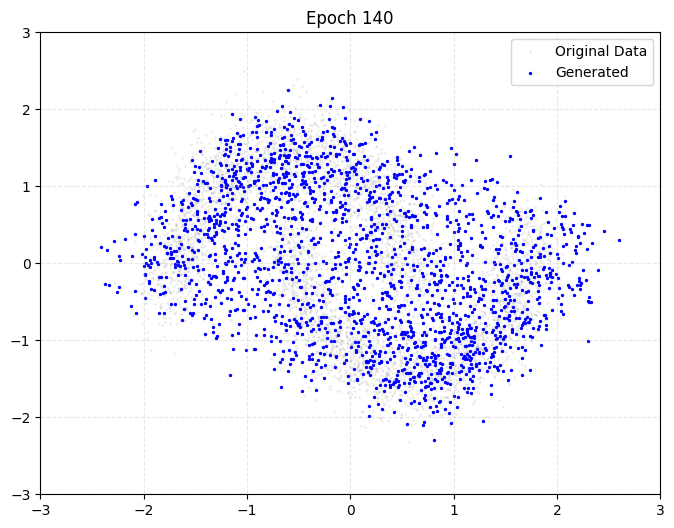

39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.4535
Epoch 141/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4564
Epoch 142/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4462
Epoch 143/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4552
Epoch 144/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4446
Epoch 145/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4597
Epoch 146/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4476
Epoch 147/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4417
Epoch 148/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4428
Epoch 149/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4462
Epoch 150/300
32/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4414
--- Generating points at epoch 150 ---


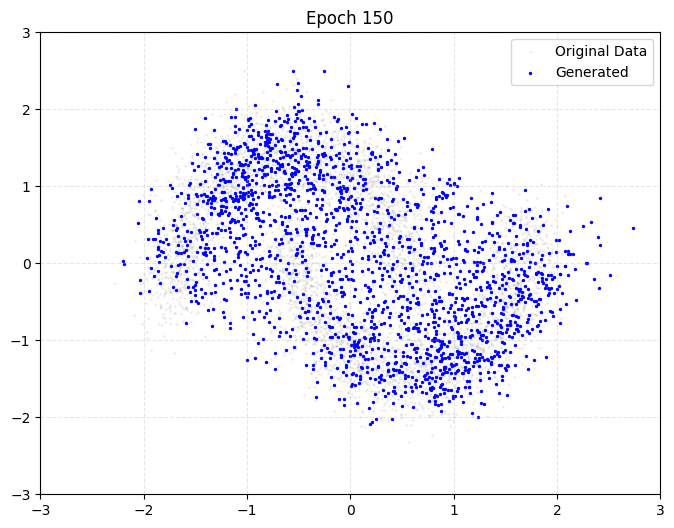

39/39 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.4446
Epoch 151/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4406
Epoch 152/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4537
Epoch 153/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4567
Epoch 154/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4469
Epoch 155/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4524
Epoch 156/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4428
Epoch 157/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4451
Epoch 158/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4524
Epoch 159/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4431
Epoch 160/300
31/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4445
--- Generating points at epoch 160 ---


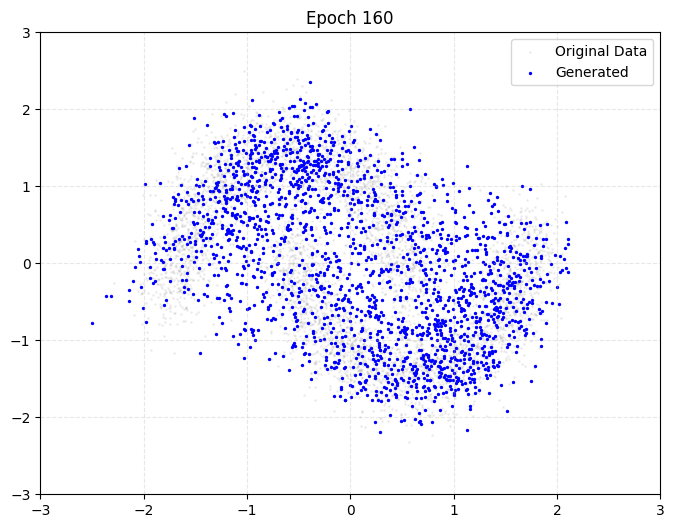

39/39 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.4472
Epoch 161/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4325
Epoch 162/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4570
Epoch 163/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4424
Epoch 164/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4668
Epoch 165/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4564
Epoch 166/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4560
Epoch 167/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4534
Epoch 168/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4498
Epoch 169/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4555
Epoch 170/300
28/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4528
--- Generating points at epoch 170 ---


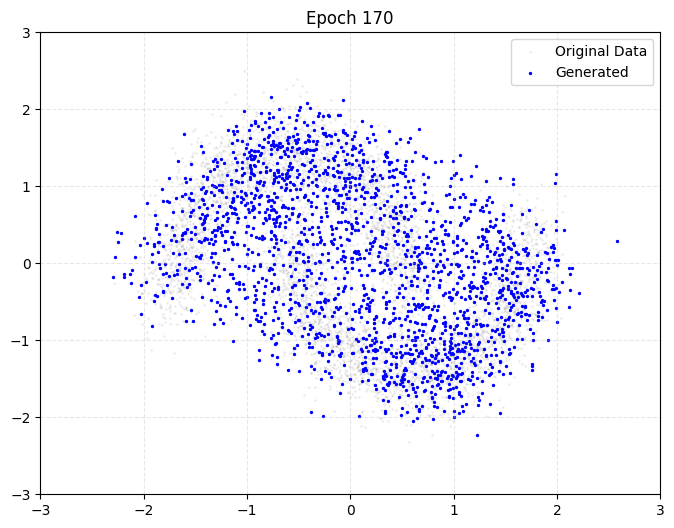

39/39 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.4544
Epoch 171/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4547
Epoch 172/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4518
Epoch 173/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4482
Epoch 174/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.4608
Epoch 175/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.4524
Epoch 176/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.4577
Epoch 177/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.4466
Epoch 178/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.4484
Epoch 179/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.4477
Epoch 180/300
31/39 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.4463
--- Generating points at epoch 180 ---


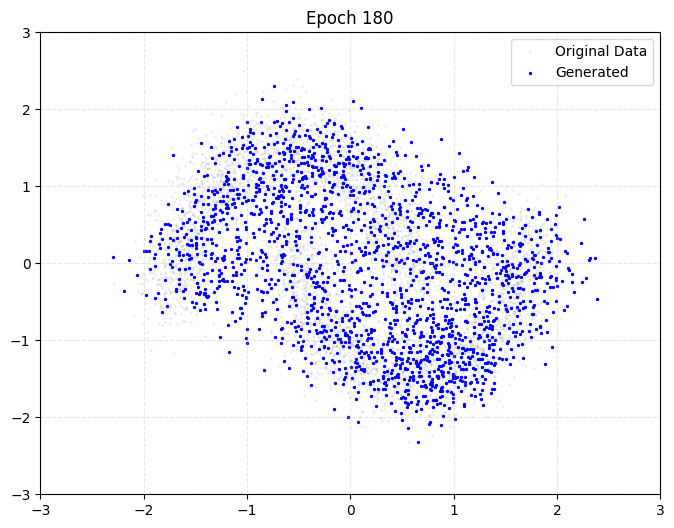

39/39 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.4490
Epoch 181/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.4545
Epoch 182/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.4528
Epoch 183/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.4524
Epoch 184/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.4372
Epoch 185/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4539
Epoch 186/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4462
Epoch 187/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4447
Epoch 188/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4416
Epoch 189/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.4603
Epoch 190/300
29/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4403
--- Generating points at epoch 190 ---


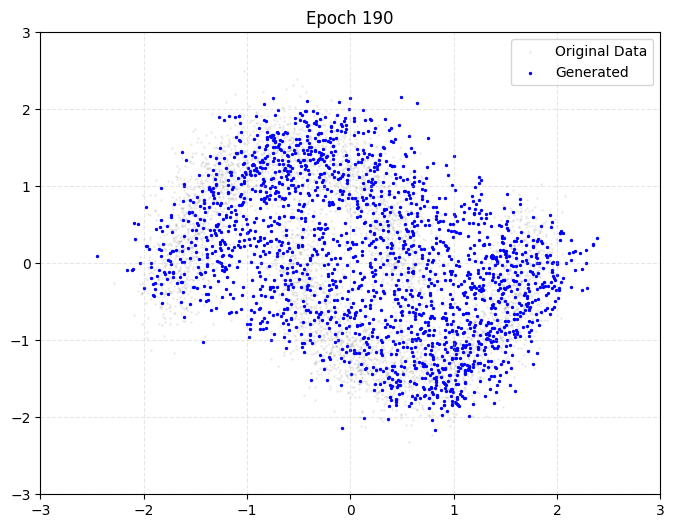

39/39 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.4447
Epoch 191/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4427
Epoch 192/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4570
Epoch 193/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4527
Epoch 194/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4683
Epoch 195/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4591
Epoch 196/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4609
Epoch 197/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4402
Epoch 198/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4467
Epoch 199/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4486
Epoch 200/300
31/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4565
--- Generating points at epoch 200 ---


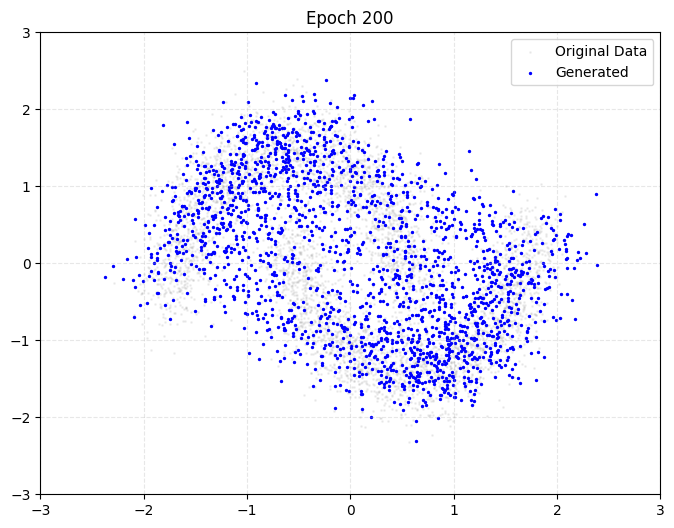

39/39 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - loss: 0.4577
Epoch 201/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4607
Epoch 202/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4583
Epoch 203/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4553
Epoch 204/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4515
Epoch 205/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4479
Epoch 206/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4489
Epoch 207/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4359
Epoch 208/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4518
Epoch 209/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4577
Epoch 210/300
29/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4416
--- Generating points at epoch 210 ---


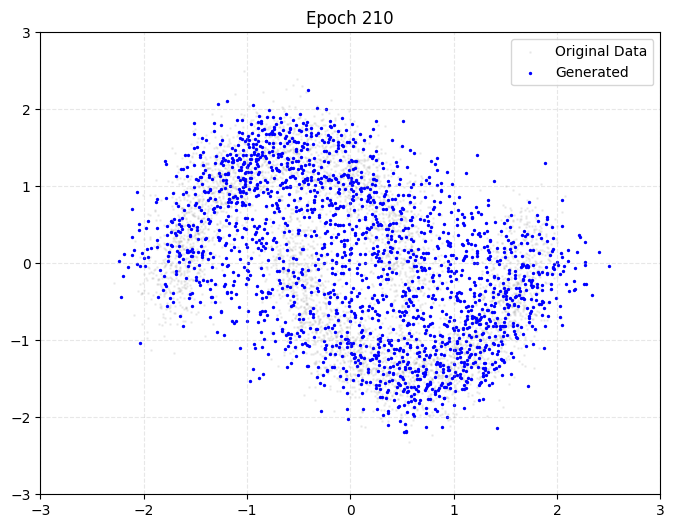

39/39 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - loss: 0.4451
Epoch 211/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4387
Epoch 212/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4377
Epoch 213/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4472
Epoch 214/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4513
Epoch 215/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4430
Epoch 216/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4549
Epoch 217/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4532
Epoch 218/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4325
Epoch 219/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4472
Epoch 220/300
29/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4345
--- Generating points at epoch 220 ---


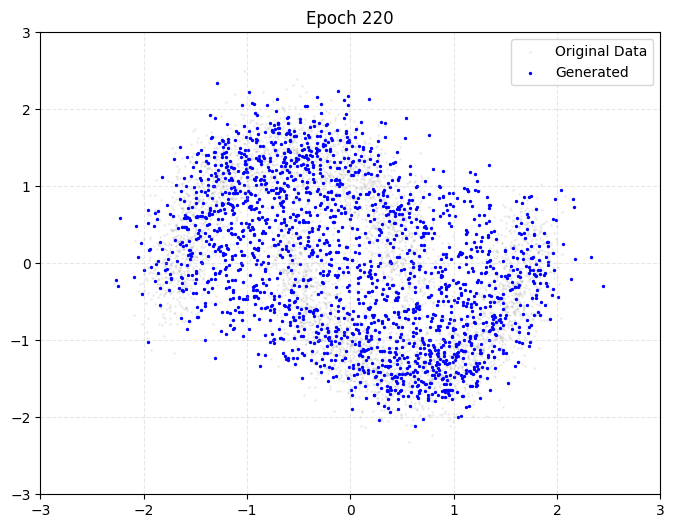

39/39 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.4368
Epoch 221/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4493
Epoch 222/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4387
Epoch 223/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4446
Epoch 224/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.4476
Epoch 225/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.4468
Epoch 226/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.4495
Epoch 227/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.4370
Epoch 228/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.4443
Epoch 229/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.4429
Epoch 230/300
34/39 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.4431
--- Generating points at epoch 230 ---


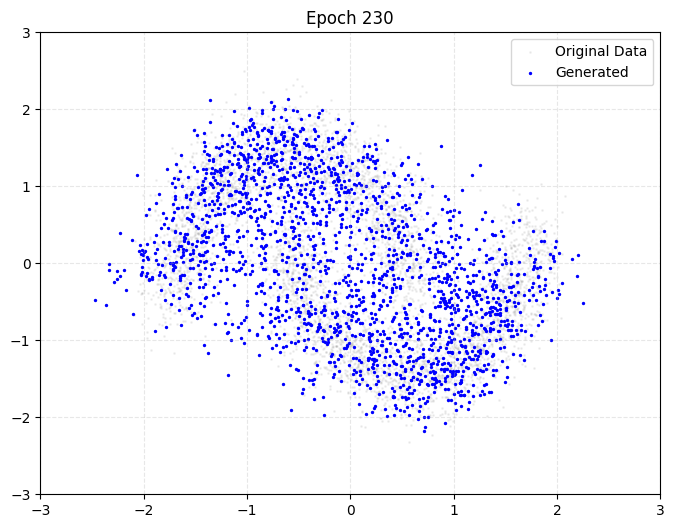

39/39 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - loss: 0.4443
Epoch 231/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.4394
Epoch 232/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.4481
Epoch 233/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.4444
Epoch 234/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.4567
Epoch 235/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.4507
Epoch 236/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.4342
Epoch 237/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.4477
Epoch 238/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4329
Epoch 239/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4472
Epoch 240/300
31/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4488
--- Generating points at epoch 240 ---


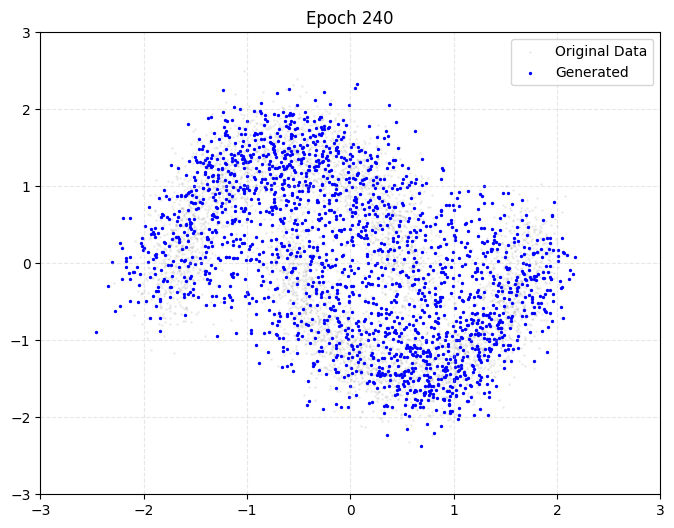

39/39 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.4512
Epoch 241/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4415
Epoch 242/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4546
Epoch 243/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4495
Epoch 244/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4376
Epoch 245/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4520
Epoch 246/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4358
Epoch 247/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4416
Epoch 248/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4525
Epoch 249/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4307
Epoch 250/300
29/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4466
--- Generating points at epoch 250 ---


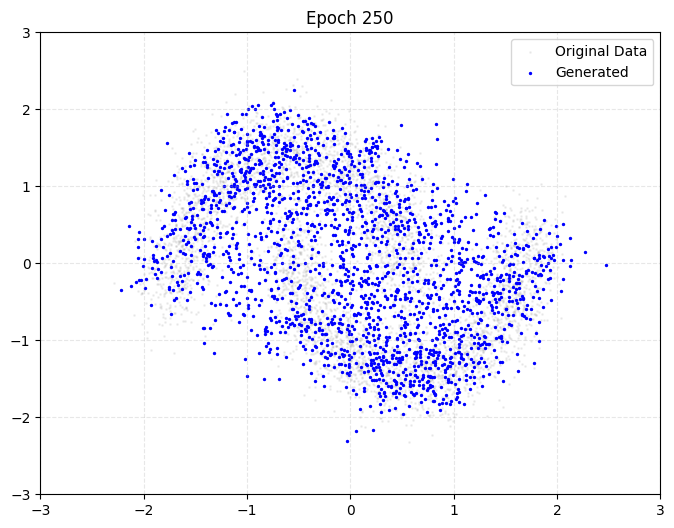

39/39 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.4489
Epoch 251/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4421
Epoch 252/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.4504
Epoch 253/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4408
Epoch 254/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4423
Epoch 255/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4531
Epoch 256/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4388
Epoch 257/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4459
Epoch 258/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4319
Epoch 259/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4489
Epoch 260/300
30/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4385
--- Generating points at epoch 260 ---


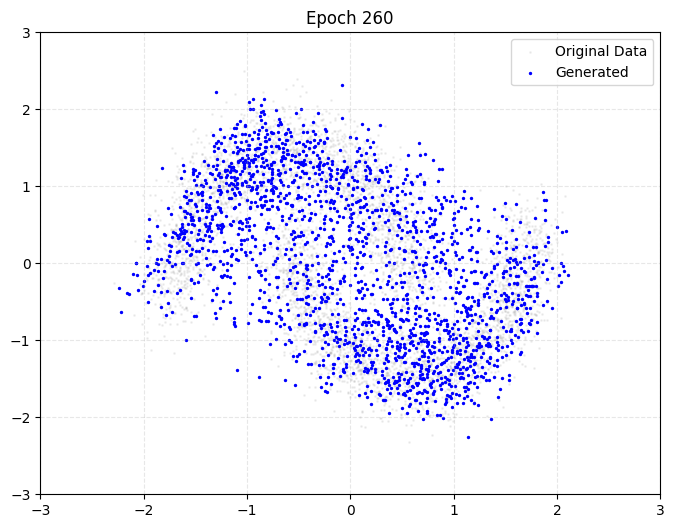

39/39 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - loss: 0.4421
Epoch 261/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4423
Epoch 262/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.4445
Epoch 263/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4426
Epoch 264/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4371
Epoch 265/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4495
Epoch 266/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4446
Epoch 267/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4504
Epoch 268/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4446
Epoch 269/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4456
Epoch 270/300
31/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4458
--- Generating points at epoch 270 ---


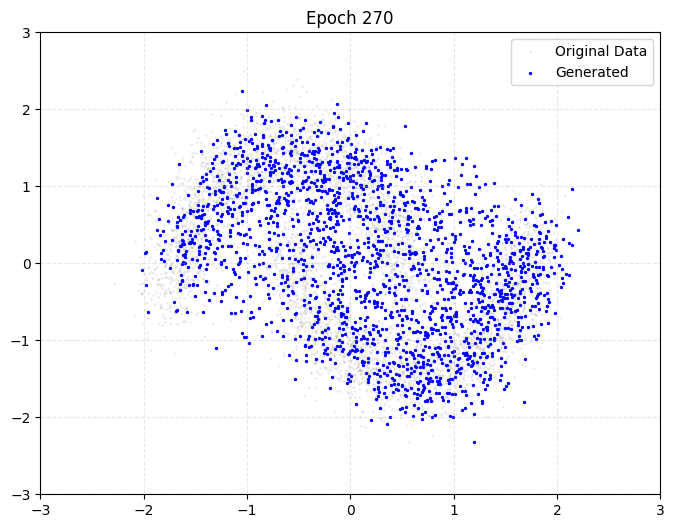

39/39 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.4473
Epoch 271/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4417
Epoch 272/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4335
Epoch 273/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4440
Epoch 274/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4546
Epoch 275/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.4390
Epoch 276/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4415
Epoch 277/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4496
Epoch 278/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.4409
Epoch 279/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.4333
Epoch 280/300
38/39 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.4444
--- Generating points at epoch 280 ---


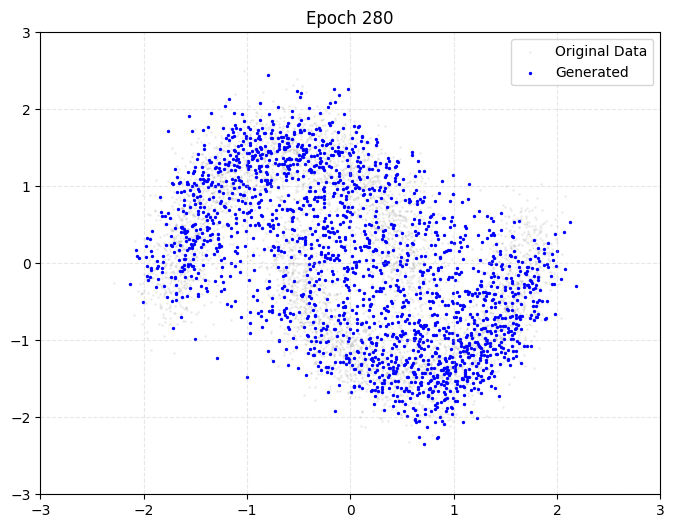

39/39 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.4447
Epoch 281/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.4456
Epoch 282/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.4352
Epoch 283/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.4364
Epoch 284/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.4437
Epoch 285/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.4559
Epoch 286/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4439
Epoch 287/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4337
Epoch 288/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4437
Epoch 289/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4426
Epoch 290/300
33/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4431
--- Generating points at epoch 290 ---


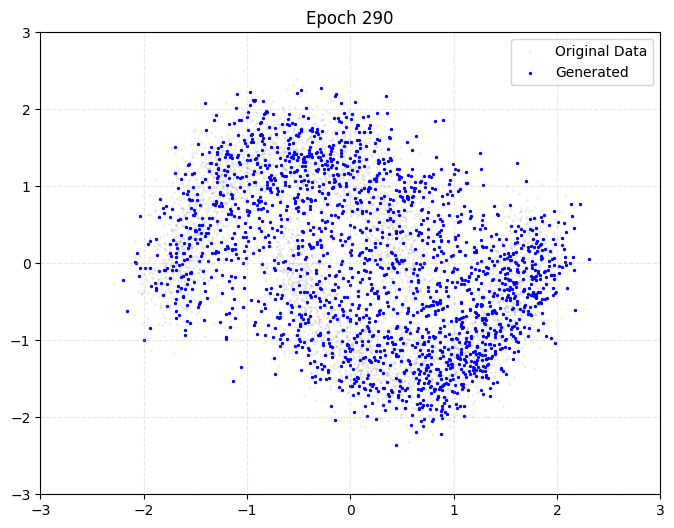

39/39 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - loss: 0.4445
Epoch 291/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4348
Epoch 292/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - loss: 0.4362
Epoch 293/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.4388
Epoch 294/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4414
Epoch 295/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4365
Epoch 296/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4381
Epoch 297/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4463
Epoch 298/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4460
Epoch 299/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4433
Epoch 300/300
27/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4285
--- Generating points at epoch 300 ---


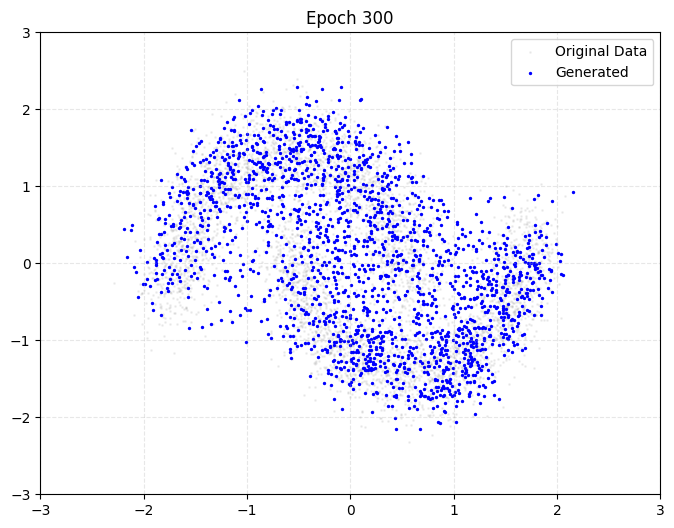

39/39 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.4341


In [ ]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
import numpy as np
import matplotlib.pyplot as plt
from sklearn.datasets import make_moons
from sklearn.preprocessing import StandardScaler

# --- Step 2: Noise Scheduler Functions ---

def get_noise_scheduler_vars(timesteps):
    s = 0.008
    steps = timesteps + 1
    x = tf.linspace(0.0, tf.cast(timesteps, tf.float32), steps)

    pi_f32 = tf.constant(np.pi, dtype=tf.float32)

    alphas_cumprod = tf.cos(((x / tf.cast(timesteps, tf.float32)) + s) / (1 + s) * pi_f32 * 0.5) ** 2
    alphas_cumprod = alphas_cumprod / alphas_cumprod[0]
    alphas_cumprod = alphas_cumprod[1:]

    betas = 1.0 - (alphas_cumprod / tf.concat([tf.constant([1.0], dtype=tf.float32), alphas_cumprod[:-1]], axis=0))
    betas = tf.clip_by_value(betas, 0.0001, 0.02)

    alphas = 1.0 - betas
    alphas_cumprod = tf.math.cumprod(alphas)

    sqrt_alphas_cumprod = tf.sqrt(alphas_cumprod)
    sqrt_one_minus_alphas_cumprod = tf.sqrt(1.0 - alphas_cumprod)

    return betas, alphas, alphas_cumprod, sqrt_alphas_cumprod, sqrt_one_minus_alphas_cumprod


def add_noise_at_timestep(original_points, t, sqrt_alphas_cumprod, sqrt_one_minus_alphas_cumprod):
    t_broadcast = tf.fill(dims=(tf.shape(original_points)[0],), value=t)

    sqrt_alpha_t = tf.gather(sqrt_alphas_cumprod, t_broadcast)
    sqrt_one_minus_alpha_t = tf.gather(sqrt_one_minus_alphas_cumprod, t_broadcast)

    sqrt_alpha_t = tf.reshape(sqrt_alpha_t, [-1, 1])
    sqrt_one_minus_alpha_t = tf.reshape(sqrt_one_minus_alpha_t, [-1, 1])

    noise = tf.random.normal(shape=tf.shape(original_points), dtype=original_points.dtype)

    noisy_points = (
        sqrt_alpha_t * original_points +
        sqrt_one_minus_alpha_t * noise
    )
    return noisy_points

def plot_forward_process(all_points, timesteps_to_plot, sqrt_alphas_cumprod, sqrt_one_minus_alphas_cumprod):
    print("Generating noisy examples for forward process (full dataset)...")

    plt.figure(figsize=(12, 8))

    for i, t in enumerate(timesteps_to_plot):
        noisy_points = add_noise_at_timestep(
            all_points, t,
            sqrt_alphas_cumprod,
            sqrt_one_minus_alphas_cumprod
        )

        ax = plt.subplot(2, 3, i + 1)
        ax.scatter(noisy_points[:, 0], noisy_points[:, 1], s=1, alpha=0.1)
        ax.set_title(f"t = {t}")
        ax.set_xlim(-3, 3)
        ax.set_ylim(-3, 3)
        ax.grid(True, linestyle='--', alpha=0.3)

    plt.suptitle("Forward Noising Process (on the Full Dataset)")
    plt.tight_layout()
    plt.show()

# --- Step 4: Create Training Dataset ---

def create_dataset_with_noise(x_train, batch_size, timesteps, sqrt_alphas_cumprod, sqrt_one_minus_alphas_cumprod):
    dataset = tf.data.Dataset.from_tensor_slices(x_train)
    dataset = dataset.shuffle(buffer_size=1024).batch(batch_size, drop_remainder=True)

    def add_noise(points):
        batch_size = tf.shape(points)[0]

        t = tf.random.uniform(minval=0, maxval=timesteps, shape=(batch_size,), dtype=tf.int64)
        noise = tf.random.normal(shape=tf.shape(points), dtype=points.dtype)

        sqrt_alpha_t = tf.gather(sqrt_alphas_cumprod, t)
        sqrt_one_minus_alpha_t = tf.gather(sqrt_one_minus_alphas_cumprod, t)

        sqrt_alpha_t = tf.reshape(sqrt_alpha_t, [-1, 1])
        sqrt_one_minus_alpha_t = tf.reshape(sqrt_one_minus_alpha_t, [-1, 1])

        noisy_points = sqrt_alpha_t * points + sqrt_one_minus_alpha_t * noise

        return (noisy_points, t), noise

    dataset = dataset.map(add_noise, num_parallel_calls=tf.data.AUTOTUNE)
    dataset = dataset.prefetch(tf.data.AUTOTUNE)
    return dataset

# --- Step 5: Build the Model (MLP) ---

def get_denoising_model(timesteps):
    point_input = layers.Input(shape=(2,), name="point_input")
    time_input = layers.Input(shape=(), dtype='int64', name="time_input")

    time_emb_dim = 32

    time_emb = layers.Embedding(timesteps, time_emb_dim)(time_input)

    combined_input = layers.Concatenate()([point_input, time_emb])

    x = layers.Dense(128, activation='swish')(combined_input)
    x = layers.Dense(128, activation='swish')(x)
    output = layers.Dense(2, activation='linear')(x)

    model = keras.Model([point_input, time_input], output)
    return model

# --- Step 6: Create Generation Callback ---

class PointGeneratorCallback(keras.callbacks.Callback):
    def __init__(self, x_train, num_points, timesteps, betas, alphas, alphas_cumprod, epoch_interval):
        self.x_train = x_train
        self.num_points = num_points
        self.timesteps = timesteps
        self.betas = betas
        self.alphas = alphas
        self.alphas_cumprod = alphas_cumprod
        self.epoch_interval = epoch_interval
        self.generator_shape = (num_points, 2)

    @tf.function
    def generate_points(self, betas, alphas, alphas_cumprod):
        points = tf.random.normal(shape=self.generator_shape)

        for t in reversed(range(self.timesteps)):
            t_batch = tf.fill(dims=(self.num_points,), value=t)

            predicted_noise = self.model([points, t_batch], training=False)

            alpha_t = tf.gather(alphas, t)
            alpha_cumprod_t = tf.gather(alphas_cumprod, t)
            beta_t = tf.gather(betas, t)

            term1 = 1.0 / tf.sqrt(alpha_t)
            term2 = (1.0 - alpha_t) / tf.sqrt(1.0 - alpha_cumprod_t)
            points = term1 * (points - term2 * predicted_noise)

            if t > 0:
                variance = beta_t
                points = points + tf.sqrt(variance) * tf.random.normal(shape=self.generator_shape)

        return points

    def on_epoch_end(self, epoch, logs=None):
        if (epoch + 1) % self.epoch_interval == 0:
            print(f"\n--- Generating points at epoch {epoch + 1} ---")

            generated_points = self.generate_points(
                self.betas, self.alphas, self.alphas_cumprod
            )

            plt.figure(figsize=(8, 6))
            plt.scatter(self.x_train[:, 0], self.x_train[:, 1], s=1, c='gray', alpha=0.1, label='Original Data')
            plt.scatter(generated_points[:, 0], generated_points[:, 1], s=2, c='blue', alpha=1.0, label='Generated')
            plt.title(f"Epoch {epoch + 1}")
            plt.legend()
            plt.xlim(-3, 3)
            plt.ylim(-3, 3)
            plt.grid(True, linestyle='--', alpha=0.3)
            plt.show()

# --- Main Training Block ---

TIMESTEPS = 200
N_SAMPLES = 5000
BATCH_SIZE = 128
EPOCHS = 300
EPOCH_INTERVAL = 10
NUM_GEN_POINTS = 2000
LEARNING_RATE = 5e-3
WEIGHT_DECAY = 0.004

print("--- 1. Getting Data ---")
x_train, y_train = get_data(n_samples=N_SAMPLES)
plot_data(x_train, y_train)

print(f"\n--- 2. Getting Noise Schedule (T={TIMESTEPS}) ---")
betas, alphas, alphas_cumprod, sqrt_alphas_cumprod, sqrt_one_minus_alphas_cumprod = get_noise_scheduler_vars(TIMESTEPS)

print("\n--- 3. Plotting Forward Process ---")
timesteps_to_plot = [0, 10, 20, 50, 100, 199]
plot_forward_process(x_train, timesteps_to_plot, sqrt_alphas_cumprod, sqrt_one_minus_alphas_cumprod)

print("\n--- 4. Creating Training Dataset ---")
train_dataset = create_dataset_with_noise(
    x_train,
    BATCH_SIZE,
    TIMESTEPS,
    sqrt_alphas_cumprod,
    sqrt_one_minus_alphas_cumprod
)

print("\n--- 5. Building Model ---")
denoising_model = get_denoising_model(TIMESTEPS)
denoising_model.summary()

print("\n--- 6. Setting up Training ---")
denoising_model.compile(
    optimizer=keras.optimizers.AdamW(learning_rate=LEARNING_RATE, weight_decay=WEIGHT_DECAY),
    loss=keras.losses.MeanSquaredError()
)

print("\n--- 7. Starting Training ---")
point_gen_callback = PointGeneratorCallback(
    x_train=x_train,
    num_points=NUM_GEN_POINTS,
    timesteps=TIMESTEPS,
    betas=betas,
    alphas=alphas,
    alphas_cumprod=alphas_cumprod,
    epoch_interval=EPOCH_INTERVAL
)

denoising_model.fit(
    train_dataset,
    epochs=EPOCHS,
    callbacks=[point_gen_callback]
)



## Conditional Diffusion

--- 1. Getting Data ---
Generating 5000 2D 'moon' samples...
Plotting data...


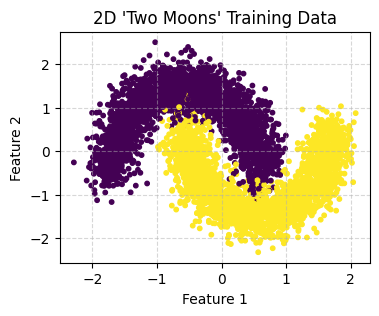


--- 2. Getting Noise Schedule (T=200) ---

--- 3. Plotting Forward Process ---
Generating noisy examples for forward process (full dataset)...


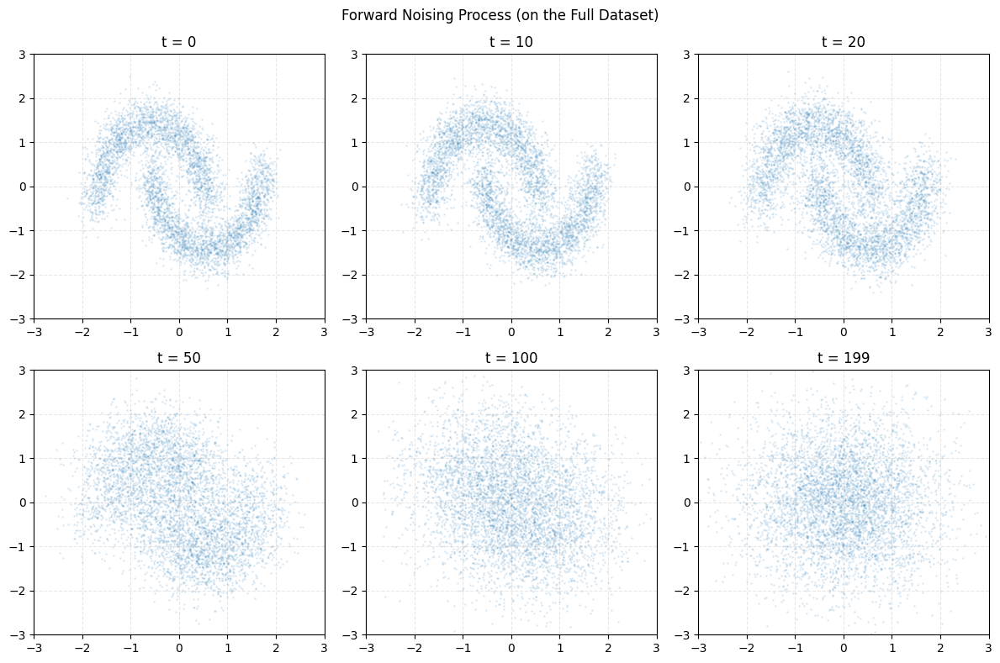


--- 4. Creating Training Dataset ---

--- 5. Building Model ---


Model: "functional_17"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ time_input          │ (None)            │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ class_input         │ (None)            │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ point_input         │ (None, 2)         │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ embedding_24        │ (None, 32)        │      6,400 │ time_input[0][0]  │
│ (Embedding)         │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ embedding_25        │ (None, 16)        │         32 │ class_input[0][0] │
│ (Embedding)         │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_17      │ (None, 50)        │          0 │ point_input[0][0… │
│ (Concatenate)       │                   │            │ embedding_24[0][… │
│                     │                   │            │ embedding_25[0][… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_55 (Dense)    │ (None, 128)       │      6,528 │ concatenate_17[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_56 (Dense)    │ (None, 128)       │     16,512 │ dense_55[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_57 (Dense)    │ (None, 2)         │        258 │ dense_56[0][0]    │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 29,730 (116.13 KB)

 Trainable params: 29,730 (116.13 KB)

 Non-trainable params: 0 (0.00 B)


--- 6. Setting up Training ---

--- 7. Starting Training ---
Epoch 1/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 0.7459
Epoch 2/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4957
Epoch 3/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4740
Epoch 4/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4704
Epoch 5/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4756
Epoch 6/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4784
Epoch 7/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4688
Epoch 8/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4500
Epoch 9/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4413
Epoch 10/300
35/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4361
--- Generating points at epoch 10 ---


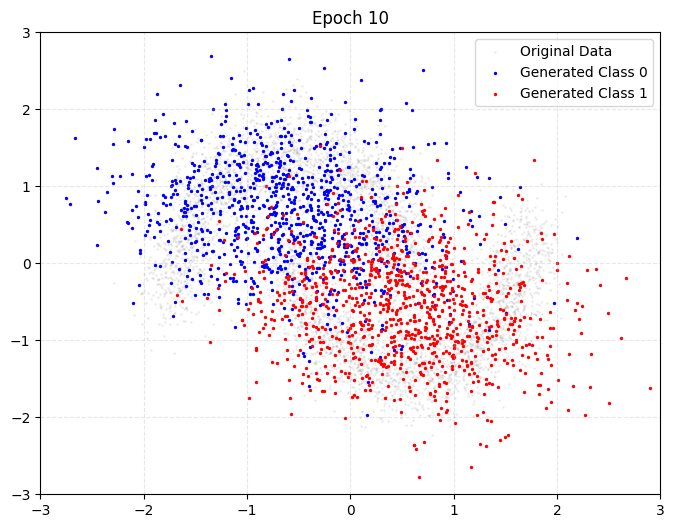

39/39 ━━━━━━━━━━━━━━━━━━━━ 29s 775ms/step - loss: 0.4368
Epoch 11/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4159
Epoch 12/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4226
Epoch 13/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4134
Epoch 14/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4270
Epoch 15/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4186
Epoch 16/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4200
Epoch 17/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4277
Epoch 18/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4062
Epoch 19/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4193
Epoch 20/300
38/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4211
--- Generating points at epoch 20 ---


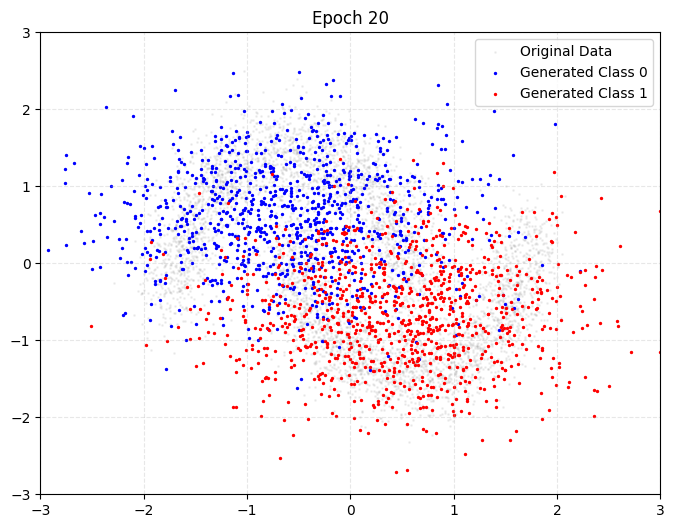

39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.4214
Epoch 21/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4251
Epoch 22/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4148
Epoch 23/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4156
Epoch 24/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.4286
Epoch 25/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4169
Epoch 26/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4161
Epoch 27/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.4146
Epoch 28/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.4169
Epoch 29/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.4178
Epoch 30/300
33/39 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.4143
--- Generating points at epoch 30 ---


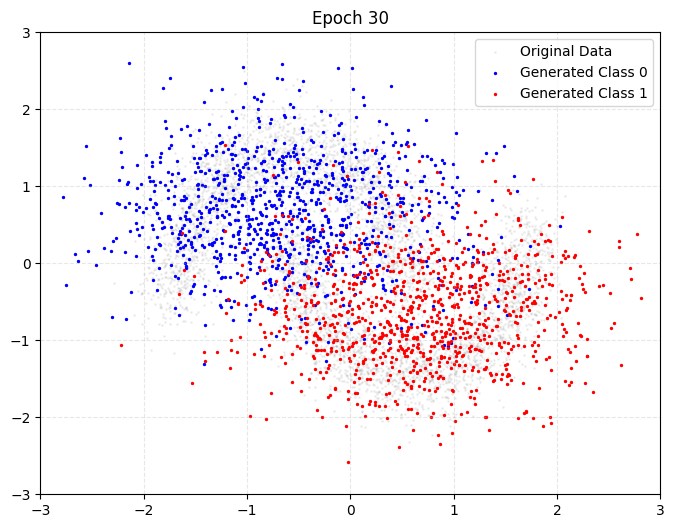

39/39 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 0.4155
Epoch 31/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.4119
Epoch 32/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4131
Epoch 33/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4112
Epoch 34/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4187
Epoch 35/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4082
Epoch 36/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4191
Epoch 37/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4043
Epoch 38/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4137
Epoch 39/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4162
Epoch 40/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4121
--- Generating points at epoch 40 ---


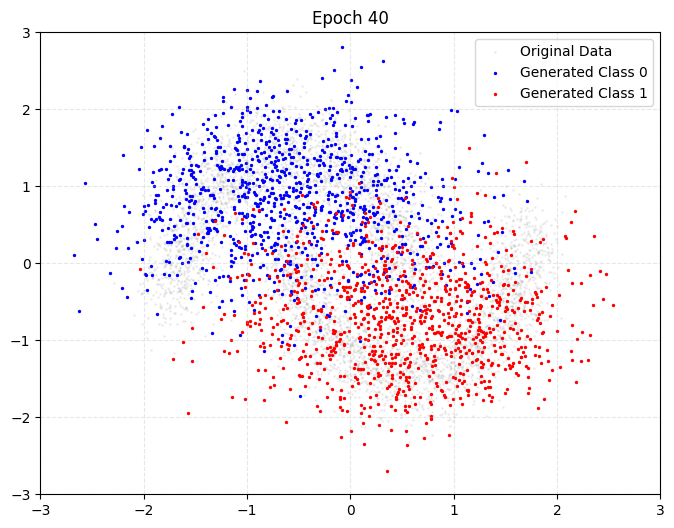

39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.4122
Epoch 41/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4129
Epoch 42/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4025
Epoch 43/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4093
Epoch 44/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3966
Epoch 45/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4003
Epoch 46/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4033
Epoch 47/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3928
Epoch 48/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4061
Epoch 49/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4002
Epoch 50/300
37/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4030
--- Generating points at epoch 50 ---


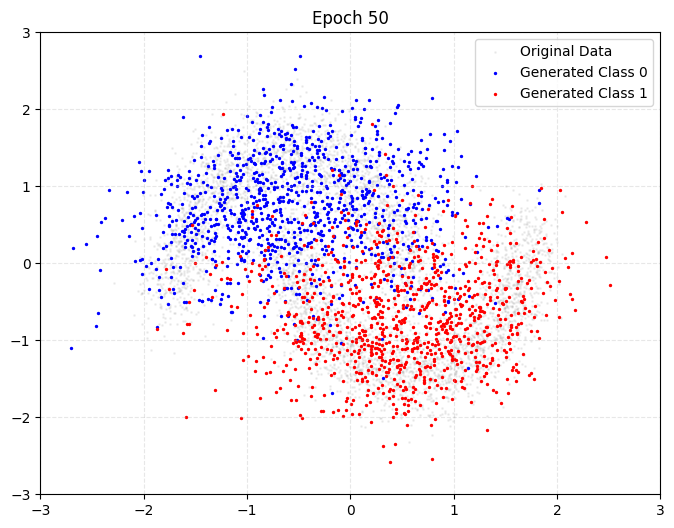

39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.4037
Epoch 51/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3931
Epoch 52/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3975
Epoch 53/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3981
Epoch 54/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3950
Epoch 55/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4000
Epoch 56/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3945
Epoch 57/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4016
Epoch 58/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4015
Epoch 59/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4022
Epoch 60/300
35/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3948
--- Generating points at epoch 60 ---


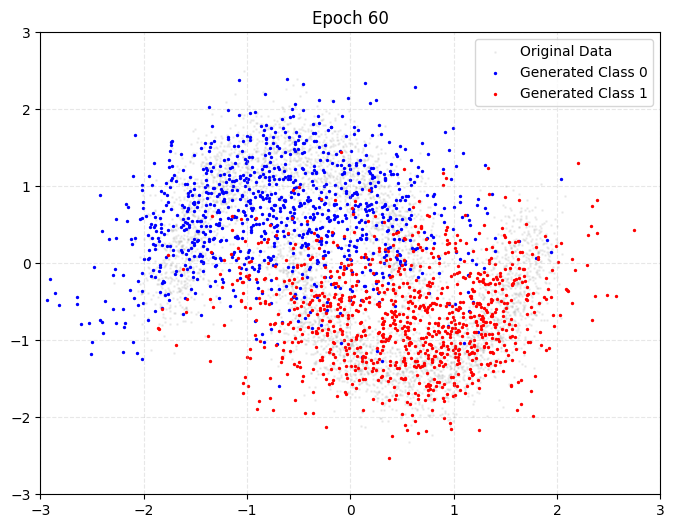

39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.3965
Epoch 61/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4043
Epoch 62/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4037
Epoch 63/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4086
Epoch 64/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4022
Epoch 65/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3993
Epoch 66/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4007
Epoch 67/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3978
Epoch 68/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3977
Epoch 69/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4064
Epoch 70/300
34/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3965
--- Generating points at epoch 70 ---


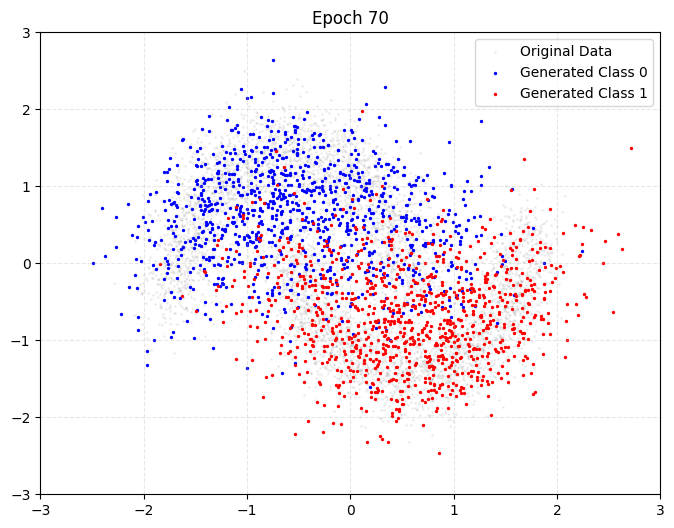

39/39 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.3977
Epoch 71/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3948
Epoch 72/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3927
Epoch 73/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3990
Epoch 74/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3889
Epoch 75/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4027
Epoch 76/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3829
Epoch 77/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3902
Epoch 78/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3840
Epoch 79/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3942
Epoch 80/300
30/39 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3850
--- Generating points at epoch 80 ---


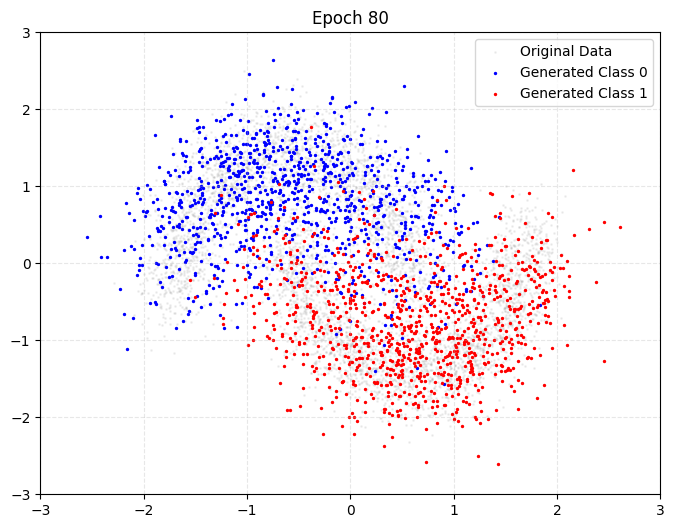

39/39 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.3883
Epoch 81/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3799
Epoch 82/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3944
Epoch 83/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3948
Epoch 84/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.3921
Epoch 85/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3941
Epoch 86/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3929
Epoch 87/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3858
Epoch 88/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3797
Epoch 89/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3785
Epoch 90/300
32/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3910
--- Generating points at epoch 90 ---


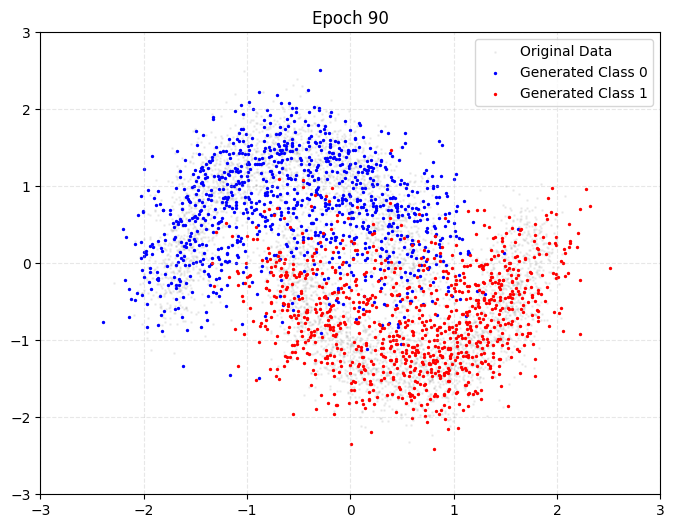

39/39 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.3919
Epoch 91/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3818
Epoch 92/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3842
Epoch 93/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3789
Epoch 94/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3818
Epoch 95/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3791
Epoch 96/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3900
Epoch 97/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3679
Epoch 98/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3897
Epoch 99/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3771
Epoch 100/300
27/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3793
--- Generating points at epoch 100 ---


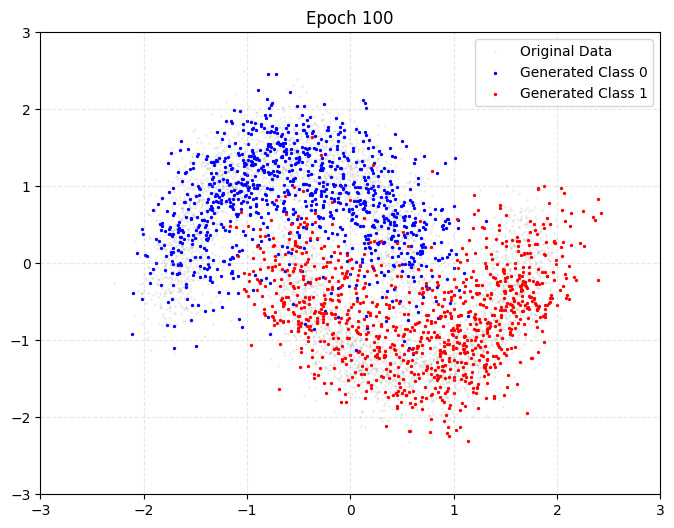

39/39 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.3815
Epoch 101/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3762
Epoch 102/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3749
Epoch 103/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3760
Epoch 104/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3854
Epoch 105/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3626
Epoch 106/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3791
Epoch 107/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3800
Epoch 108/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3718
Epoch 109/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3659
Epoch 110/300
27/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3775
--- Generating points at epoch 110 ---


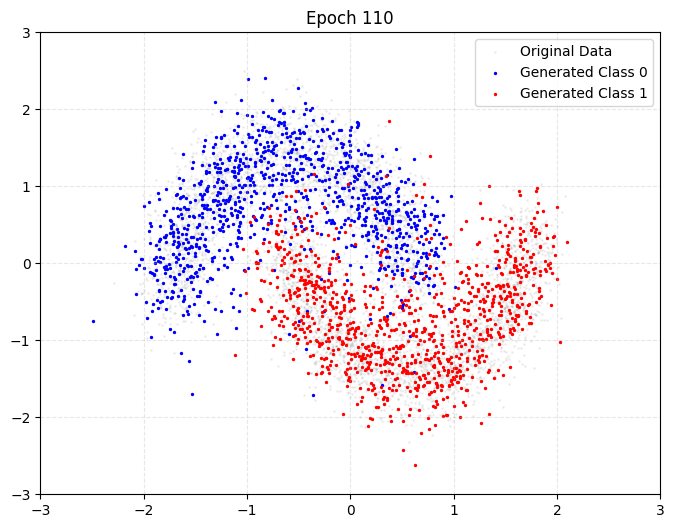

39/39 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.3782
Epoch 111/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3778
Epoch 112/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3566
Epoch 113/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3651
Epoch 114/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3740
Epoch 115/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3637
Epoch 116/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3675
Epoch 117/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3684
Epoch 118/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3639
Epoch 119/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3709
Epoch 120/300
30/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3602
--- Generating points at epoch 120 ---


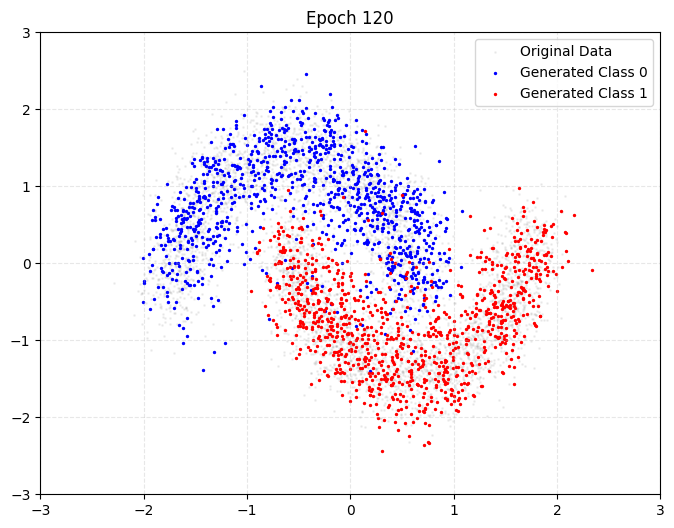

39/39 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.3629
Epoch 121/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3658
Epoch 122/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3726
Epoch 123/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3722
Epoch 124/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3646
Epoch 125/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3638
Epoch 126/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3702
Epoch 127/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3751
Epoch 128/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3728
Epoch 129/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3634
Epoch 130/300
31/39 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3617
--- Generating points at epoch 130 ---


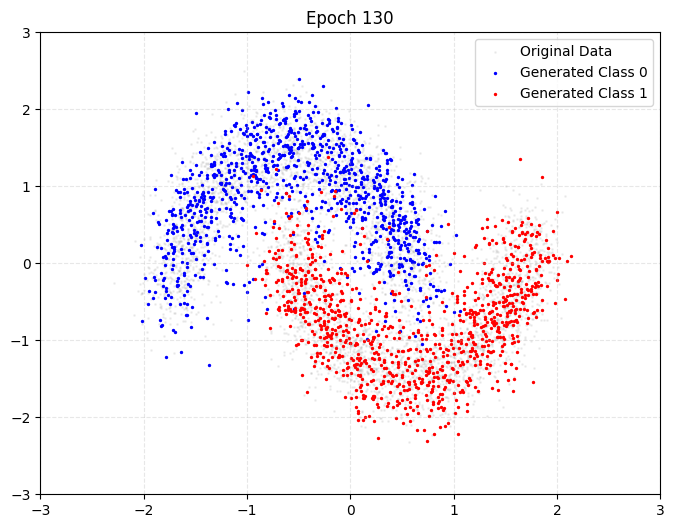

39/39 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 0.3642
Epoch 131/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3579
Epoch 132/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3637
Epoch 133/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3682
Epoch 134/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3751
Epoch 135/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3691
Epoch 136/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3678
Epoch 137/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3656
Epoch 138/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3691
Epoch 139/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3594
Epoch 140/300
29/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3578
--- Generating points at epoch 140 ---


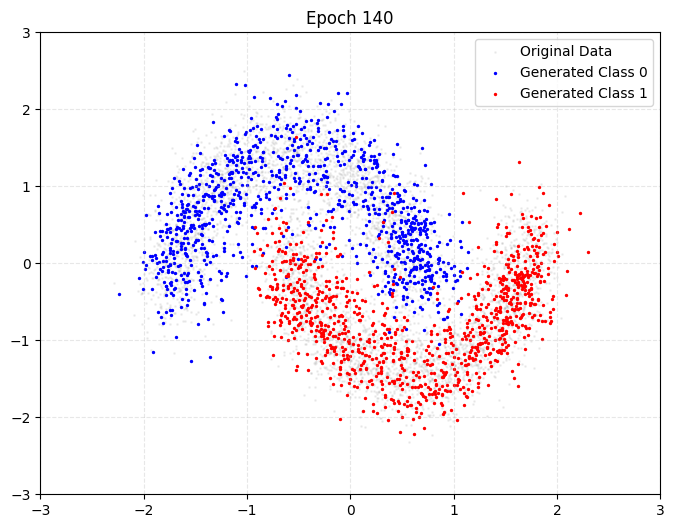

39/39 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.3622
Epoch 141/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3593
Epoch 142/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3584
Epoch 143/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3656
Epoch 144/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3665
Epoch 145/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3624
Epoch 146/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3694
Epoch 147/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3626
Epoch 148/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3640
Epoch 149/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3676
Epoch 150/300
37/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3558
--- Generating points at epoch 150 ---


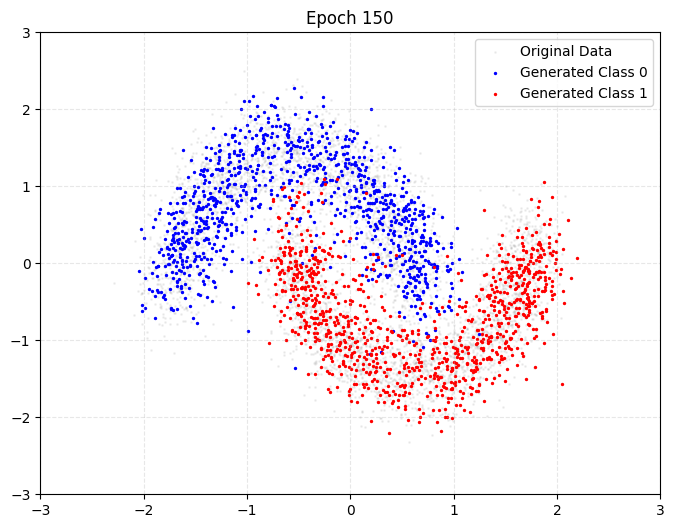

39/39 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - loss: 0.3566
Epoch 151/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3707
Epoch 152/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3706
Epoch 153/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3587
Epoch 154/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3578
Epoch 155/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3670
Epoch 156/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3763
Epoch 157/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3680
Epoch 158/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3667
Epoch 159/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3640
Epoch 160/300
29/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3489
--- Generating points at epoch 160 ---


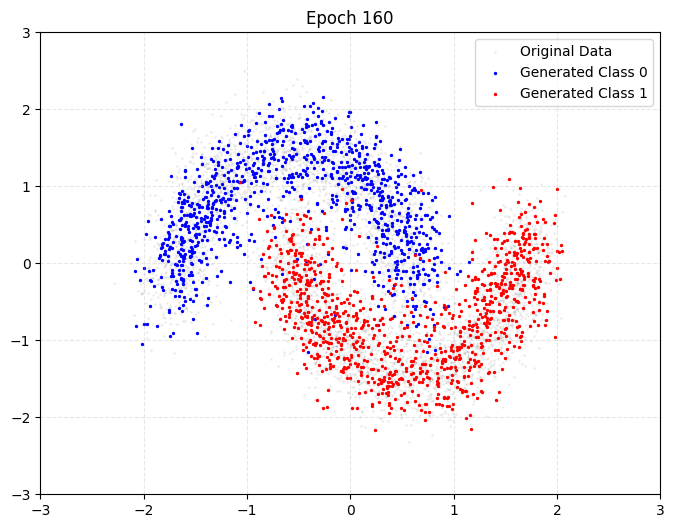

39/39 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.3525
Epoch 161/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3721
Epoch 162/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3750
Epoch 163/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3602
Epoch 164/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3635
Epoch 165/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3636
Epoch 166/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3703
Epoch 167/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3612
Epoch 168/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3652
Epoch 169/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3602
Epoch 170/300
29/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3607
--- Generating points at epoch 170 ---


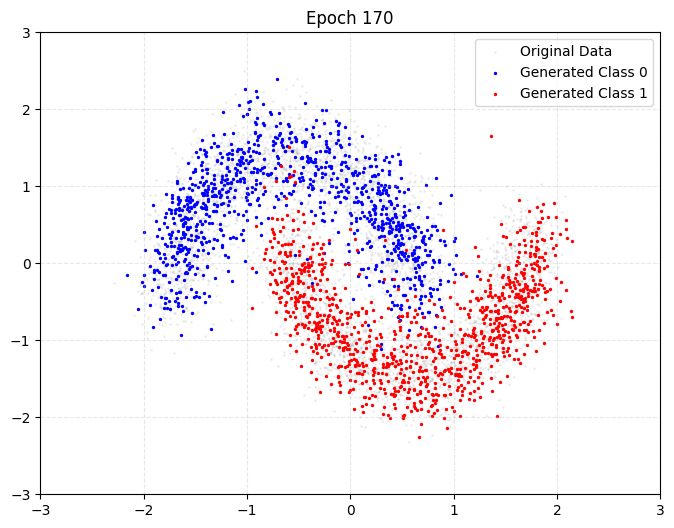

39/39 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - loss: 0.3623
Epoch 171/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3720
Epoch 172/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3606
Epoch 173/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3583
Epoch 174/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3586
Epoch 175/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3532
Epoch 176/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3546
Epoch 177/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3631
Epoch 178/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3680
Epoch 179/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3636
Epoch 180/300
30/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3626
--- Generating points at epoch 180 ---


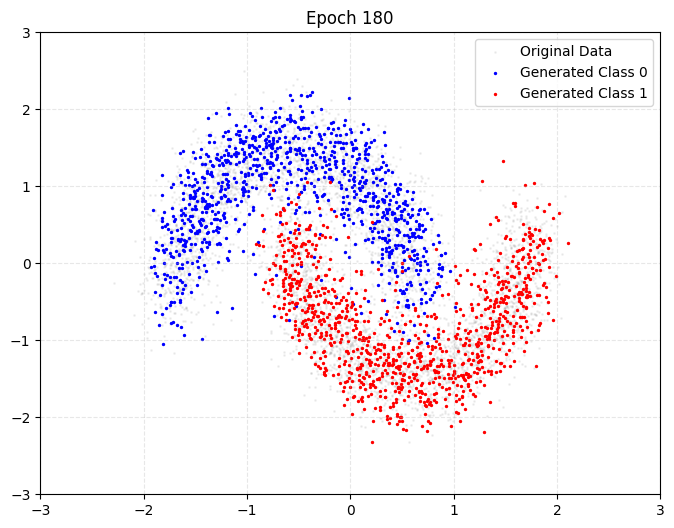

39/39 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - loss: 0.3643
Epoch 181/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3544
Epoch 182/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3653
Epoch 183/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3591
Epoch 184/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3572
Epoch 185/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.3664
Epoch 186/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 0.3728
Epoch 187/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3662
Epoch 188/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.3610
Epoch 189/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3651
Epoch 190/300
29/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3595
--- Generating points at epoch 190 ---


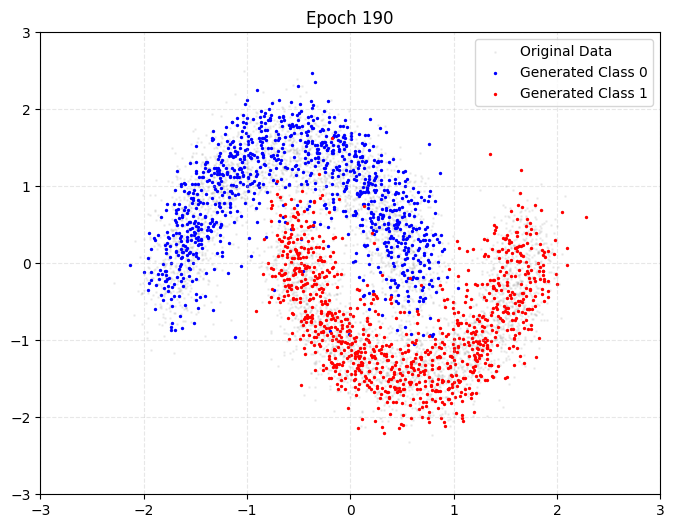

39/39 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.3639
Epoch 191/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3608
Epoch 192/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3568
Epoch 193/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3543
Epoch 194/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3651
Epoch 195/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3595
Epoch 196/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3587
Epoch 197/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3610
Epoch 198/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3628
Epoch 199/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3581
Epoch 200/300
27/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3529
--- Generating points at epoch 200 ---


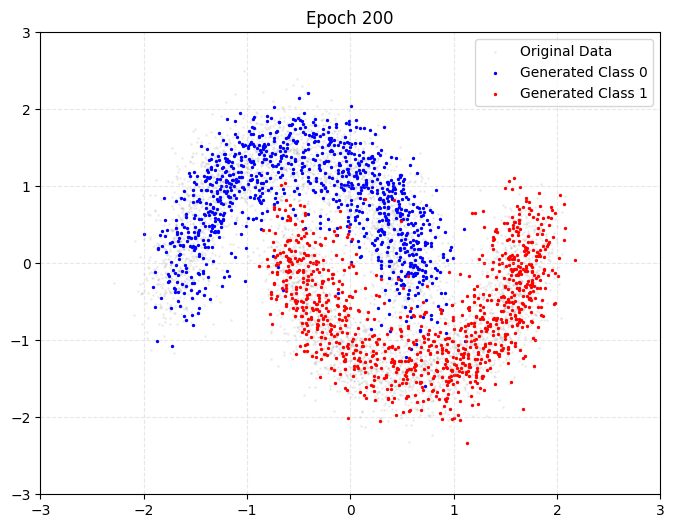

39/39 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - loss: 0.3581
Epoch 201/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3523
Epoch 202/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3614
Epoch 203/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3660
Epoch 204/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3524
Epoch 205/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3604
Epoch 206/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3560
Epoch 207/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3591
Epoch 208/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3579
Epoch 209/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3649
Epoch 210/300
29/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3615
--- Generating points at epoch 210 ---


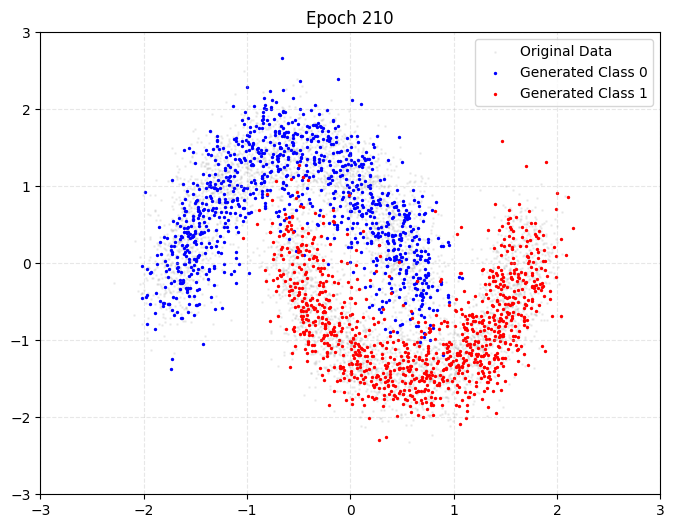

39/39 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.3649
Epoch 211/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3492
Epoch 212/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3524
Epoch 213/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3558
Epoch 214/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3652
Epoch 215/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3592
Epoch 216/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3649
Epoch 217/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3672
Epoch 218/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3583
Epoch 219/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3717
Epoch 220/300
28/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3523
--- Generating points at epoch 220 ---


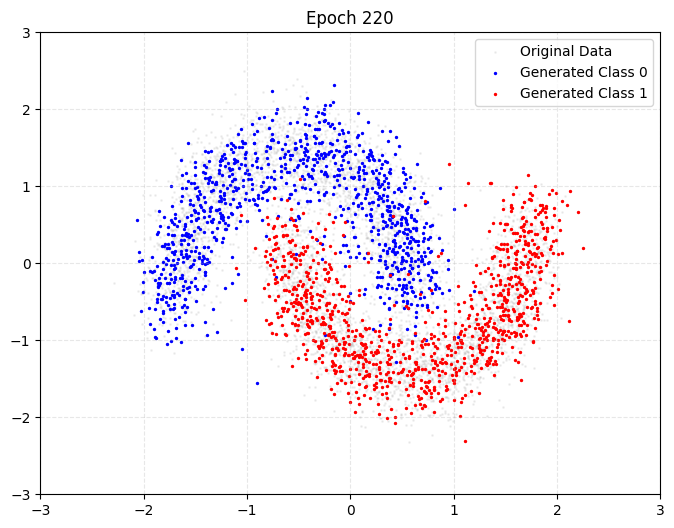

39/39 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.3551
Epoch 221/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3641
Epoch 222/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3601
Epoch 223/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3552
Epoch 224/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3515
Epoch 225/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.3539
Epoch 226/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3628
Epoch 227/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3658
Epoch 228/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3544
Epoch 229/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3768
Epoch 230/300
30/39 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3547
--- Generating points at epoch 230 ---


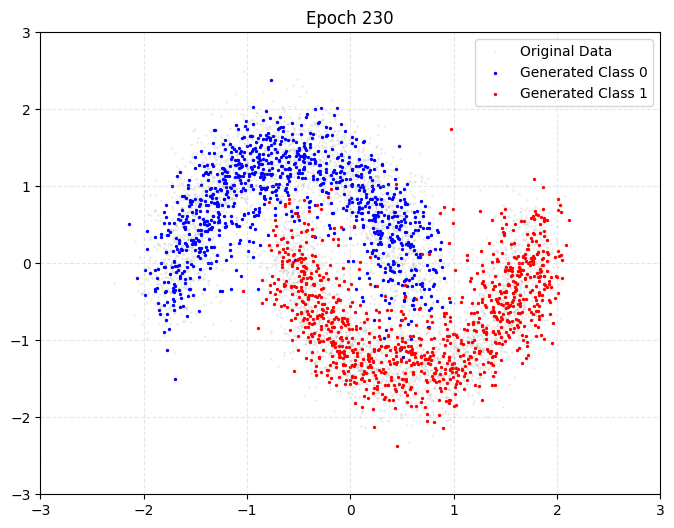

39/39 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.3574
Epoch 231/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3580
Epoch 232/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3449
Epoch 233/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3614
Epoch 234/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3616
Epoch 235/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3627
Epoch 236/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3440
Epoch 237/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3591
Epoch 238/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3716
Epoch 239/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3659
Epoch 240/300
30/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3578
--- Generating points at epoch 240 ---


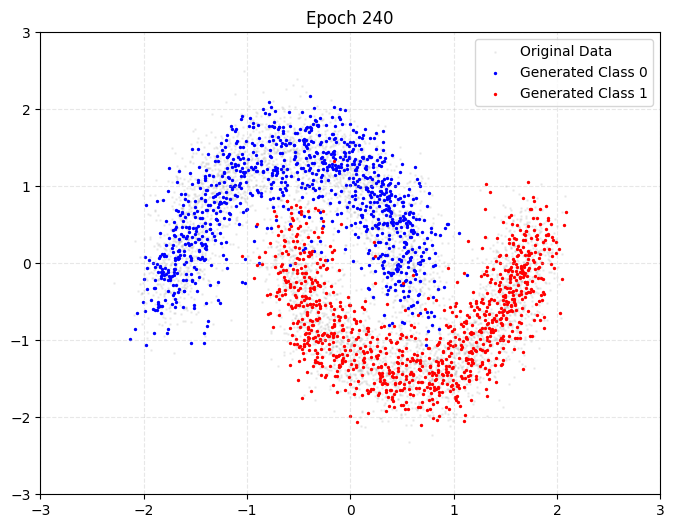

39/39 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - loss: 0.3590
Epoch 241/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3621
Epoch 242/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3605
Epoch 243/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3658
Epoch 244/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3604
Epoch 245/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3604
Epoch 246/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3646
Epoch 247/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3591
Epoch 248/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3543
Epoch 249/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3549
Epoch 250/300
27/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3772
--- Generating points at epoch 250 ---


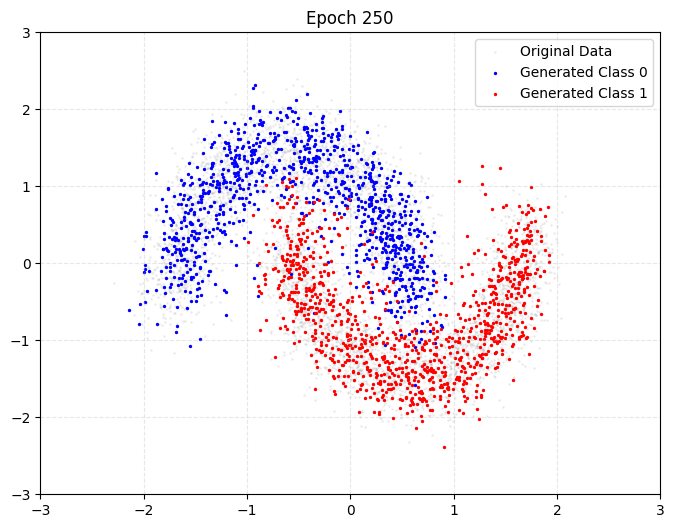

39/39 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.3766
Epoch 251/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3612
Epoch 252/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3565
Epoch 253/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3570
Epoch 254/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3666
Epoch 255/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3580
Epoch 256/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3587
Epoch 257/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3577
Epoch 258/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3744
Epoch 259/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3659
Epoch 260/300
29/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3615
--- Generating points at epoch 260 ---


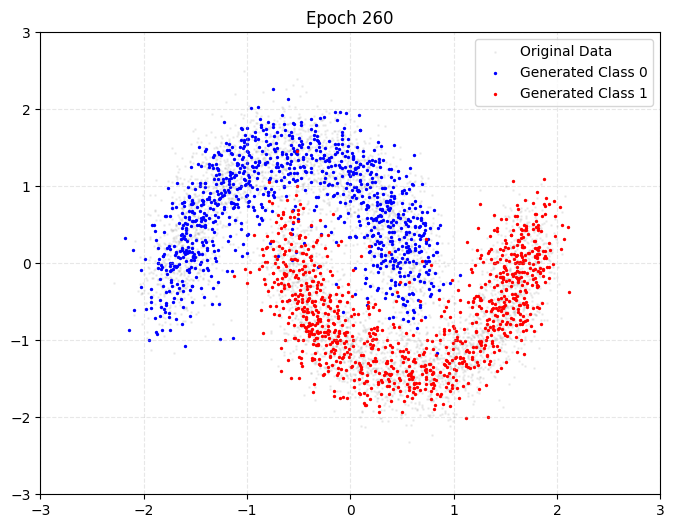

39/39 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.3639
Epoch 261/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3605
Epoch 262/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3658
Epoch 263/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3544
Epoch 264/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3537
Epoch 265/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3636
Epoch 266/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3583
Epoch 267/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3628
Epoch 268/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3581
Epoch 269/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3608
Epoch 270/300
30/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3627
--- Generating points at epoch 270 ---


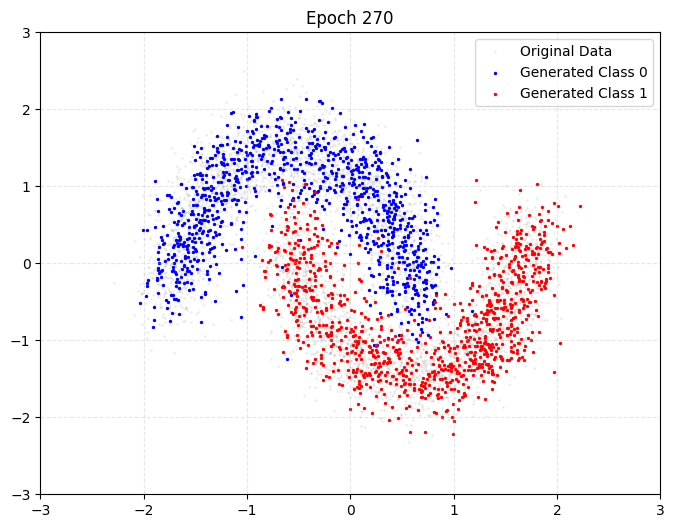

39/39 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - loss: 0.3640
Epoch 271/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.3532
Epoch 272/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 0.3648
Epoch 273/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3568
Epoch 274/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3596
Epoch 275/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3560
Epoch 276/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3555
Epoch 277/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3569
Epoch 278/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3622
Epoch 279/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3705
Epoch 280/300
29/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3614
--- Generating points at epoch 280 ---


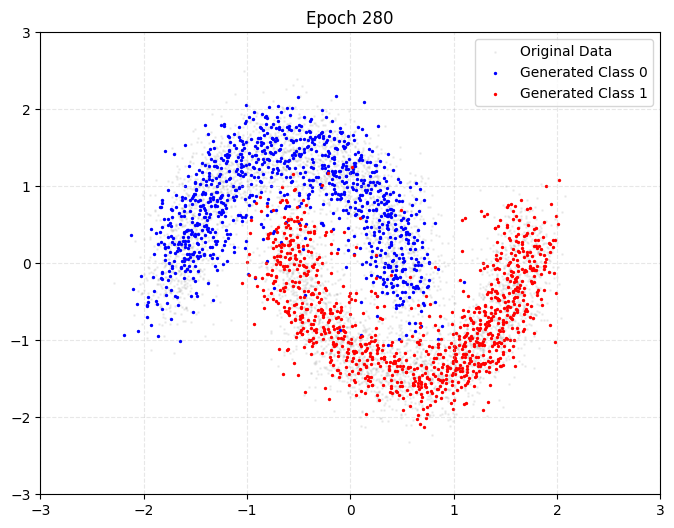

39/39 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - loss: 0.3624
Epoch 281/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3588
Epoch 282/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3592
Epoch 283/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3630
Epoch 284/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3570
Epoch 285/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3518
Epoch 286/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3580
Epoch 287/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3524
Epoch 288/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3592
Epoch 289/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3593
Epoch 290/300
25/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3606
--- Generating points at epoch 290 ---


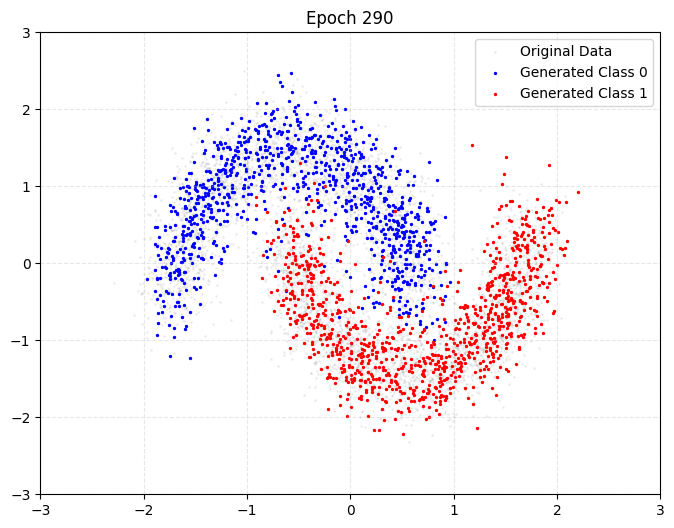

39/39 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - loss: 0.3631
Epoch 291/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3620
Epoch 292/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3595
Epoch 293/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3576
Epoch 294/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3601
Epoch 295/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3525
Epoch 296/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3512
Epoch 297/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3638
Epoch 298/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3600
Epoch 299/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3611
Epoch 300/300
27/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3472
--- Generating points at epoch 300 ---


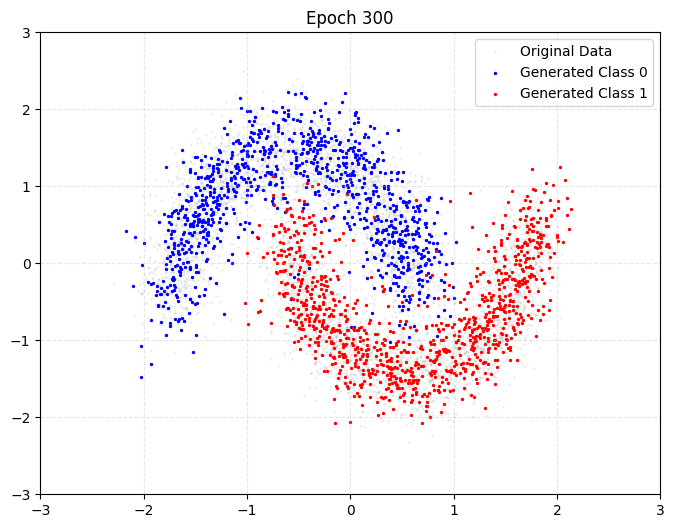

39/39 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - loss: 0.3496


In [ ]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
import numpy as np
import matplotlib.pyplot as plt
from sklearn.datasets import make_moons
from sklearn.preprocessing import StandardScaler

# --- Step 2: Noise Scheduler Functions ---

def get_noise_scheduler_vars(timesteps):
    s = 0.008
    steps = timesteps + 1
    x = tf.linspace(0.0, tf.cast(timesteps, tf.float32), steps)

    pi_f32 = tf.constant(np.pi, dtype=tf.float32)

    alphas_cumprod = tf.cos(((x / tf.cast(timesteps, tf.float32)) + s) / (1 + s) * pi_f32 * 0.5) ** 2
    alphas_cumprod = alphas_cumprod / alphas_cumprod[0]
    alphas_cumprod = alphas_cumprod[1:]

    betas = 1.0 - (alphas_cumprod / tf.concat([tf.constant([1.0], dtype=tf.float32), alphas_cumprod[:-1]], axis=0))
    betas = tf.clip_by_value(betas, 0.0001, 0.02)

    alphas = 1.0 - betas
    alphas_cumprod = tf.math.cumprod(alphas)

    sqrt_alphas_cumprod = tf.sqrt(alphas_cumprod)
    sqrt_one_minus_alphas_cumprod = tf.sqrt(1.0 - alphas_cumprod)

    return betas, alphas, alphas_cumprod, sqrt_alphas_cumprod, sqrt_one_minus_alphas_cumprod


def add_noise_at_timestep(original_points, t, sqrt_alphas_cumprod, sqrt_one_minus_alphas_cumprod):
    t_broadcast = tf.fill(dims=(tf.shape(original_points)[0],), value=t)

    sqrt_alpha_t = tf.gather(sqrt_alphas_cumprod, t_broadcast)
    sqrt_one_minus_alpha_t = tf.gather(sqrt_one_minus_alphas_cumprod, t_broadcast)

    sqrt_alpha_t = tf.reshape(sqrt_alpha_t, [-1, 1])
    sqrt_one_minus_alpha_t = tf.reshape(sqrt_one_minus_alpha_t, [-1, 1])

    noise = tf.random.normal(shape=tf.shape(original_points), dtype=original_points.dtype)

    noisy_points = (
        sqrt_alpha_t * original_points +
        sqrt_one_minus_alpha_t * noise
    )
    return noisy_points

def plot_forward_process(all_points, timesteps_to_plot, sqrt_alphas_cumprod, sqrt_one_minus_alphas_cumprod):
    print("Generating noisy examples for forward process (full dataset)...")

    plt.figure(figsize=(12, 8))

    for i, t in enumerate(timesteps_to_plot):
        noisy_points = add_noise_at_timestep(
            all_points, t,
            sqrt_alphas_cumprod,
            sqrt_one_minus_alphas_cumprod
        )

        ax = plt.subplot(2, 3, i + 1)
        ax.scatter(noisy_points[:, 0], noisy_points[:, 1], s=1, alpha=0.1)
        ax.set_title(f"t = {t}")
        ax.set_xlim(-3, 3)
        ax.set_ylim(-3, 3)
        ax.grid(True, linestyle='--', alpha=0.3)

    plt.suptitle("Forward Noising Process (on the Full Dataset)")
    plt.tight_layout()
    plt.show()

# --- Step 4: Create Training Dataset (MODIFIED) ---

def create_dataset_with_noise(x_train, y_train, batch_size, timesteps, sqrt_alphas_cumprod, sqrt_one_minus_alphas_cumprod):
    dataset = tf.data.Dataset.from_tensor_slices((x_train, y_train))
    dataset = dataset.shuffle(buffer_size=1024).batch(batch_size, drop_remainder=True)

    def add_noise(points, labels):
        batch_size_ = tf.shape(points)[0]

        t = tf.random.uniform(minval=0, maxval=timesteps, shape=(batch_size_,), dtype=tf.int64)
        noise = tf.random.normal(shape=tf.shape(points), dtype=points.dtype)

        sqrt_alpha_t = tf.gather(sqrt_alphas_cumprod, t)
        sqrt_one_minus_alpha_t = tf.gather(sqrt_one_minus_alphas_cumprod, t)

        sqrt_alpha_t = tf.reshape(sqrt_alpha_t, [-1, 1])
        sqrt_one_minus_alpha_t = tf.reshape(sqrt_one_minus_alpha_t, [-1, 1])

        noisy_points = sqrt_alpha_t * points + sqrt_one_minus_alpha_t * noise

        return (noisy_points, t, labels), noise

    dataset = dataset.map(add_noise, num_parallel_calls=tf.data.AUTOTUNE)
    dataset = dataset.prefetch(tf.data.AUTOTUNE)
    return dataset

# --- Step 5: Build the Model (MLP) (MODIFIED) ---

def get_denoising_model(timesteps, num_classes=2):
    point_input = layers.Input(shape=(2,), name="point_input")
    time_input = layers.Input(shape=(), dtype='int64', name="time_input")
    class_input = layers.Input(shape=(), dtype='int64', name="class_input")

    time_emb_dim = 32
    class_emb_dim = 16

    time_emb = layers.Embedding(timesteps, time_emb_dim)(time_input)
    class_emb = layers.Embedding(num_classes, class_emb_dim)(class_input)

    combined_input = layers.Concatenate()([point_input, time_emb, class_emb])

    x = layers.Dense(128, activation='swish')(combined_input)
    x = layers.Dense(128, activation='swish')(x)
    output = layers.Dense(2, activation='linear')(x)

    model = keras.Model([point_input, time_input, class_input], output)
    return model

# --- Step 6: Create Generation Callback (MODIFIED) ---

class PointGeneratorCallback(keras.callbacks.Callback):
    def __init__(self, x_train, num_points, timesteps, betas, alphas, alphas_cumprod, epoch_interval):
        self.x_train = x_train
        self.num_points_per_class = num_points // 2
        self.timesteps = timesteps
        self.betas = betas
        self.alphas = alphas
        self.alphas_cumprod = alphas_cumprod
        self.epoch_interval = epoch_interval
        self.generator_shape = (self.num_points_per_class, 2)

    @tf.function
    def generate_points(self, betas, alphas, alphas_cumprod, class_label):
        points = tf.random.normal(shape=self.generator_shape)

        class_label_batch = tf.fill(dims=(self.num_points_per_class,), value=tf.cast(class_label, tf.int64))

        for t in reversed(range(self.timesteps)):
            t_batch = tf.fill(dims=(self.num_points_per_class,), value=t)

            predicted_noise = self.model([points, t_batch, class_label_batch], training=False)

            alpha_t = tf.gather(alphas, t)
            alpha_cumprod_t = tf.gather(alphas_cumprod, t)
            beta_t = tf.gather(betas, t)

            term1 = 1.0 / tf.sqrt(alpha_t)
            term2 = (1.0 - alpha_t) / tf.sqrt(1.0 - alpha_cumprod_t)
            points = term1 * (points - term2 * predicted_noise)

            if t > 0:
                variance = beta_t
                points = points + tf.sqrt(variance) * tf.random.normal(shape=self.generator_shape)

        return points

    def on_epoch_end(self, epoch, logs=None):
        if (epoch + 1) % self.epoch_interval == 0:
            print(f"\n--- Generating points at epoch {epoch + 1} ---")

            generated_points_0 = self.generate_points(
                self.betas, self.alphas, self.alphas_cumprod, 0
            )
            generated_points_1 = self.generate_points(
                self.betas, self.alphas, self.alphas_cumprod, 1
            )

            plt.figure(figsize=(8, 6))
            plt.scatter(self.x_train[:, 0], self.x_train[:, 1], s=1, c='gray', alpha=0.1, label='Original Data')
            plt.scatter(generated_points_0[:, 0], generated_points_0[:, 1], s=2, c='blue', alpha=1.0, label='Generated Class 0')
            plt.scatter(generated_points_1[:, 0], generated_points_1[:, 1], s=2, c='red', alpha=1.0, label='Generated Class 1')
            plt.title(f"Epoch {epoch + 1}")
            plt.legend()
            plt.xlim(-3, 3)
            plt.ylim(-3, 3)
            plt.grid(True, linestyle='--', alpha=0.3)
            plt.show()

# --- Main Training Block (MODIFIED) ---

TIMESTEPS = 200
N_SAMPLES = 5000
BATCH_SIZE = 128
EPOCHS = 300
EPOCH_INTERVAL = 10
NUM_GEN_POINTS = 2000
LEARNING_RATE = 1e-3
WEIGHT_DECAY = 0.0

print("--- 1. Getting Data ---")
x_train, y_train = get_data(n_samples=N_SAMPLES)
plot_data(x_train, y_train)

print(f"\n--- 2. Getting Noise Schedule (T={TIMESTEPS}) ---")
betas, alphas, alphas_cumprod, sqrt_alphas_cumprod, sqrt_one_minus_alphas_cumprod = get_noise_scheduler_vars(TIMESTEPS)

print("\n--- 3. Plotting Forward Process ---")
timesteps_to_plot = [0, 10, 20, 50, 100, 199]
plot_forward_process(x_train, timesteps_to_plot, sqrt_alphas_cumprod, sqrt_one_minus_alphas_cumprod)

print("\n--- 4. Creating Training Dataset ---")
train_dataset = create_dataset_with_noise(
    x_train,
    y_train,
    BATCH_SIZE,
    TIMESTEPS,
    sqrt_alphas_cumprod,
    sqrt_one_minus_alphas_cumprod
)

print("\n--- 5. Building Model ---")
denoising_model = get_denoising_model(TIMESTEPS, num_classes=2)
denoising_model.summary()


print("\n--- 6. Setting up Training ---")
denoising_model.compile(
    optimizer=keras.optimizers.AdamW(learning_rate=LEARNING_RATE, weight_decay=WEIGHT_DECAY),
    loss=keras.losses.MeanSquaredError()
)

print("\n--- 7. Starting Training ---")
point_gen_callback = PointGeneratorCallback(
    x_train=x_train,
    num_points=NUM_GEN_POINTS,
    timesteps=TIMESTEPS,
    betas=betas,
    alphas=alphas,
    alphas_cumprod=alphas_cumprod,
    epoch_interval=EPOCH_INTERVAL
)

denoising_model.fit(
    train_dataset,
    epochs=EPOCHS,
    callbacks=[point_gen_callback]
)

## Classifier Guidance

--- 1. Getting Data ---
Generating 5000 2D 'intersecting circles' samples...
Plotting data...


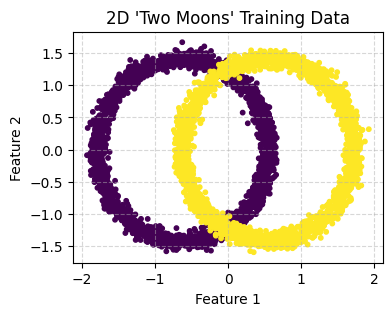


--- 2. Getting Noise Schedule (T=200) ---

--- 3. Plotting Forward Process ---
Generating noisy examples for forward process (full dataset)...


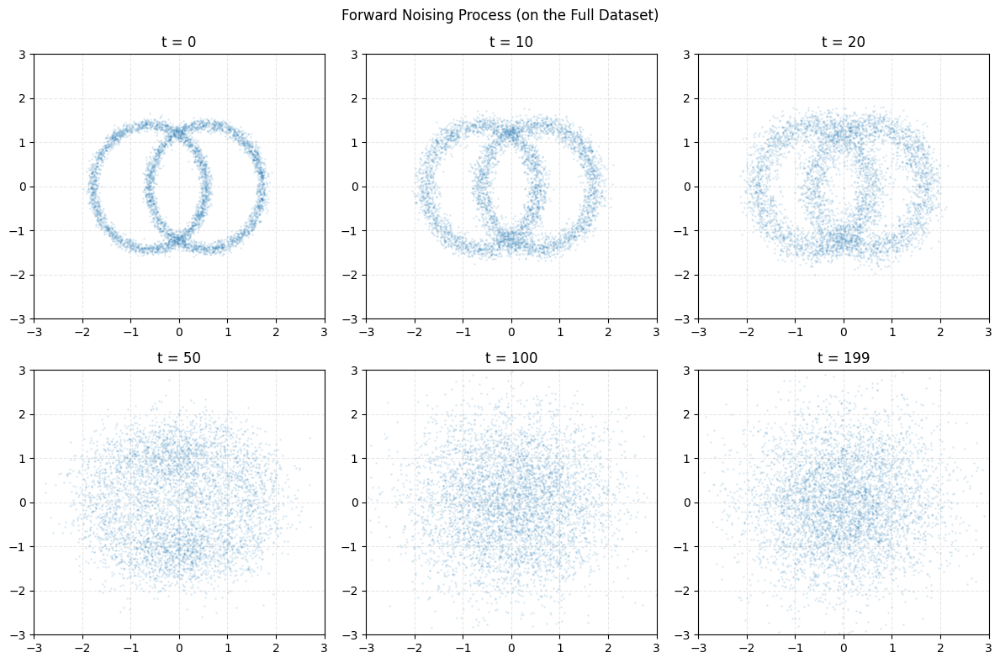


--- 4a. Creating Classifier Dataset ---

--- 4b. Building and Training Noisy Classifier ---


Model: "functional_13"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ time_input          │ (None)            │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ point_input         │ (None, 2)         │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ embedding_18        │ (None, 32)        │      6,400 │ time_input[0][0]  │
│ (Embedding)         │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_13      │ (None, 34)        │          0 │ point_input[0][0… │
│ (Concatenate)       │                   │            │ embedding_18[0][… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_43 (Dense)    │ (None, 128)       │      4,480 │ concatenate_13[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_44 (Dense)    │ (None, 128)       │     16,512 │ dense_43[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_45 (Dense)    │ (None, 2)         │        258 │ dense_44[0][0]    │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 27,650 (108.01 KB)

 Trainable params: 27,650 (108.01 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
39/39 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.6802 - loss: 0.6306
Epoch 2/50
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.6410 - loss: 0.6209
Epoch 3/50
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.6151 - loss: 0.6380
Epoch 4/50
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.6253 - loss: 0.6355
Epoch 5/50
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.6199 - loss: 0.6390
Epoch 6/50
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.6291 - loss: 0.6352
Epoch 7/50
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.6277 - loss: 0.6368
Epoch 8/50
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.6314 - loss: 0.6310
Epoch 9/50
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.6203 - loss: 0.6418
Epoch 10/50
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.6452 - loss: 0.6269
Epoch 11/50
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.6333 - loss: 0.6293
Epoch 12/50
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.6324 - lo

Model: "functional_14"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ time_input          │ (None)            │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ class_input         │ (None)            │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ point_input         │ (None, 2)         │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ embedding_19        │ (None, 32)        │      6,400 │ time_input[0][0]  │
│ (Embedding)         │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ embedding_20        │ (None, 16)        │         32 │ class_input[0][0] │
│ (Embedding)         │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_14      │ (None, 50)        │          0 │ point_input[0][0… │
│ (Concatenate)       │                   │            │ embedding_19[0][… │
│                     │                   │            │ embedding_20[0][… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_46 (Dense)    │ (None, 128)       │      6,528 │ concatenate_14[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_47 (Dense)    │ (None, 128)       │     16,512 │ dense_46[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_48 (Dense)    │ (None, 2)         │        258 │ dense_47[0][0]    │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 29,730 (116.13 KB)

 Trainable params: 29,730 (116.13 KB)

 Non-trainable params: 0 (0.00 B)


--- 7. Setting up Denoising Training ---

--- 8. Starting Denoising Training (with Guidance Callback) ---
Epoch 1/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 0.7780
Epoch 2/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.5602
Epoch 3/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.5470
Epoch 4/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.5499
Epoch 5/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.5440
Epoch 6/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.5431
Epoch 7/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.5236
Epoch 8/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.5239
Epoch 9/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.5006
Epoch 10/300
38/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4816
--- Generating points at epoch 10 (Guidance Scale: 5.0) ---


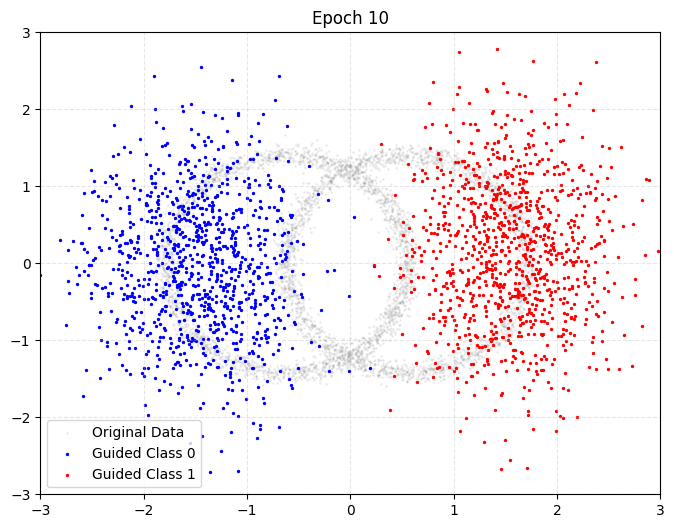

39/39 ━━━━━━━━━━━━━━━━━━━━ 103s 3s/step - loss: 0.4819
Epoch 11/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4769
Epoch 12/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4716
Epoch 13/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4672
Epoch 14/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.4609
Epoch 15/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.4685
Epoch 16/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.4675
Epoch 17/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4667
Epoch 18/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4681
Epoch 19/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.4700
Epoch 20/300
30/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4680
--- Generating points at epoch 20 (Guidance Scale: 5.0) ---


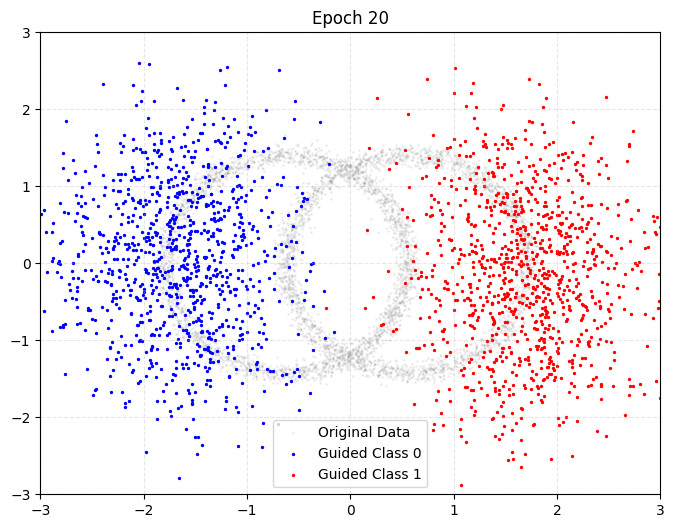

39/39 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.4705
Epoch 21/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4712
Epoch 22/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4664
Epoch 23/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4724
Epoch 24/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4616
Epoch 25/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4651
Epoch 26/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4680
Epoch 27/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4645
Epoch 28/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4606
Epoch 29/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4701
Epoch 30/300
20/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4570 
--- Generating points at epoch 30 (Guidance Scale: 5.0) ---


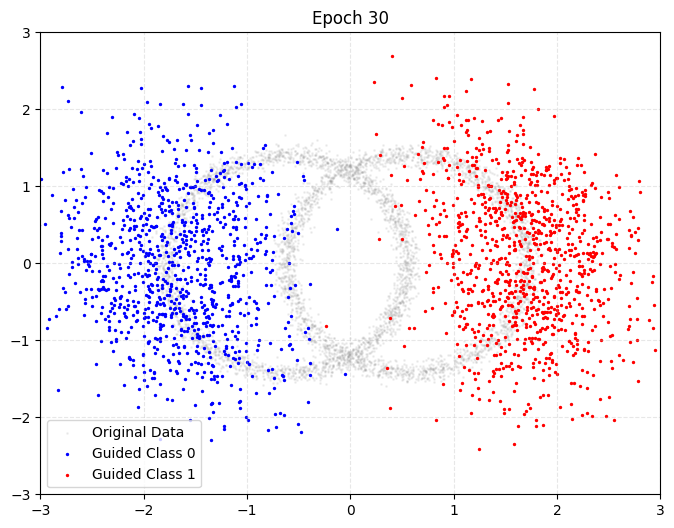

39/39 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.4638
Epoch 31/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4694
Epoch 32/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4642
Epoch 33/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4498
Epoch 34/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4703
Epoch 35/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4710
Epoch 36/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4636
Epoch 37/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4525
Epoch 38/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4650
Epoch 39/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4539
Epoch 40/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4597
--- Generating points at epoch 40 (Guidance Scale: 5.0) ---


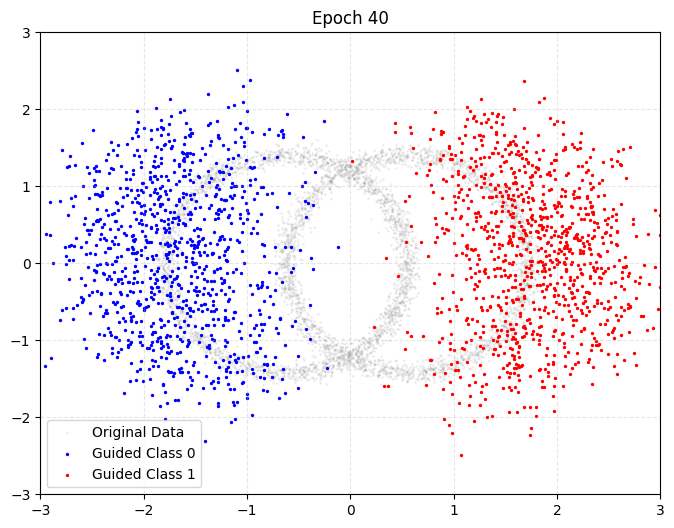

39/39 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - loss: 0.4599
Epoch 41/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4619
Epoch 42/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4599
Epoch 43/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4563
Epoch 44/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4455
Epoch 45/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4570
Epoch 46/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4481
Epoch 47/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4586
Epoch 48/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4442
Epoch 49/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4383
Epoch 50/300
37/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4438
--- Generating points at epoch 50 (Guidance Scale: 5.0) ---


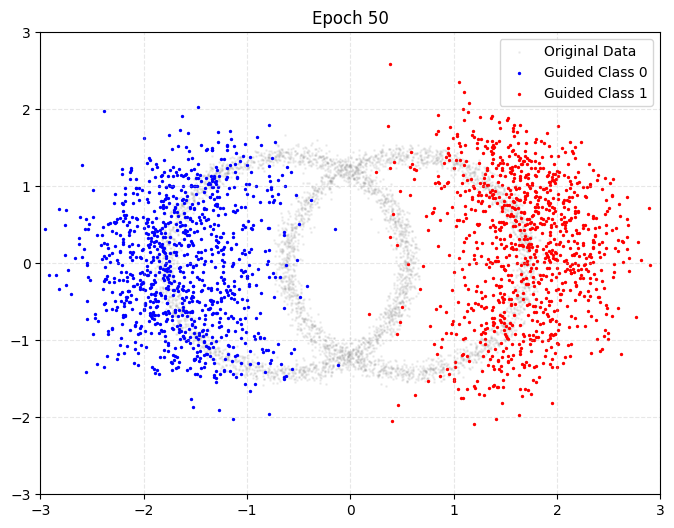

39/39 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - loss: 0.4445
Epoch 51/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4539
Epoch 52/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4538
Epoch 53/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4578
Epoch 54/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4514
Epoch 55/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4442
Epoch 56/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4554
Epoch 57/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4406
Epoch 58/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4382
Epoch 59/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4462
Epoch 60/300
33/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4491
--- Generating points at epoch 60 (Guidance Scale: 5.0) ---


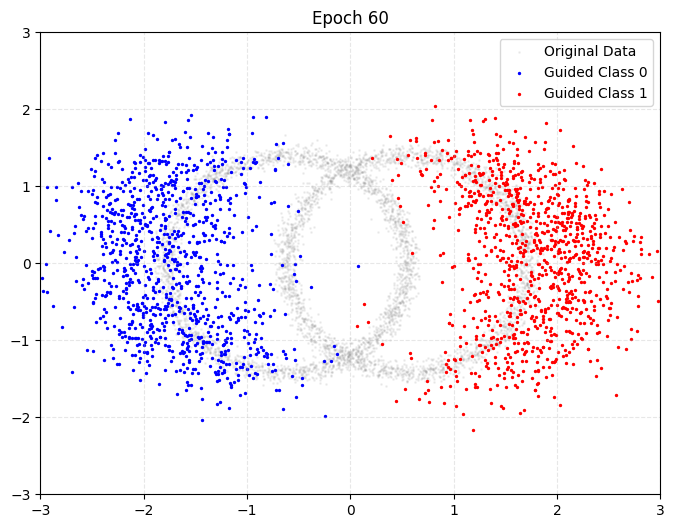

39/39 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - loss: 0.4501
Epoch 61/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.4431
Epoch 62/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4472
Epoch 63/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4348
Epoch 64/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4426
Epoch 65/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.4413
Epoch 66/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.4387
Epoch 67/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4422
Epoch 68/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4301
Epoch 69/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.4441
Epoch 70/300
37/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4245
--- Generating points at epoch 70 (Guidance Scale: 5.0) ---


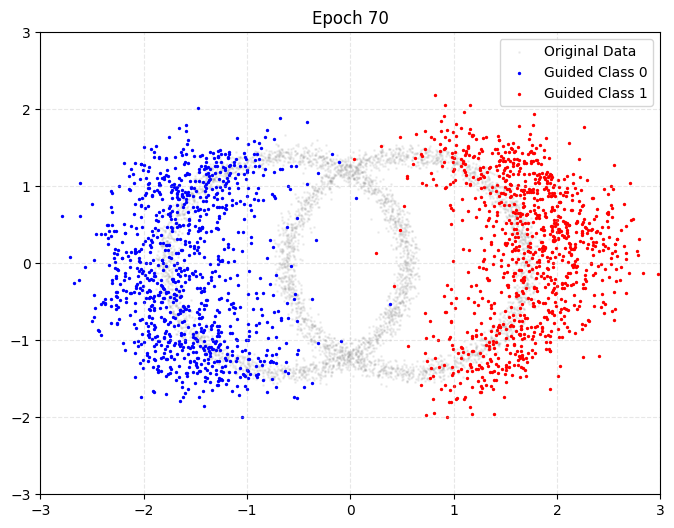

39/39 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.4254
Epoch 71/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4401
Epoch 72/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4342
Epoch 73/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4321
Epoch 74/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4344
Epoch 75/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4244
Epoch 76/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4315
Epoch 77/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4207
Epoch 78/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4258
Epoch 79/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4314
Epoch 80/300
32/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4199
--- Generating points at epoch 80 (Guidance Scale: 5.0) ---


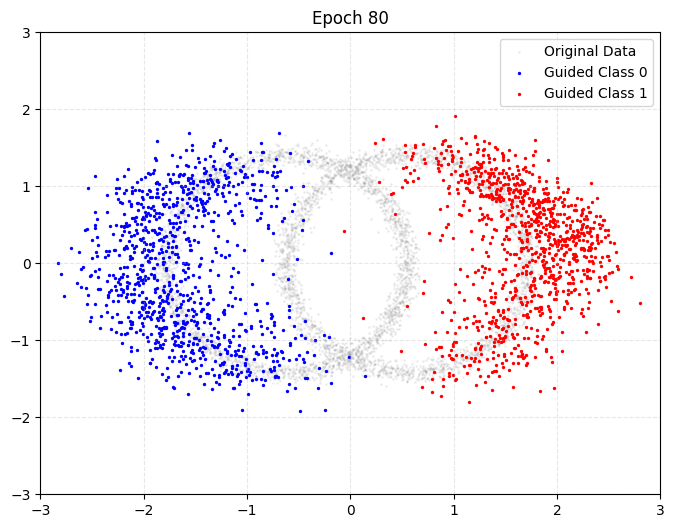

39/39 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - loss: 0.4217
Epoch 81/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4234
Epoch 82/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4279
Epoch 83/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4225
Epoch 84/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4144
Epoch 85/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4287
Epoch 86/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3963
Epoch 87/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4174
Epoch 88/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4015
Epoch 89/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4099
Epoch 90/300
31/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4008
--- Generating points at epoch 90 (Guidance Scale: 5.0) ---


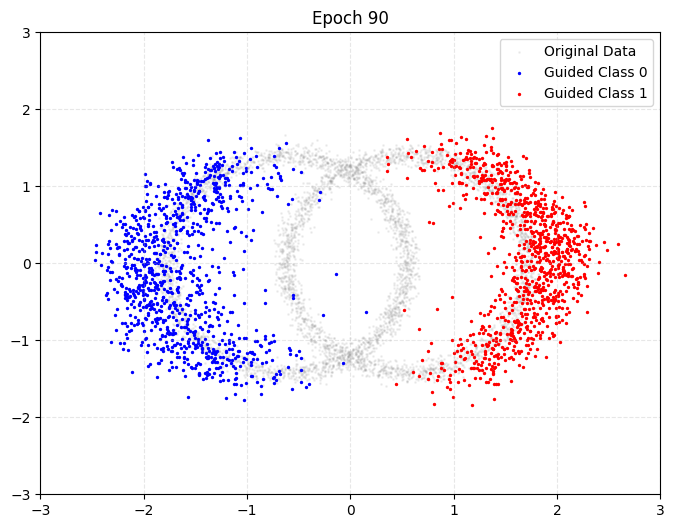

39/39 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - loss: 0.4027
Epoch 91/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3920
Epoch 92/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4045
Epoch 93/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4096
Epoch 94/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4017
Epoch 95/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4035
Epoch 96/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4016
Epoch 97/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3969
Epoch 98/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3920
Epoch 99/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3950
Epoch 100/300
36/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3998
--- Generating points at epoch 100 (Guidance Scale: 5.0) ---


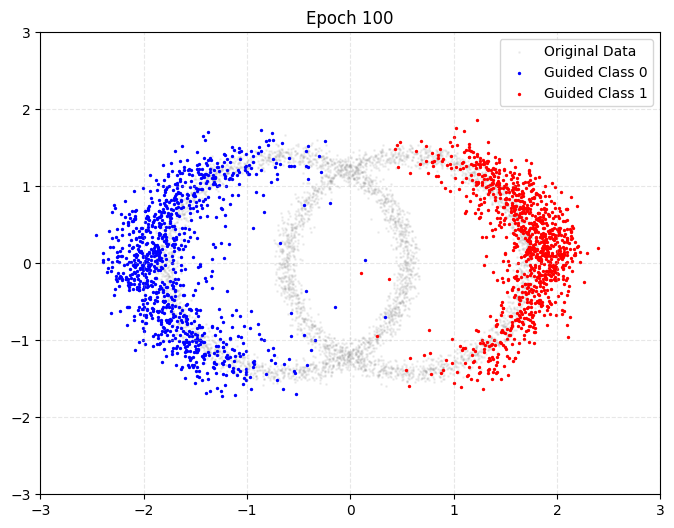

39/39 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - loss: 0.4003
Epoch 101/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3872
Epoch 102/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3863
Epoch 103/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3780
Epoch 104/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3821
Epoch 105/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3833
Epoch 106/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3936
Epoch 107/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3875
Epoch 108/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3945
Epoch 109/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3829
Epoch 110/300
32/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3839
--- Generating points at epoch 110 (Guidance Scale: 5.0) ---


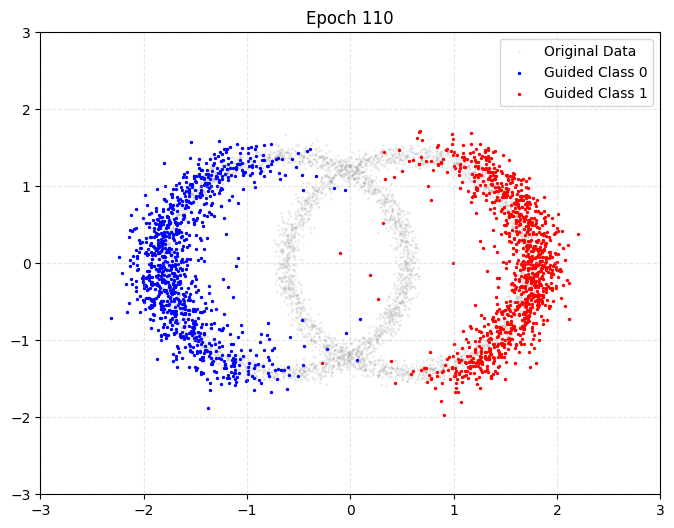

39/39 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - loss: 0.3846
Epoch 111/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3765
Epoch 112/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3880
Epoch 113/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3774
Epoch 114/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3793
Epoch 115/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.3772
Epoch 116/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 0.3836
Epoch 117/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3793
Epoch 118/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3789
Epoch 119/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3778
Epoch 120/300
33/39 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3826
--- Generating points at epoch 120 (Guidance Scale: 5.0) ---


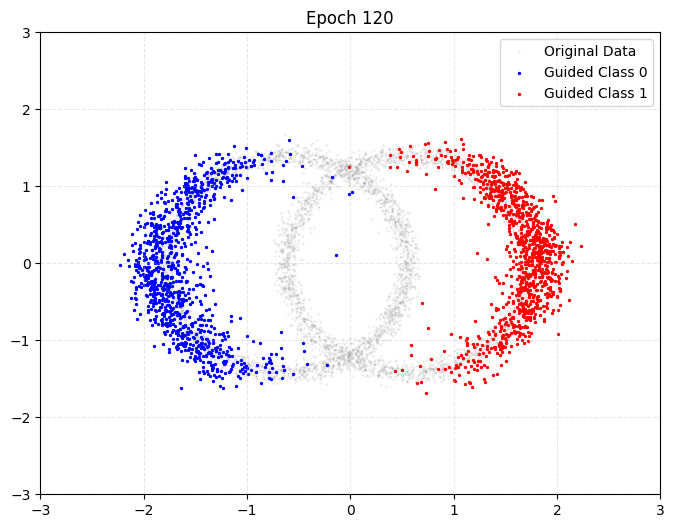

39/39 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.3848
Epoch 121/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3801
Epoch 122/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3869
Epoch 123/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3670
Epoch 124/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3744
Epoch 125/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3842
Epoch 126/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3681
Epoch 127/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3762
Epoch 128/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3847
Epoch 129/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3764
Epoch 130/300
28/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3704
--- Generating points at epoch 130 (Guidance Scale: 5.0) ---


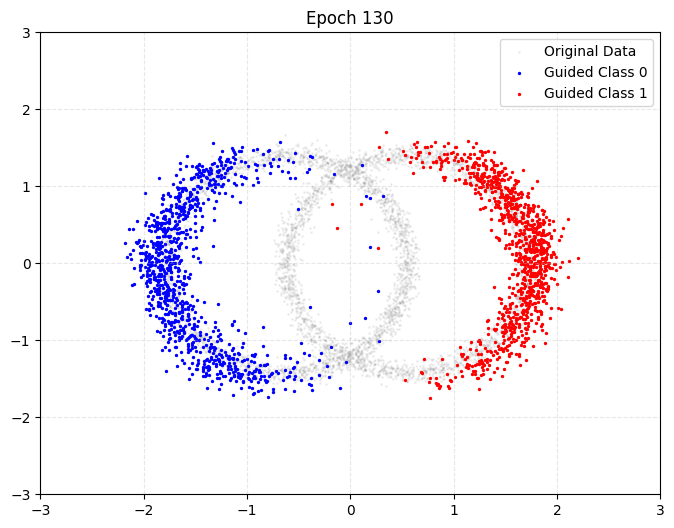

39/39 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - loss: 0.3749
Epoch 131/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3776
Epoch 132/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3726
Epoch 133/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3699
Epoch 134/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3773
Epoch 135/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3693
Epoch 136/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3749
Epoch 137/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3732
Epoch 138/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3769
Epoch 139/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3710
Epoch 140/300
28/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3759
--- Generating points at epoch 140 (Guidance Scale: 5.0) ---


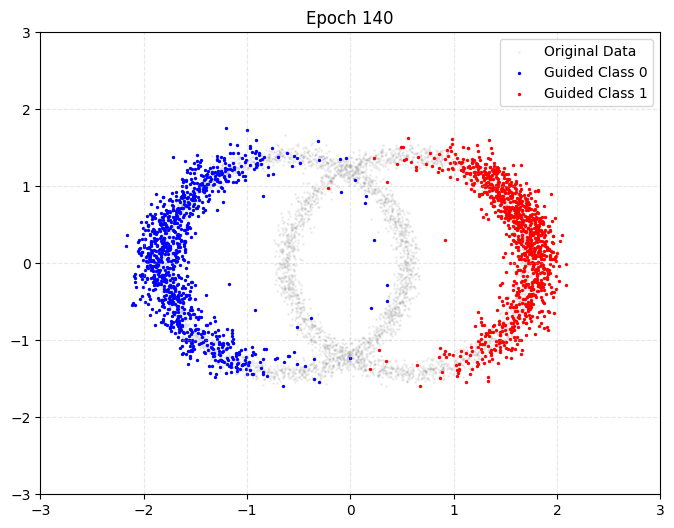

39/39 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.3774
Epoch 141/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3689
Epoch 142/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3745
Epoch 143/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3642
Epoch 144/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3761
Epoch 145/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3578
Epoch 146/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3573
Epoch 147/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3614
Epoch 148/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3622
Epoch 149/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3756
Epoch 150/300
29/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3550
--- Generating points at epoch 150 (Guidance Scale: 5.0) ---


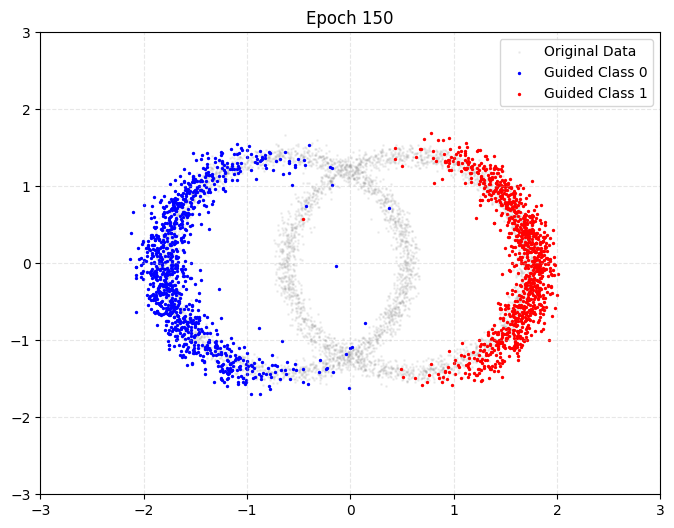

39/39 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - loss: 0.3606
Epoch 151/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3710
Epoch 152/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3712
Epoch 153/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3511
Epoch 154/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3593
Epoch 155/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3698
Epoch 156/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3681
Epoch 157/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3726
Epoch 158/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3641
Epoch 159/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3697
Epoch 160/300
30/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3564
--- Generating points at epoch 160 (Guidance Scale: 5.0) ---


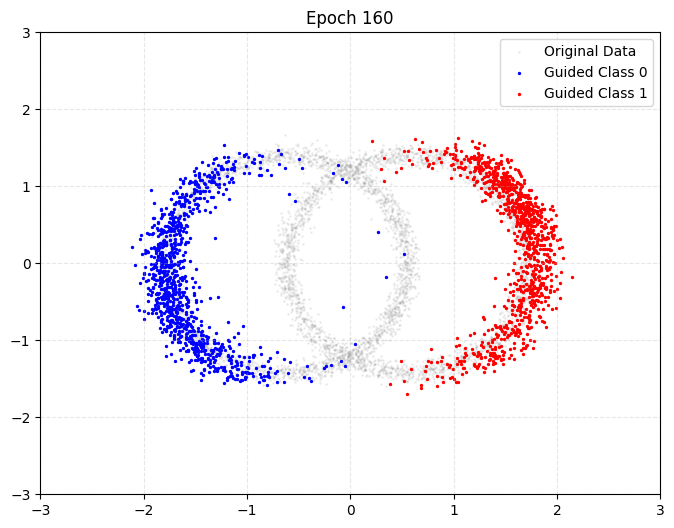

39/39 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.3598
Epoch 161/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 0.3699
Epoch 162/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3527
Epoch 163/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3656
Epoch 164/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3745
Epoch 165/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3764
Epoch 166/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3609
Epoch 167/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3562
Epoch 168/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3617
Epoch 169/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3693
Epoch 170/300
31/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3625
--- Generating points at epoch 170 (Guidance Scale: 5.0) ---


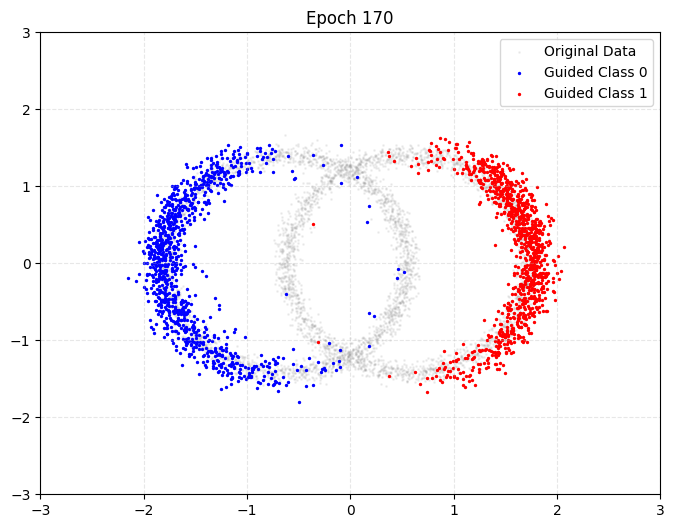

39/39 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - loss: 0.3657
Epoch 171/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3635
Epoch 172/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3522
Epoch 173/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3561
Epoch 174/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3681
Epoch 175/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3598
Epoch 176/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3657
Epoch 177/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3626
Epoch 178/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3767
Epoch 179/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3557
Epoch 180/300
28/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3654
--- Generating points at epoch 180 (Guidance Scale: 5.0) ---


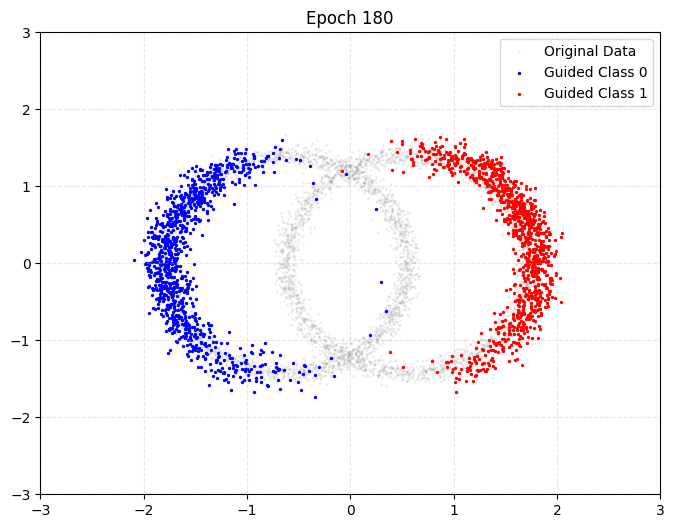

39/39 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - loss: 0.3676
Epoch 181/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3546
Epoch 182/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3554
Epoch 183/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3732
Epoch 184/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3634
Epoch 185/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3674
Epoch 186/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3587
Epoch 187/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3605
Epoch 188/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3754
Epoch 189/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3504
Epoch 190/300
29/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3519
--- Generating points at epoch 190 (Guidance Scale: 5.0) ---


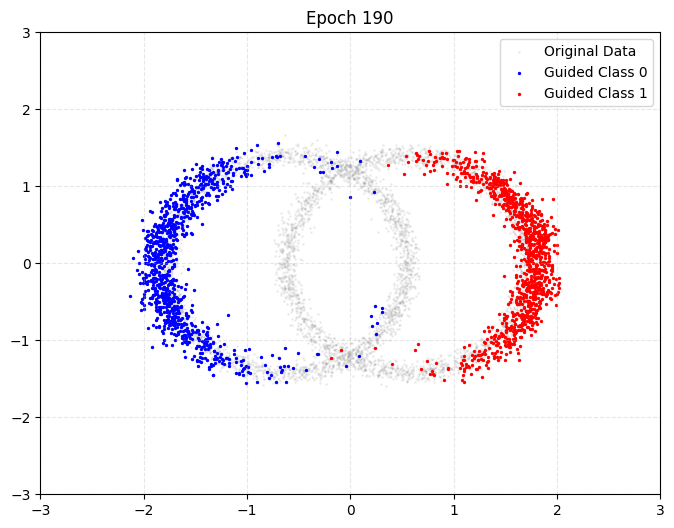

39/39 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - loss: 0.3547
Epoch 191/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3576
Epoch 192/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3587
Epoch 193/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3593
Epoch 194/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3591
Epoch 195/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3599
Epoch 196/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3621
Epoch 197/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3587
Epoch 198/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3527
Epoch 199/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3511
Epoch 200/300
28/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3630
--- Generating points at epoch 200 (Guidance Scale: 5.0) ---


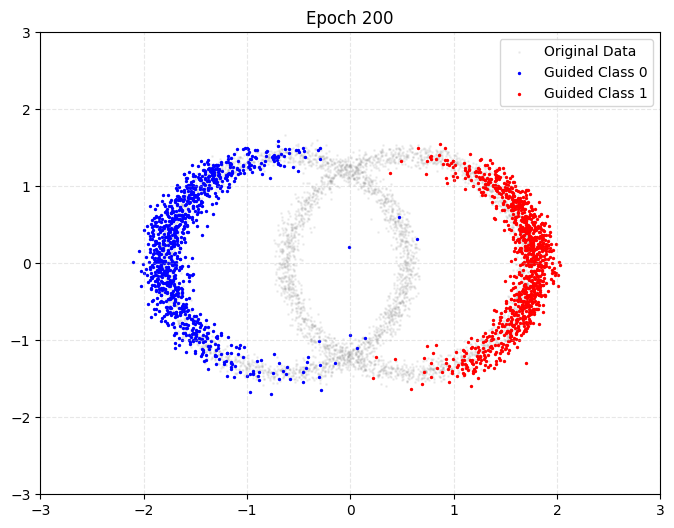

39/39 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.3653
Epoch 201/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3683
Epoch 202/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3567
Epoch 203/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3680
Epoch 204/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3586
Epoch 205/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3686
Epoch 206/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3487
Epoch 207/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.3617
Epoch 208/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3546
Epoch 209/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.3604
Epoch 210/300
29/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3593
--- Generating points at epoch 210 (Guidance Scale: 5.0) ---


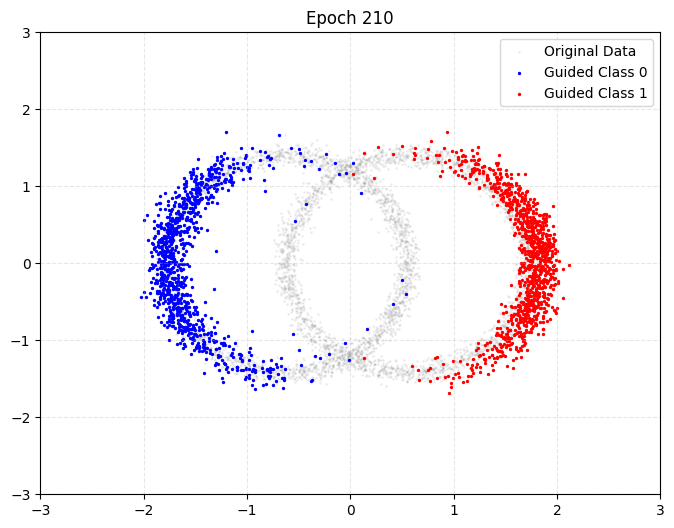

39/39 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.3650
Epoch 211/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 0.3729
Epoch 212/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3605
Epoch 213/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3692
Epoch 214/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3553
Epoch 215/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3647
Epoch 216/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3619
Epoch 217/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3621
Epoch 218/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3653
Epoch 219/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3700
Epoch 220/300
28/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3559
--- Generating points at epoch 220 (Guidance Scale: 5.0) ---


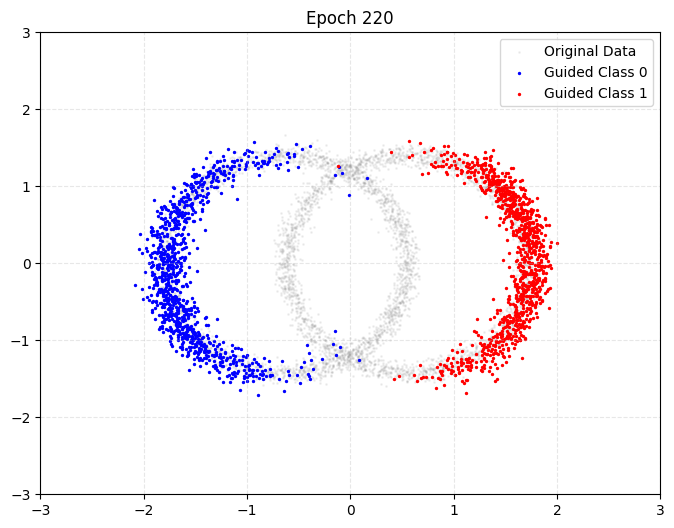

39/39 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.3588
Epoch 221/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3609
Epoch 222/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3412
Epoch 223/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3508
Epoch 224/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3566
Epoch 225/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3632
Epoch 226/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3602
Epoch 227/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3556
Epoch 228/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3547
Epoch 229/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3591
Epoch 230/300
29/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3640
--- Generating points at epoch 230 (Guidance Scale: 5.0) ---


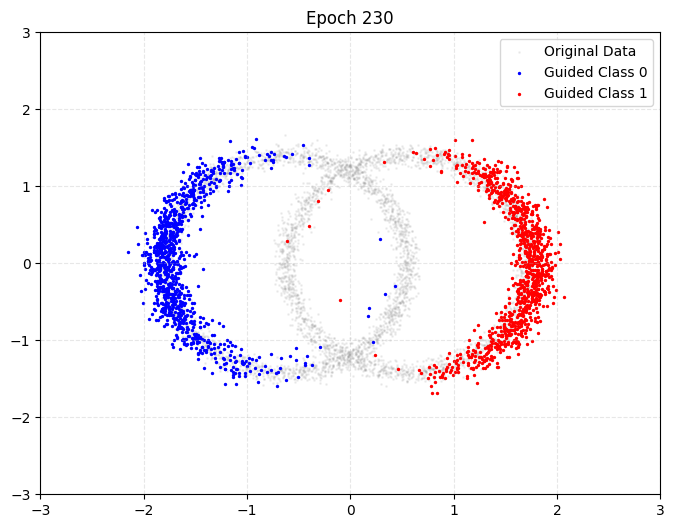

39/39 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - loss: 0.3657
Epoch 231/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3578
Epoch 232/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3663
Epoch 233/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3580
Epoch 234/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3576
Epoch 235/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3567
Epoch 236/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3592
Epoch 237/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3464
Epoch 238/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3593
Epoch 239/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3605
Epoch 240/300
30/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3516
--- Generating points at epoch 240 (Guidance Scale: 5.0) ---


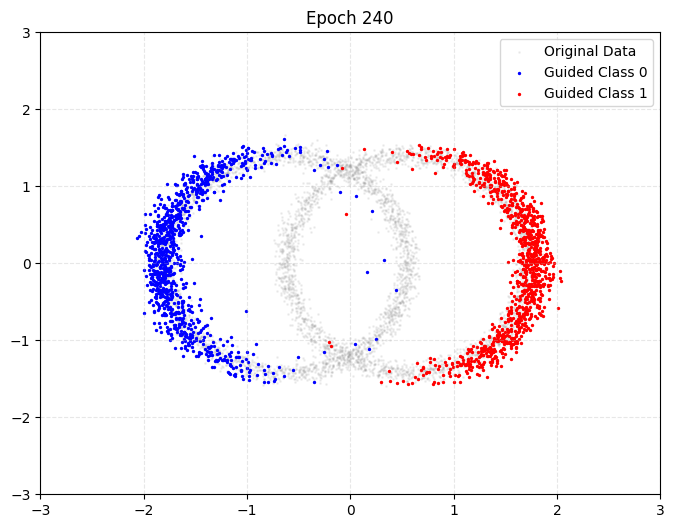

39/39 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.3552
Epoch 241/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3512
Epoch 242/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3673
Epoch 243/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3547
Epoch 244/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3520
Epoch 245/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3485
Epoch 246/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3597
Epoch 247/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3515
Epoch 248/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3540
Epoch 249/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3595
Epoch 250/300
36/39 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3539
--- Generating points at epoch 250 (Guidance Scale: 5.0) ---


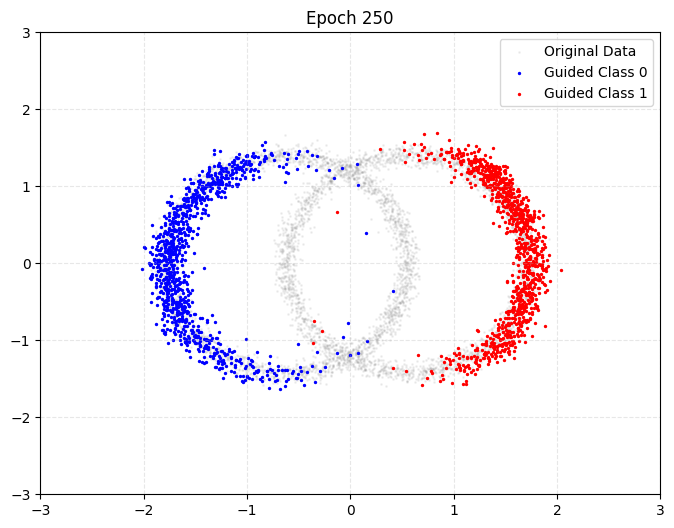

39/39 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.3545
Epoch 251/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.3565
Epoch 252/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3470
Epoch 253/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3551
Epoch 254/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3639
Epoch 255/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3708
Epoch 256/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.3516
Epoch 257/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3483
Epoch 258/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3525
Epoch 259/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3507
Epoch 260/300
33/39 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3540
--- Generating points at epoch 260 (Guidance Scale: 5.0) ---


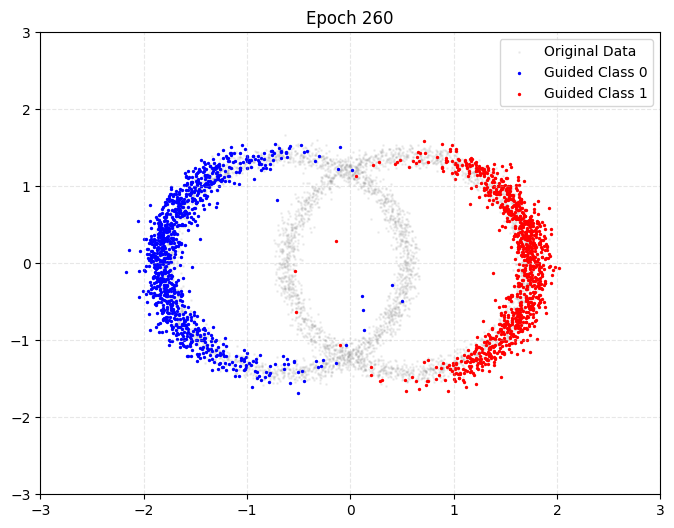

39/39 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.3552
Epoch 261/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 0.3459
Epoch 262/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3533
Epoch 263/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3575
Epoch 264/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3533
Epoch 265/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3541
Epoch 266/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3643
Epoch 267/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3572
Epoch 268/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3589
Epoch 269/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3589
Epoch 270/300
30/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3519
--- Generating points at epoch 270 (Guidance Scale: 5.0) ---


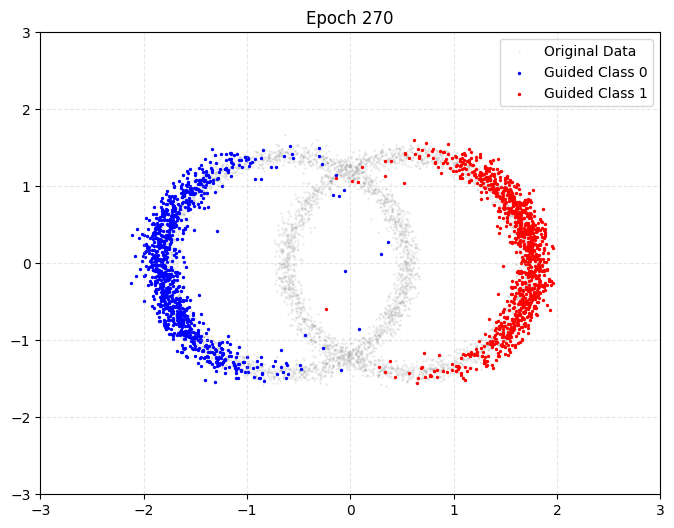

39/39 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.3543
Epoch 271/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3679
Epoch 272/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3538
Epoch 273/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3539
Epoch 274/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3545
Epoch 275/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3582
Epoch 276/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3521
Epoch 277/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3565
Epoch 278/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3519
Epoch 279/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3501
Epoch 280/300
29/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3546
--- Generating points at epoch 280 (Guidance Scale: 5.0) ---


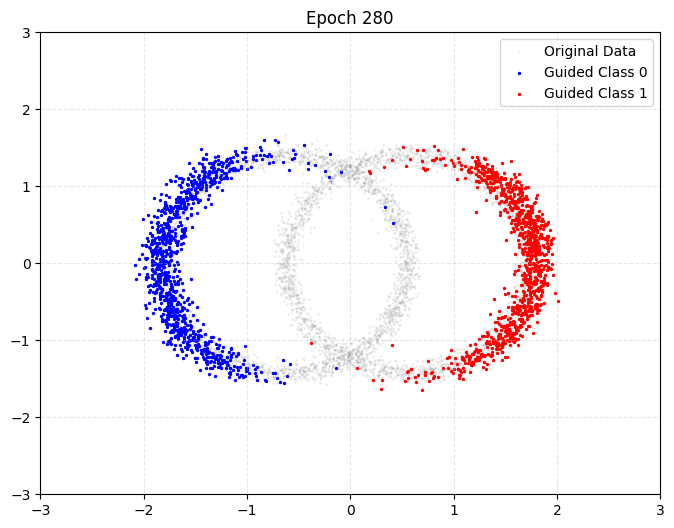

39/39 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.3560
Epoch 281/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3477
Epoch 282/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3524
Epoch 283/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3692
Epoch 284/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3543
Epoch 285/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3486
Epoch 286/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3587
Epoch 287/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3561
Epoch 288/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3542
Epoch 289/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3565
Epoch 290/300
28/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3581
--- Generating points at epoch 290 (Guidance Scale: 5.0) ---


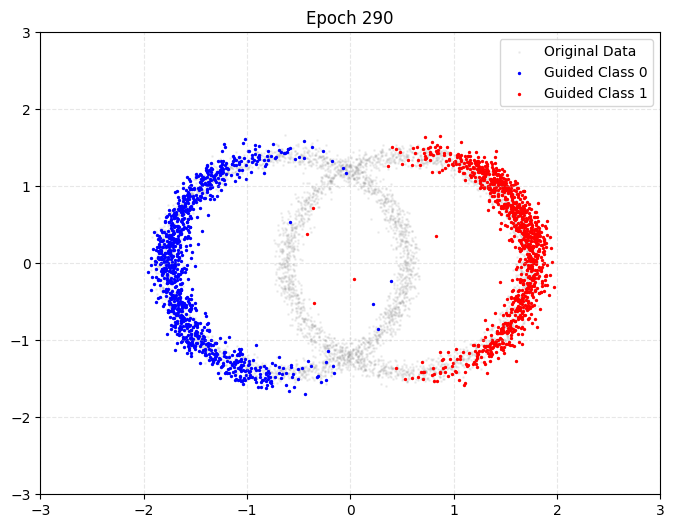

39/39 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.3608
Epoch 291/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3589
Epoch 292/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3451
Epoch 293/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3538
Epoch 294/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3605
Epoch 295/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3416
Epoch 296/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.3534
Epoch 297/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3570
Epoch 298/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3496
Epoch 299/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.3430
Epoch 300/300
35/39 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3520
--- Generating points at epoch 300 (Guidance Scale: 5.0) ---


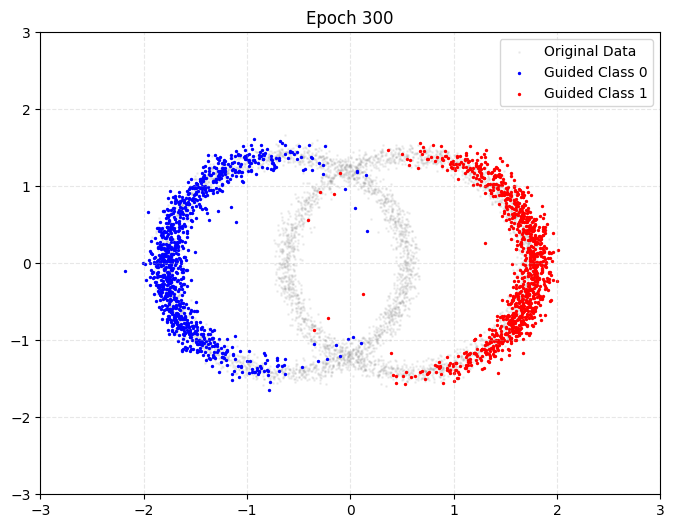

39/39 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.3525


In [ ]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
import numpy as np
import matplotlib.pyplot as plt
from sklearn.datasets import make_moons
from sklearn.preprocessing import StandardScaler


# --- Step 2: Noise Scheduler Functions (Unchanged) ---

def get_noise_scheduler_vars(timesteps):
    s = 0.008
    steps = timesteps + 1
    x = tf.linspace(0.0, tf.cast(timesteps, tf.float32), steps)

    pi_f32 = tf.constant(np.pi, dtype=tf.float32)

    alphas_cumprod = tf.cos(((x / tf.cast(timesteps, tf.float32)) + s) / (1 + s) * pi_f32 * 0.5) ** 2
    alphas_cumprod = alphas_cumprod / alphas_cumprod[0]
    alphas_cumprod = alphas_cumprod[1:]

    betas = 1.0 - (alphas_cumprod / tf.concat([tf.constant([1.0], dtype=tf.float32), alphas_cumprod[:-1]], axis=0))
    betas = tf.clip_by_value(betas, 0.0001, 0.02)

    alphas = 1.0 - betas
    alphas_cumprod = tf.math.cumprod(alphas)

    sqrt_alphas_cumprod = tf.sqrt(alphas_cumprod)
    sqrt_one_minus_alphas_cumprod = tf.sqrt(1.0 - alphas_cumprod)

    return betas, alphas, alphas_cumprod, sqrt_alphas_cumprod, sqrt_one_minus_alphas_cumprod


def add_noise_at_timestep(original_points, t, sqrt_alphas_cumprod, sqrt_one_minus_alphas_cumprod):
    t_broadcast = tf.fill(dims=(tf.shape(original_points)[0],), value=t)

    sqrt_alpha_t = tf.gather(sqrt_alphas_cumprod, t_broadcast)
    sqrt_one_minus_alpha_t = tf.gather(sqrt_one_minus_alphas_cumprod, t_broadcast)

    sqrt_alpha_t = tf.reshape(sqrt_alpha_t, [-1, 1])
    sqrt_one_minus_alpha_t = tf.reshape(sqrt_one_minus_alpha_t, [-1, 1])

    noise = tf.random.normal(shape=tf.shape(original_points), dtype=original_points.dtype)

    noisy_points = (
        sqrt_alpha_t * original_points +
        sqrt_one_minus_alpha_t * noise
    )
    return noisy_points

def plot_forward_process(all_points, timesteps_to_plot, sqrt_alphas_cumprod, sqrt_one_minus_alphas_cumprod):
    print("Generating noisy examples for forward process (full dataset)...")

    plt.figure(figsize=(12, 8))

    for i, t in enumerate(timesteps_to_plot):
        noisy_points = add_noise_at_timestep(
            all_points, t,
            sqrt_alphas_cumprod,
            sqrt_one_minus_alphas_cumprod
        )

        ax = plt.subplot(2, 3, i + 1)
        ax.scatter(noisy_points[:, 0], noisy_points[:, 1], s=1, alpha=0.1)
        ax.set_title(f"t = {t}")
        ax.set_xlim(-3, 3)
        ax.set_ylim(-3, 3)
        ax.grid(True, linestyle='--', alpha=0.3)

    plt.suptitle("Forward Noising Process (on the Full Dataset)")
    plt.tight_layout()
    plt.show()

# --- Step 4: Create Training Datasets (MODIFIED) ---

def create_diffusion_dataset(x_train, y_train, batch_size, timesteps, sqrt_alphas_cumprod, sqrt_one_minus_alphas_cumprod):
    dataset = tf.data.Dataset.from_tensor_slices((x_train, y_train))
    dataset = dataset.shuffle(buffer_size=1024).batch(batch_size, drop_remainder=True)

    def add_noise(points, labels):
        batch_size_ = tf.shape(points)[0]

        t = tf.random.uniform(minval=0, maxval=timesteps, shape=(batch_size_,), dtype=tf.int64)
        noise = tf.random.normal(shape=tf.shape(points), dtype=points.dtype)

        sqrt_alpha_t = tf.gather(sqrt_alphas_cumprod, t)
        sqrt_one_minus_alpha_t = tf.gather(sqrt_one_minus_alphas_cumprod, t)

        sqrt_alpha_t = tf.reshape(sqrt_alpha_t, [-1, 1])
        sqrt_one_minus_alpha_t = tf.reshape(sqrt_one_minus_alpha_t, [-1, 1])

        noisy_points = sqrt_alpha_t * points + sqrt_one_minus_alpha_t * noise

        return (noisy_points, t, labels), noise

    dataset = dataset.map(add_noise, num_parallel_calls=tf.data.AUTOTUNE)
    dataset = dataset.prefetch(tf.data.AUTOTUNE)
    return dataset

def create_classifier_dataset(x_train, y_train, batch_size, timesteps, sqrt_alphas_cumprod, sqrt_one_minus_alphas_cumprod):
    dataset = tf.data.Dataset.from_tensor_slices((x_train, y_train))
    dataset = dataset.shuffle(buffer_size=1024).batch(batch_size, drop_remainder=True)

    def add_noise_and_format(points, labels):
        batch_size_ = tf.shape(points)[0]

        t = tf.random.uniform(minval=0, maxval=timesteps, shape=(batch_size_,), dtype=tf.int64)
        noise = tf.random.normal(shape=tf.shape(points), dtype=points.dtype)

        sqrt_alpha_t = tf.gather(sqrt_alphas_cumprod, t)
        sqrt_one_minus_alpha_t = tf.gather(sqrt_one_minus_alphas_cumprod, t)

        sqrt_alpha_t = tf.reshape(sqrt_alpha_t, [-1, 1])
        sqrt_one_minus_alpha_t = tf.reshape(sqrt_one_minus_alpha_t, [-1, 1])

        noisy_points = sqrt_alpha_t * points + sqrt_one_minus_alpha_t * noise

        return (noisy_points, t), labels

    dataset = dataset.map(add_noise_and_format, num_parallel_calls=tf.data.AUTOTUNE)
    dataset = dataset.prefetch(tf.data.AUTOTUNE)
    return dataset

# --- Step 5: Build the Models (MODIFIED) ---

def get_denoising_model(timesteps, num_classes=2):
    point_input = layers.Input(shape=(2,), name="point_input")
    time_input = layers.Input(shape=(), dtype='int64', name="time_input")
    class_input = layers.Input(shape=(), dtype='int64', name="class_input")

    time_emb_dim = 32
    class_emb_dim = 16

    time_emb = layers.Embedding(timesteps, time_emb_dim)(time_input)
    class_emb = layers.Embedding(num_classes, class_emb_dim)(class_input)

    combined_input = layers.Concatenate()([point_input, time_emb, class_emb])

    x = layers.Dense(128, activation='swish')(combined_input)
    x = layers.Dense(128, activation='swish')(x)
    output = layers.Dense(2, activation='linear')(x)

    model = keras.Model([point_input, time_input, class_input], output)
    return model

def get_noisy_classifier(timesteps, num_classes=2):
    point_input = layers.Input(shape=(2,), name="point_input")
    time_input = layers.Input(shape=(), dtype='int64', name="time_input")

    time_emb_dim = 32

    time_emb = layers.Embedding(timesteps, time_emb_dim)(time_input)

    combined_input = layers.Concatenate()([point_input, time_emb])

    x = layers.Dense(128, activation='swish')(combined_input)
    x = layers.Dense(128, activation='swish')(x)
    output = layers.Dense(num_classes, activation='linear')(x)

    model = keras.Model([point_input, time_input], output)
    return model


# --- Step 6: Create Generation Callback (MODIFIED) ---

class PointGeneratorCallback(keras.callbacks.Callback):
    def __init__(self, x_train, num_points, timesteps, betas, alphas, alphas_cumprod,
                 classifier_model, guidance_scale, epoch_interval):
        self.x_train = x_train
        self.num_points_per_class = num_points // 2
        self.timesteps = timesteps
        self.betas = betas
        self.alphas = alphas
        self.alphas_cumprod = alphas_cumprod
        self.classifier_model = classifier_model
        self.guidance_scale = guidance_scale
        self.epoch_interval = epoch_interval
        self.generator_shape = (self.num_points_per_class, 2)

    @tf.function
    def generate_points(self, betas, alphas, alphas_cumprod, class_label):
        points = tf.random.normal(shape=self.generator_shape)

        class_label_batch = tf.fill(dims=(self.num_points_per_class,), value=tf.cast(class_label, tf.int64))

        for t in reversed(range(self.timesteps)):
            t_batch = tf.fill(dims=(self.num_points_per_class,), value=t)

            with tf.GradientTape() as tape:
                tape.watch(points)

                classifier_logits = self.classifier_model([points, t_batch], training=False)
                log_probs = tf.nn.log_softmax(classifier_logits, axis=-1)

                log_prob_y = tf.gather(log_probs, class_label_batch, batch_dims=1, axis=1)

            classifier_gradient = tape.gradient(log_prob_y, points)

            predicted_noise = self.model([points, t_batch, class_label_batch], training=False)

            alpha_t = tf.gather(alphas, t)
            alpha_cumprod_t = tf.gather(alphas_cumprod, t)
            beta_t = tf.gather(betas, t)

            term1 = 1.0 / tf.sqrt(alpha_t)
            term2 = (1.0 - alpha_t) / tf.sqrt(1.0 - alpha_cumprod_t)

            mean_theta = term1 * (points - term2 * predicted_noise)

            variance = beta_t

            mean_shift = self.guidance_scale * variance * classifier_gradient
            mean_guided = mean_theta + mean_shift

            if t > 0:
                points = mean_guided + tf.sqrt(variance) * tf.random.normal(shape=self.generator_shape)
            else:
                points = mean_guided

        return points

    def on_epoch_end(self, epoch, logs=None):
        if (epoch + 1) % self.epoch_interval == 0:
            print(f"\n--- Generating points at epoch {epoch + 1} (Guidance Scale: {self.guidance_scale}) ---")

            generated_points_0 = self.generate_points(
                self.betas, self.alphas, self.alphas_cumprod, 0
            )
            generated_points_1 = self.generate_points(
                self.betas, self.alphas, self.alphas_cumprod, 1
            )

            plt.figure(figsize=(8, 6))
            plt.scatter(self.x_train[:, 0], self.x_train[:, 1], s=1, c='gray', alpha=0.1, label='Original Data')
            plt.scatter(generated_points_0[:, 0], generated_points_0[:, 1], s=2, c='blue', alpha=1.0, label='Guided Class 0')
            plt.scatter(generated_points_1[:, 0], generated_points_1[:, 1], s=2, c='red', alpha=1.0, label='Guided Class 1')
            plt.title(f"Epoch {epoch + 1}")
            plt.legend()
            plt.xlim(-3, 3)
            plt.ylim(-3, 3)
            plt.grid(True, linestyle='--', alpha=0.3)
            plt.show()

# --- Main Training Block (MODIFIED) ---

TIMESTEPS = 200
N_SAMPLES = 5000
BATCH_SIZE = 128
EPOCHS = 300
CLASSIFIER_EPOCHS = 50
EPOCH_INTERVAL = 10
NUM_GEN_POINTS = 2000
LEARNING_RATE = 1e-3
WEIGHT_DECAY = 0.0
GUIDANCE_SCALE = 5.0

print("--- 1. Getting Data ---")
x_train, y_train = get_data(n_samples=N_SAMPLES)
plot_data(x_train, y_train)

print(f"\n--- 2. Getting Noise Schedule (T={TIMESTEPS}) ---")
betas, alphas, alphas_cumprod, sqrt_alphas_cumprod, sqrt_one_minus_alphas_cumprod = get_noise_scheduler_vars(TIMESTEPS)

print("\n--- 3. Plotting Forward Process ---")
timesteps_to_plot = [0, 10, 20, 50, 100, 199]
plot_forward_process(x_train, timesteps_to_plot, sqrt_alphas_cumprod, sqrt_one_minus_alphas_cumprod)

print("\n--- 4a. Creating Classifier Dataset ---")
classifier_dataset = create_classifier_dataset(
    x_train,
    y_train,
    BATCH_SIZE,
    TIMESTEPS,
    sqrt_alphas_cumprod,
    sqrt_one_minus_alphas_cumprod
)

print("\n--- 4b. Building and Training Noisy Classifier ---")
noisy_classifier = get_noisy_classifier(TIMESTEPS, num_classes=2)
noisy_classifier.summary()

noisy_classifier.compile(
    optimizer=keras.optimizers.AdamW(learning_rate=LEARNING_RATE, weight_decay=WEIGHT_DECAY),
    loss=keras.losses.SparseCategoricalCrossentropy(from_logits=True),
    metrics=['accuracy']
)

noisy_classifier.fit(
    classifier_dataset,
    epochs=CLASSIFIER_EPOCHS
)

print("\n--- 5. Creating Diffusion Training Dataset ---")
train_dataset = create_diffusion_dataset(
    x_train,
    y_train,
    BATCH_SIZE,
    TIMESTEPS,
    sqrt_alphas_cumprod,
    sqrt_one_minus_alphas_cumprod
)

print("\n--- 6. Building Denoising Model ---")
denoising_model = get_denoising_model(TIMESTEPS, num_classes=2)
denoising_model.summary()

print("\n--- 7. Setting up Denoising Training ---")
denoising_model.compile(
    optimizer=keras.optimizers.AdamW(learning_rate=LEARNING_RATE, weight_decay=WEIGHT_DECAY),
    loss=keras.losses.MeanSquaredError()
)

print("\n--- 8. Starting Denoising Training (with Guidance Callback) ---")
point_gen_callback = PointGeneratorCallback(
    x_train=x_train,
    num_points=NUM_GEN_POINTS,
    timesteps=TIMESTEPS,
    betas=betas,
    alphas=alphas,
    alphas_cumprod=alphas_cumprod,
    classifier_model=noisy_classifier,
    guidance_scale=GUIDANCE_SCALE,
    epoch_interval=EPOCH_INTERVAL
)

denoising_model.fit(
    train_dataset,
    epochs=EPOCHS,
    callbacks=[point_gen_callback]
)

## Classifer-free Guidance

--- 1. Getting Data ---
Generating 5000 2D 'intersecting circles' samples...
Plotting data...


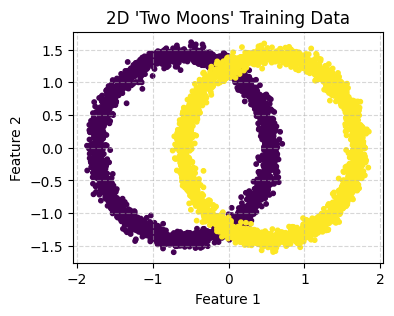


--- 2. Getting Noise Schedule (T=200) ---

--- 3. Plotting Forward Process ---
Generating noisy examples for forward process (full dataset)...


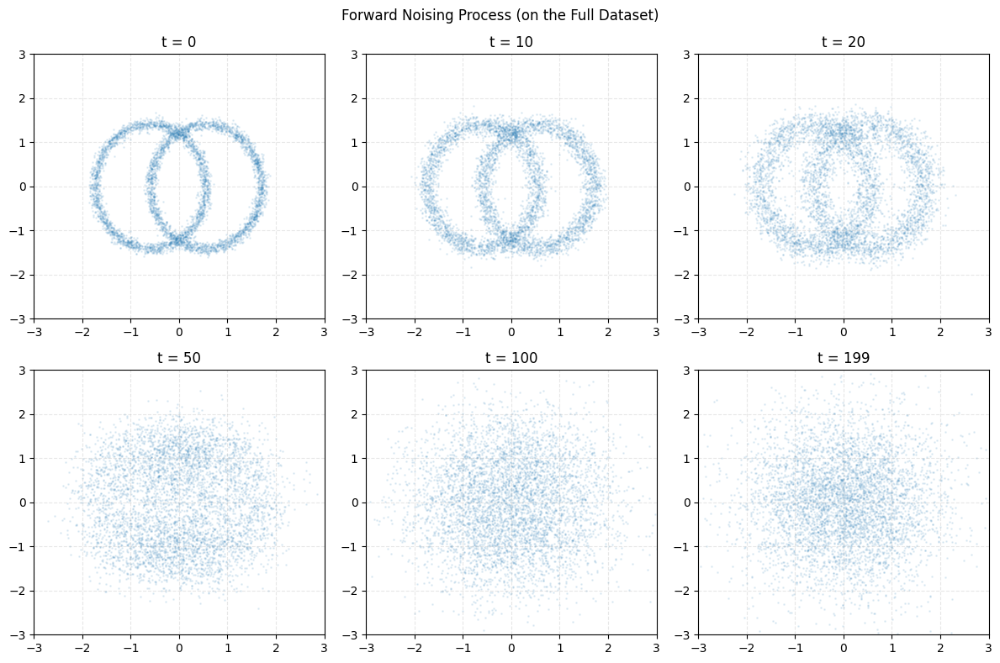


--- 4. Creating Diffusion Training Dataset ---

--- 5. Building Denoising Model ---


Model: "functional_15"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ time_input          │ (None)            │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ class_input         │ (None)            │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ point_input         │ (None, 2)         │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ embedding_21        │ (None, 32)        │      6,400 │ time_input[0][0]  │
│ (Embedding)         │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ embedding_22        │ (None, 16)        │         48 │ class_input[0][0] │
│ (Embedding)         │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_15      │ (None, 50)        │          0 │ point_input[0][0… │
│ (Concatenate)       │                   │            │ embedding_21[0][… │
│                     │                   │            │ embedding_22[0][… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_49 (Dense)    │ (None, 128)       │      6,528 │ concatenate_15[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_50 (Dense)    │ (None, 128)       │     16,512 │ dense_49[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_51 (Dense)    │ (None, 2)         │        258 │ dense_50[0][0]    │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 29,746 (116.20 KB)

 Trainable params: 29,746 (116.20 KB)

 Non-trainable params: 0 (0.00 B)


--- 6. Setting up Denoising Training ---

--- 7. Starting Denoising Training (with Classifier-Free Guidance Callback) ---
Epoch 1/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 0.7375
Epoch 2/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.5748
Epoch 3/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.5480
Epoch 4/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.5403
Epoch 5/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.5427
Epoch 6/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.5272
Epoch 7/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4916
Epoch 8/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4874
Epoch 9/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4732
Epoch 10/300
35/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4647
--- Generating points at epoch 10 (Classifier-Free Guidance Scale: 5.0) ---


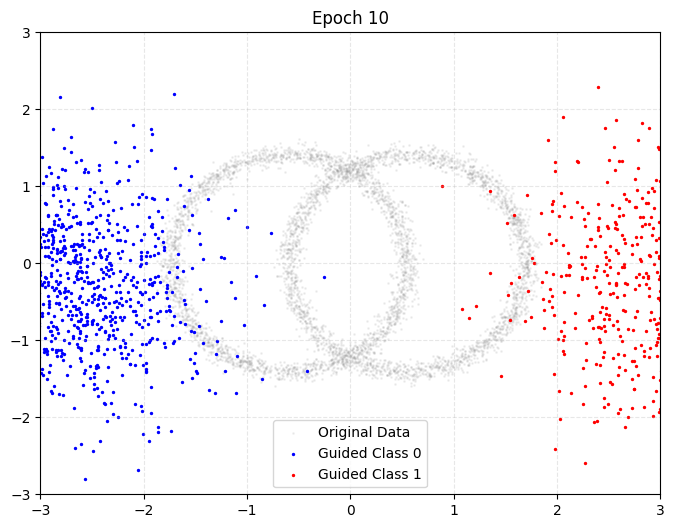

39/39 ━━━━━━━━━━━━━━━━━━━━ 54s 1s/step - loss: 0.4669
Epoch 11/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4825
Epoch 12/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4660
Epoch 13/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4703
Epoch 14/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.4792
Epoch 15/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.4718
Epoch 16/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.4791
Epoch 17/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.4634
Epoch 18/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4753
Epoch 19/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.4636
Epoch 20/300
27/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4715
--- Generating points at epoch 20 (Classifier-Free Guidance Scale: 5.0) ---


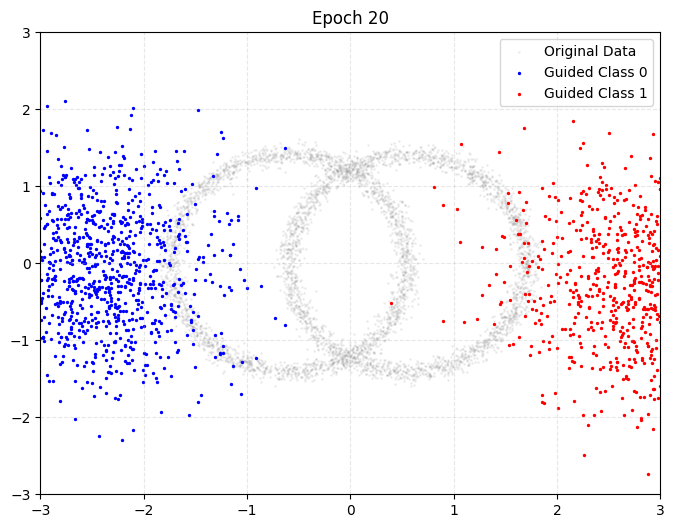

39/39 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 0.4737
Epoch 21/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.4726
Epoch 22/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4664
Epoch 23/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4693
Epoch 24/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4713
Epoch 25/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4652
Epoch 26/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4605
Epoch 27/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4635
Epoch 28/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4734
Epoch 29/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4647
Epoch 30/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4639
--- Generating points at epoch 30 (Classifier-Free Guidance Scale: 5.0) ---


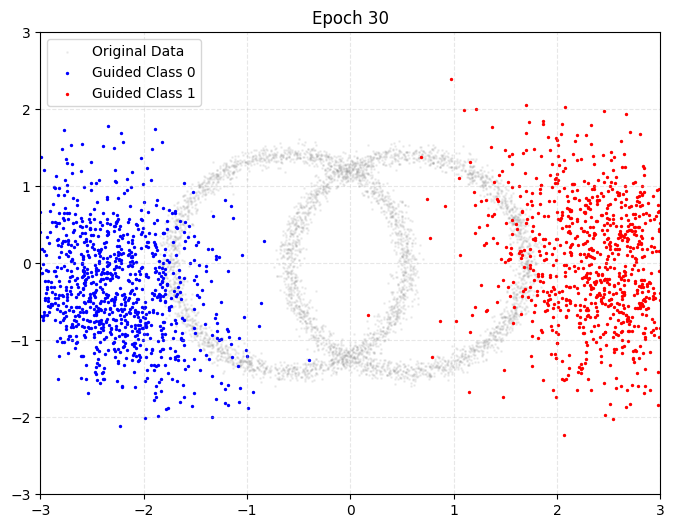

39/39 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - loss: 0.4641
Epoch 31/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4583
Epoch 32/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4625
Epoch 33/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4682
Epoch 34/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4555
Epoch 35/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4672
Epoch 36/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4599
Epoch 37/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4591
Epoch 38/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4634
Epoch 39/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4625
Epoch 40/300
30/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4557
--- Generating points at epoch 40 (Classifier-Free Guidance Scale: 5.0) ---


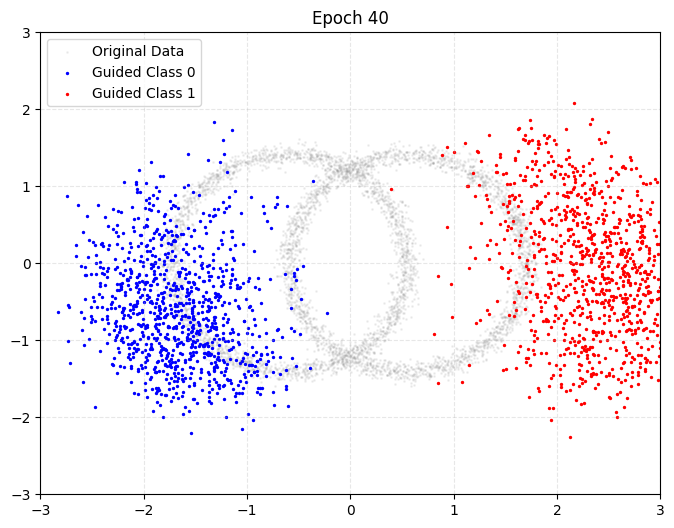

39/39 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - loss: 0.4583
Epoch 41/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4667
Epoch 42/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4562
Epoch 43/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4542
Epoch 44/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4585
Epoch 45/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4497
Epoch 46/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4412
Epoch 47/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4591
Epoch 48/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4574
Epoch 49/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4549
Epoch 50/300
38/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4504
--- Generating points at epoch 50 (Classifier-Free Guidance Scale: 5.0) ---


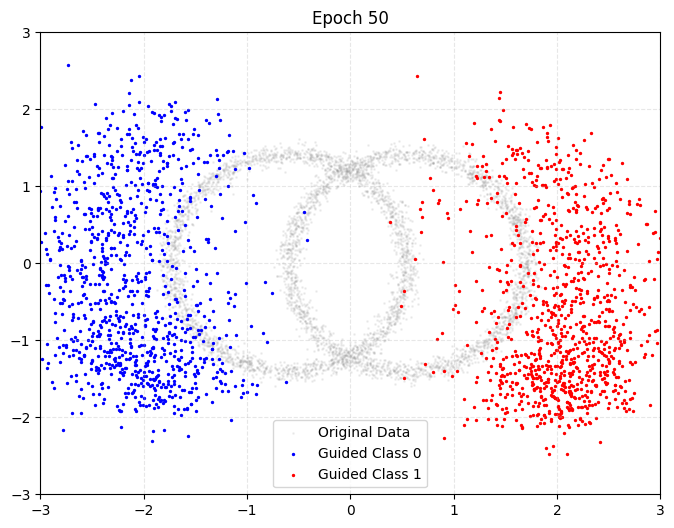

39/39 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - loss: 0.4505
Epoch 51/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4489
Epoch 52/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4410
Epoch 53/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4512
Epoch 54/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4367
Epoch 55/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4547
Epoch 56/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4480
Epoch 57/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4426
Epoch 58/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4387
Epoch 59/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4426
Epoch 60/300
37/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4240
--- Generating points at epoch 60 (Classifier-Free Guidance Scale: 5.0) ---


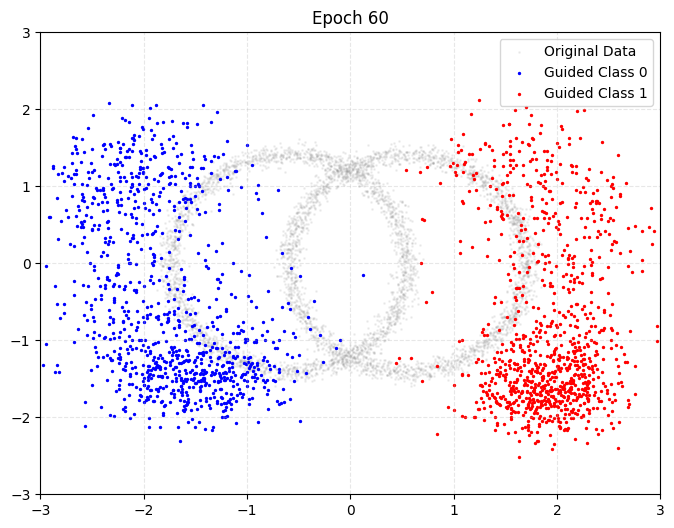

39/39 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - loss: 0.4252
Epoch 61/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4413
Epoch 62/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4407
Epoch 63/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4491
Epoch 64/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4352
Epoch 65/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4340
Epoch 66/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.4377
Epoch 67/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.4389
Epoch 68/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.4358
Epoch 69/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4328
Epoch 70/300
33/39 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.4336
--- Generating points at epoch 70 (Classifier-Free Guidance Scale: 5.0) ---


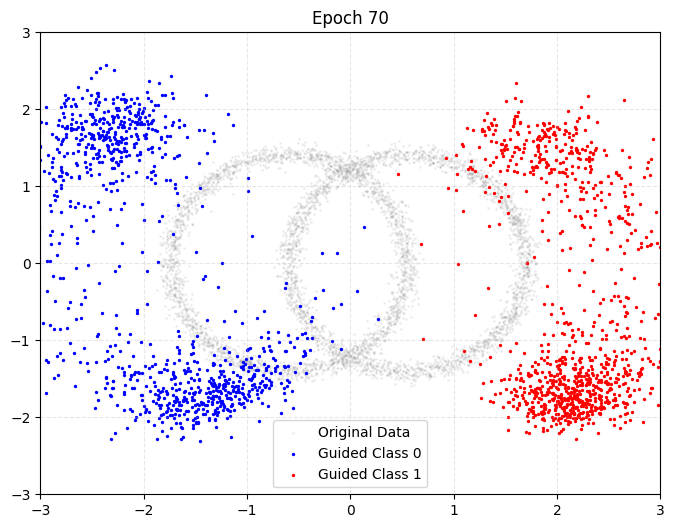

39/39 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.4347
Epoch 71/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.4368
Epoch 72/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.4352
Epoch 73/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.4303
Epoch 74/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4214
Epoch 75/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4252
Epoch 76/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4166
Epoch 77/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4186
Epoch 78/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4252
Epoch 79/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4160
Epoch 80/300
29/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4037
--- Generating points at epoch 80 (Classifier-Free Guidance Scale: 5.0) ---


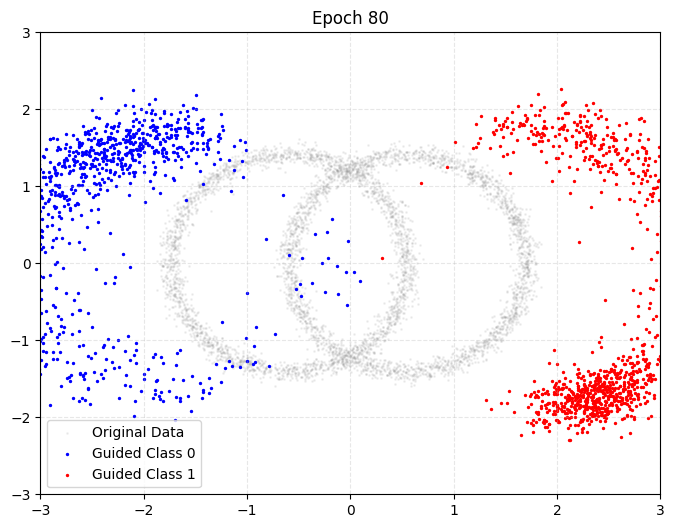

39/39 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - loss: 0.4090
Epoch 81/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4257
Epoch 82/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4229
Epoch 83/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4122
Epoch 84/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4062
Epoch 85/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4241
Epoch 86/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4141
Epoch 87/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4117
Epoch 88/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4165
Epoch 89/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4186
Epoch 90/300
35/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4077
--- Generating points at epoch 90 (Classifier-Free Guidance Scale: 5.0) ---


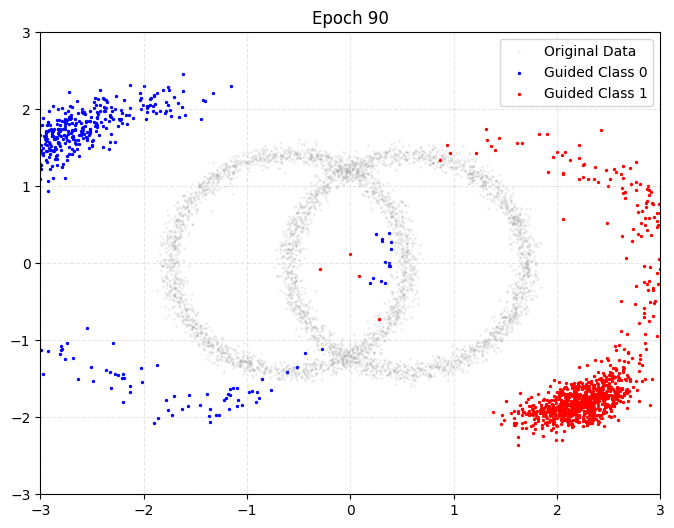

39/39 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - loss: 0.4089
Epoch 91/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4028
Epoch 92/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4236
Epoch 93/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4066
Epoch 94/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4046
Epoch 95/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4050
Epoch 96/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4007
Epoch 97/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4045
Epoch 98/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3979
Epoch 99/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4056
Epoch 100/300
32/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3974
--- Generating points at epoch 100 (Classifier-Free Guidance Scale: 5.0) ---


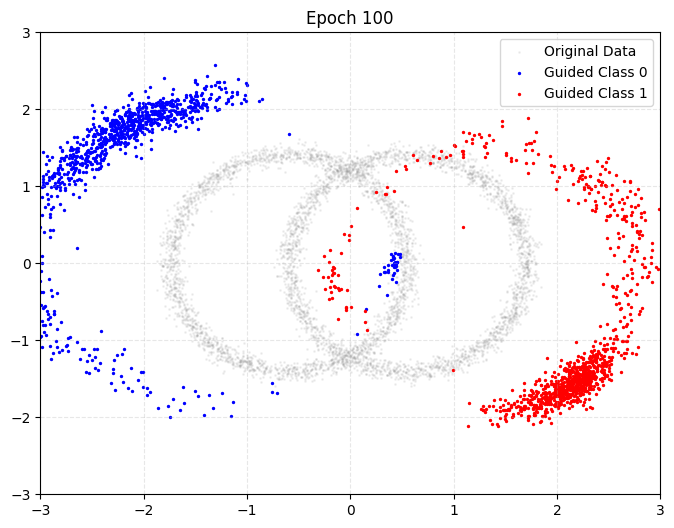

39/39 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - loss: 0.4011
Epoch 101/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3917
Epoch 102/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4020
Epoch 103/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4037
Epoch 104/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3938
Epoch 105/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3996
Epoch 106/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3963
Epoch 107/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3956
Epoch 108/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3981
Epoch 109/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3992
Epoch 110/300
29/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3954
--- Generating points at epoch 110 (Classifier-Free Guidance Scale: 5.0) ---


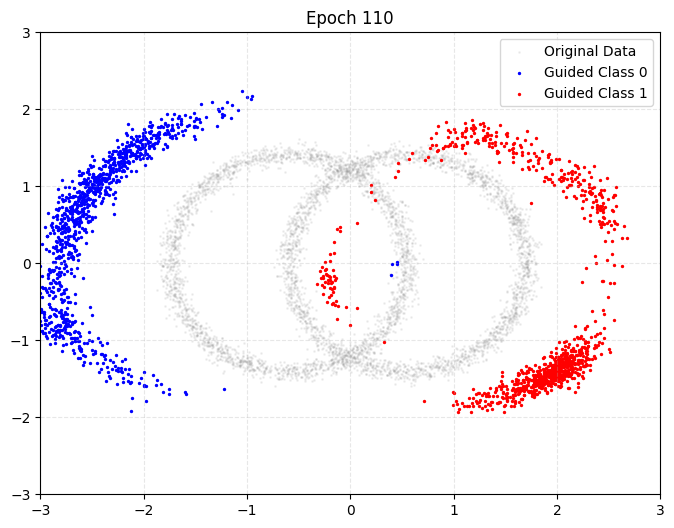

39/39 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - loss: 0.3978
Epoch 111/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4017
Epoch 112/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3977
Epoch 113/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3905
Epoch 114/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3831
Epoch 115/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3896
Epoch 116/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3934
Epoch 117/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3872
Epoch 118/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3959
Epoch 119/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3856
Epoch 120/300
27/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3900
--- Generating points at epoch 120 (Classifier-Free Guidance Scale: 5.0) ---


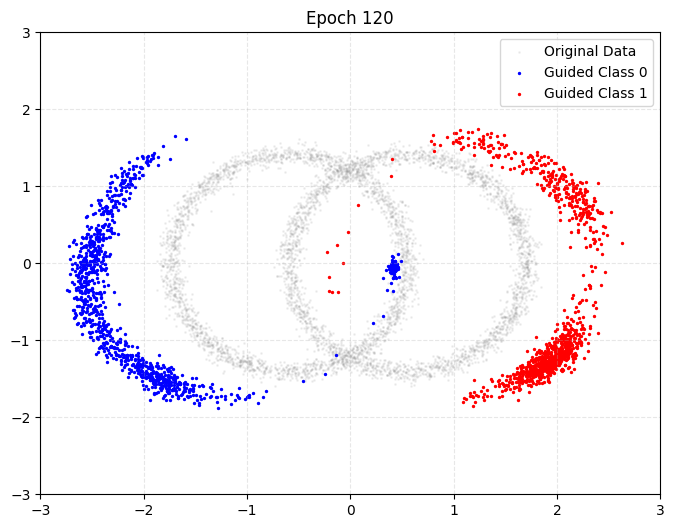

39/39 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.3914
Epoch 121/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.3930
Epoch 122/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.3937
Epoch 123/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 0.3988
Epoch 124/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3948
Epoch 125/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3867
Epoch 126/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3949
Epoch 127/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3908
Epoch 128/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3784
Epoch 129/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3851
Epoch 130/300
31/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3840
--- Generating points at epoch 130 (Classifier-Free Guidance Scale: 5.0) ---


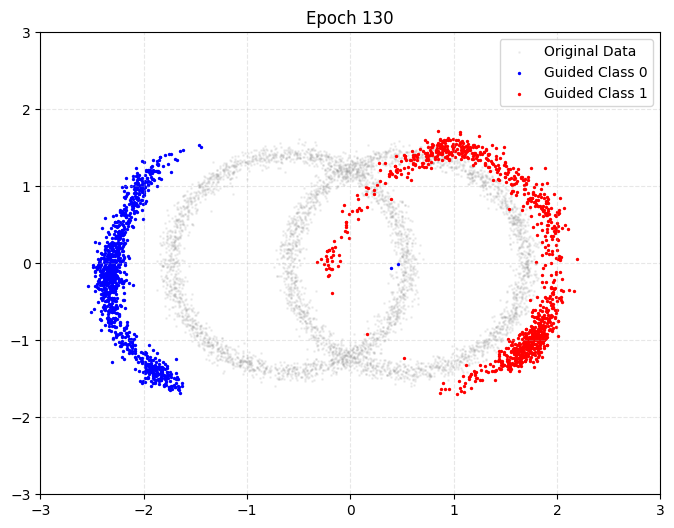

39/39 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - loss: 0.3861
Epoch 131/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3801
Epoch 132/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3952
Epoch 133/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3900
Epoch 134/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3780
Epoch 135/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3860
Epoch 136/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3737
Epoch 137/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3821
Epoch 138/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3902
Epoch 139/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3667
Epoch 140/300
30/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3689
--- Generating points at epoch 140 (Classifier-Free Guidance Scale: 5.0) ---


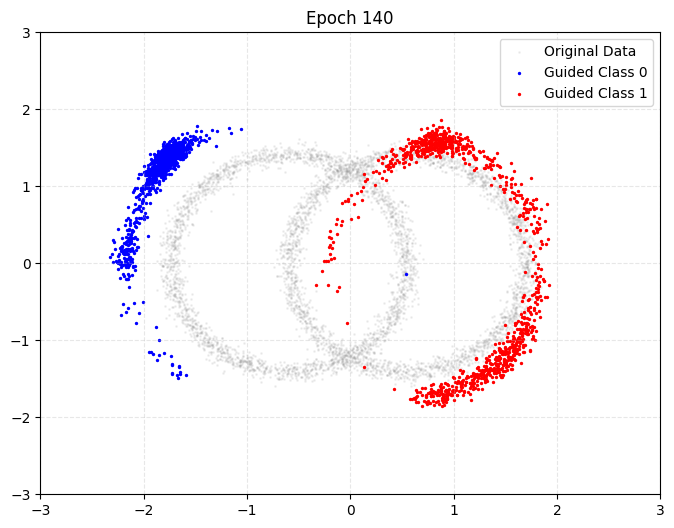

39/39 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - loss: 0.3722
Epoch 141/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3786
Epoch 142/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3816
Epoch 143/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3894
Epoch 144/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3838
Epoch 145/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3814
Epoch 146/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3833
Epoch 147/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3753
Epoch 148/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3982
Epoch 149/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3921
Epoch 150/300
30/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3786
--- Generating points at epoch 150 (Classifier-Free Guidance Scale: 5.0) ---


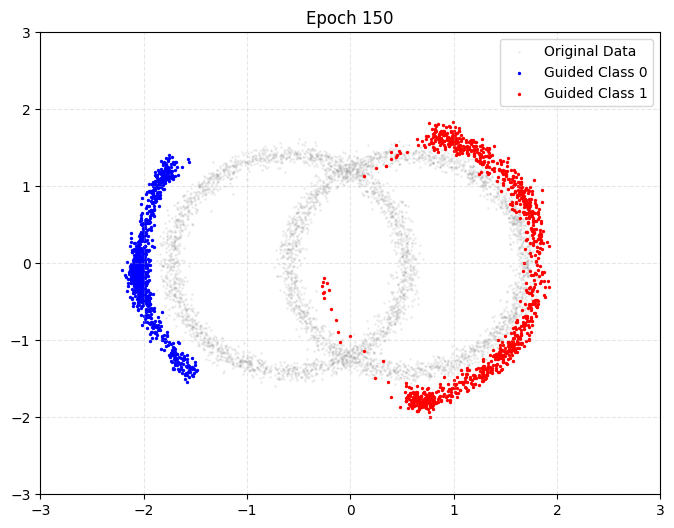

39/39 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - loss: 0.3817
Epoch 151/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3863
Epoch 152/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3763
Epoch 153/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3754
Epoch 154/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3812
Epoch 155/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3902
Epoch 156/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3829
Epoch 157/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3714
Epoch 158/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3726
Epoch 159/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3763
Epoch 160/300
29/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3768
--- Generating points at epoch 160 (Classifier-Free Guidance Scale: 5.0) ---


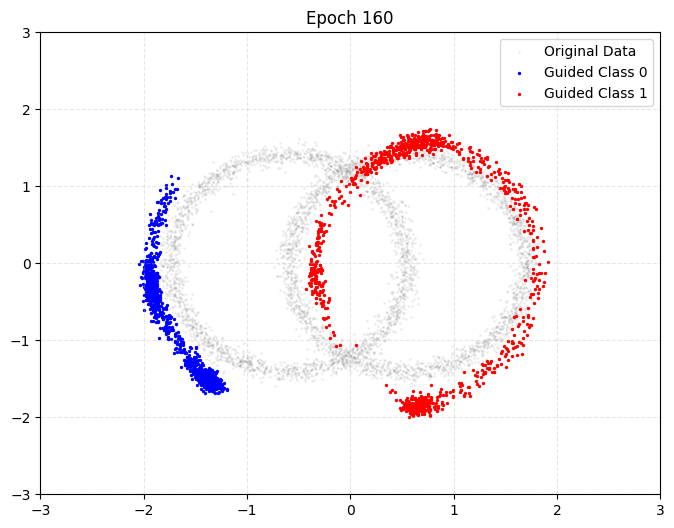

39/39 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - loss: 0.3782
Epoch 161/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3807
Epoch 162/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3717
Epoch 163/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3843
Epoch 164/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3835
Epoch 165/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.3913
Epoch 166/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3650
Epoch 167/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3805
Epoch 168/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.3681
Epoch 169/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.3791
Epoch 170/300
35/39 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3708
--- Generating points at epoch 170 (Classifier-Free Guidance Scale: 5.0) ---


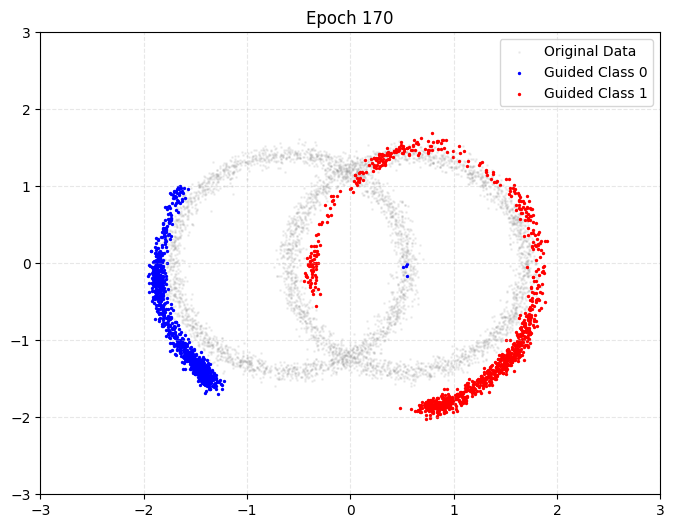

39/39 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.3719
Epoch 171/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 0.3604
Epoch 172/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3609
Epoch 173/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3657
Epoch 174/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3712
Epoch 175/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3767
Epoch 176/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3740
Epoch 177/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3647
Epoch 178/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3723
Epoch 179/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3801
Epoch 180/300
28/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3746
--- Generating points at epoch 180 (Classifier-Free Guidance Scale: 5.0) ---


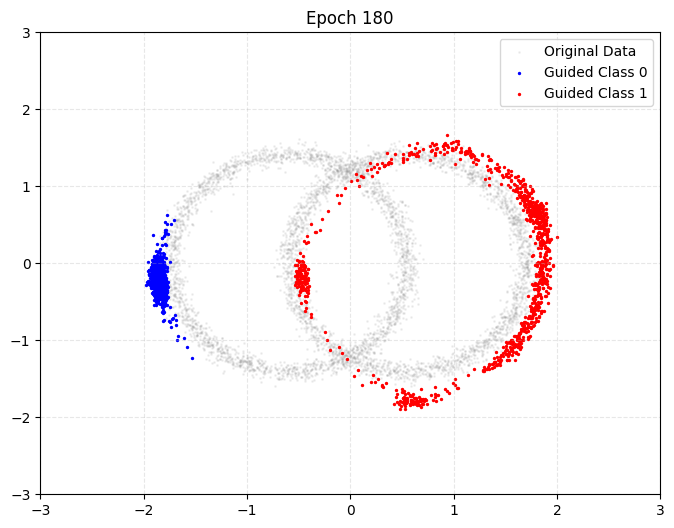

39/39 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - loss: 0.3768
Epoch 181/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3647
Epoch 182/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3670
Epoch 183/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3729
Epoch 184/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3624
Epoch 185/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3770
Epoch 186/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3550
Epoch 187/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3622
Epoch 188/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3599
Epoch 189/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3682
Epoch 190/300
29/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3696
--- Generating points at epoch 190 (Classifier-Free Guidance Scale: 5.0) ---


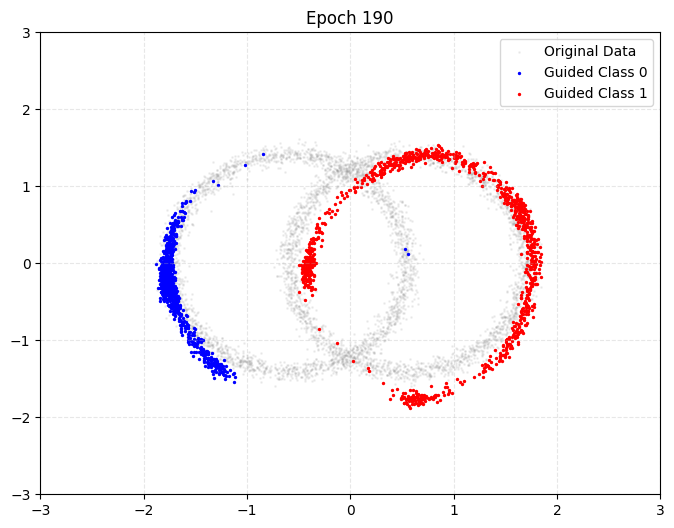

39/39 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - loss: 0.3719
Epoch 191/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3697
Epoch 192/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3664
Epoch 193/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3746
Epoch 194/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3764
Epoch 195/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3661
Epoch 196/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3615
Epoch 197/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3633
Epoch 198/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3672
Epoch 199/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3476
Epoch 200/300
29/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3495
--- Generating points at epoch 200 (Classifier-Free Guidance Scale: 5.0) ---


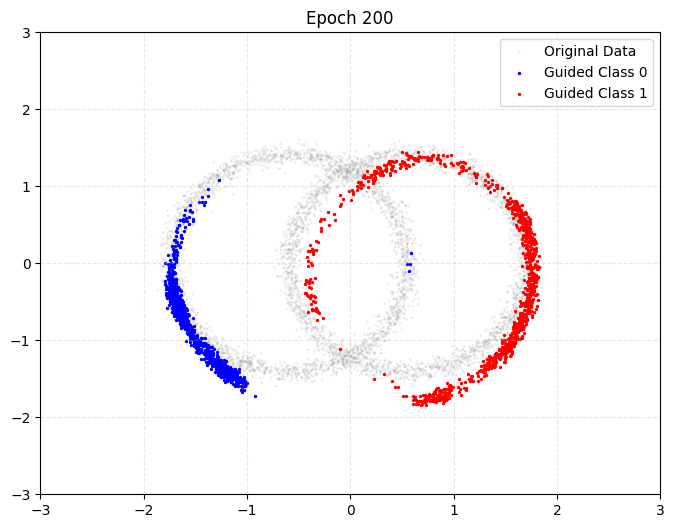

39/39 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - loss: 0.3525
Epoch 201/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3604
Epoch 202/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3654
Epoch 203/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3629
Epoch 204/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3654
Epoch 205/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3549
Epoch 206/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3713
Epoch 207/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3513
Epoch 208/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3736
Epoch 209/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3646
Epoch 210/300
29/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3781
--- Generating points at epoch 210 (Classifier-Free Guidance Scale: 5.0) ---


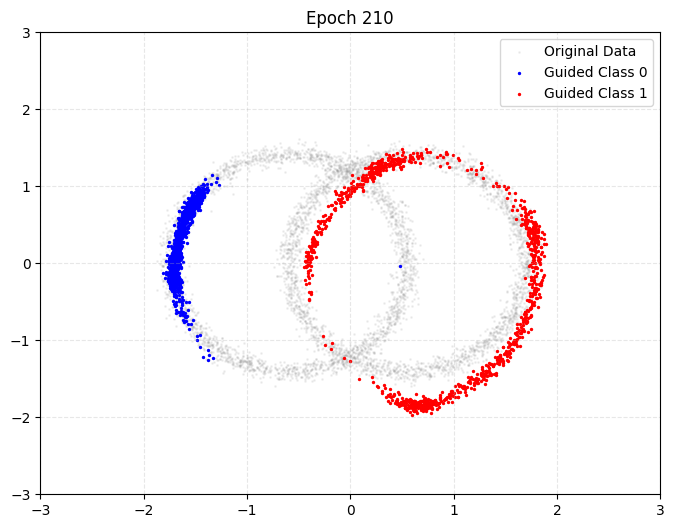

39/39 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.3782
Epoch 211/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.3682
Epoch 212/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.3646
Epoch 213/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3623
Epoch 214/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3614
Epoch 215/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3638
Epoch 216/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3726
Epoch 217/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3571
Epoch 218/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3568
Epoch 219/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3588
Epoch 220/300
28/39 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3603
--- Generating points at epoch 220 (Classifier-Free Guidance Scale: 5.0) ---


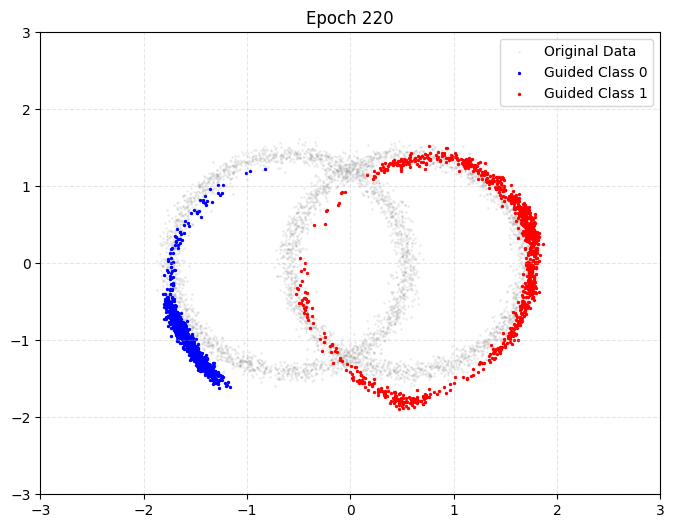

39/39 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 0.3618
Epoch 221/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3548
Epoch 222/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3573
Epoch 223/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3658
Epoch 224/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3536
Epoch 225/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3533
Epoch 226/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3628
Epoch 227/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3592
Epoch 228/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3497
Epoch 229/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3591
Epoch 230/300
29/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3596
--- Generating points at epoch 230 (Classifier-Free Guidance Scale: 5.0) ---


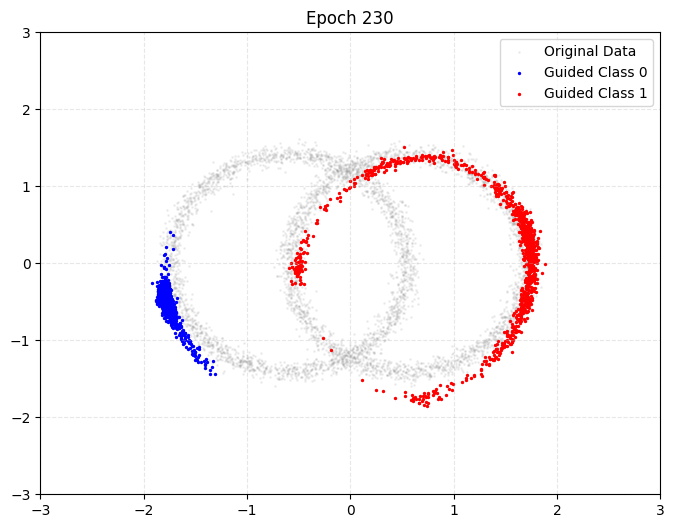

39/39 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.3605
Epoch 231/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3665
Epoch 232/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3592
Epoch 233/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3621
Epoch 234/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3569
Epoch 235/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3636
Epoch 236/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3602
Epoch 237/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.3517
Epoch 238/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3452
Epoch 239/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3470
Epoch 240/300
28/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3604
--- Generating points at epoch 240 (Classifier-Free Guidance Scale: 5.0) ---


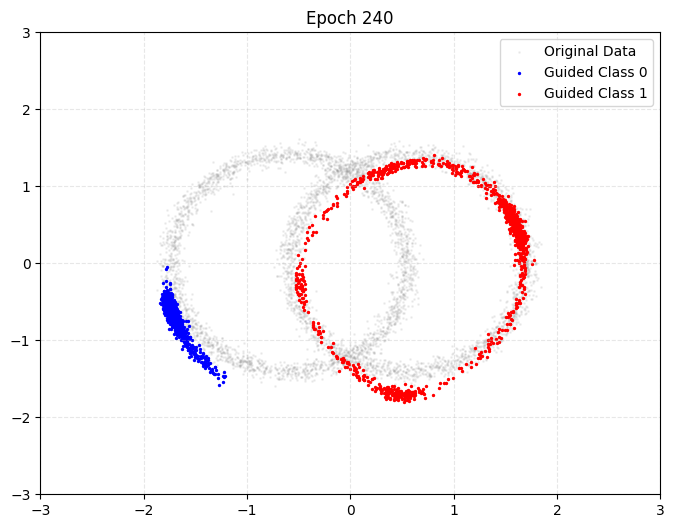

39/39 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.3621
Epoch 241/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3703
Epoch 242/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3570
Epoch 243/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3566
Epoch 244/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3594
Epoch 245/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3620
Epoch 246/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3562
Epoch 247/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3615
Epoch 248/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3504
Epoch 249/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3710
Epoch 250/300
27/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3501
--- Generating points at epoch 250 (Classifier-Free Guidance Scale: 5.0) ---


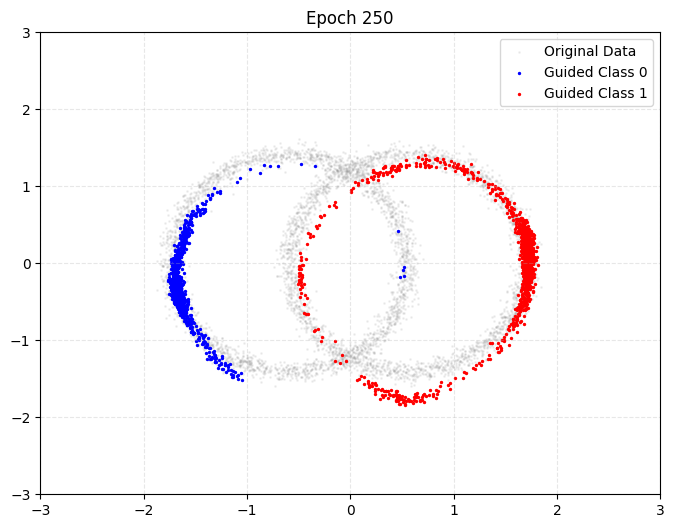

39/39 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - loss: 0.3541
Epoch 251/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3681
Epoch 252/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3423
Epoch 253/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3510
Epoch 254/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3607
Epoch 255/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3431
Epoch 256/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.3514
Epoch 257/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.3490
Epoch 258/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.3489
Epoch 259/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3576
Epoch 260/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3540
--- Generating points at epoch 260 (Classifier-Free Guidance Scale: 5.0) ---


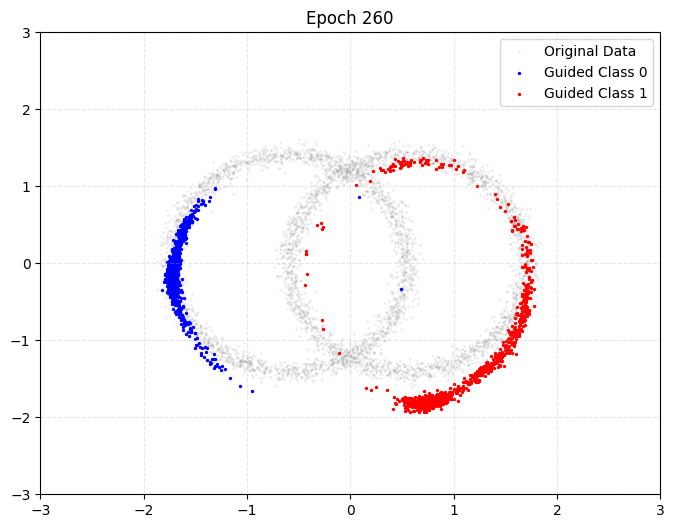

39/39 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.3541
Epoch 261/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3811
Epoch 262/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3603
Epoch 263/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3563
Epoch 264/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3464
Epoch 265/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3556
Epoch 266/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3506
Epoch 267/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3495
Epoch 268/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3498
Epoch 269/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3690
Epoch 270/300
27/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3636
--- Generating points at epoch 270 (Classifier-Free Guidance Scale: 5.0) ---


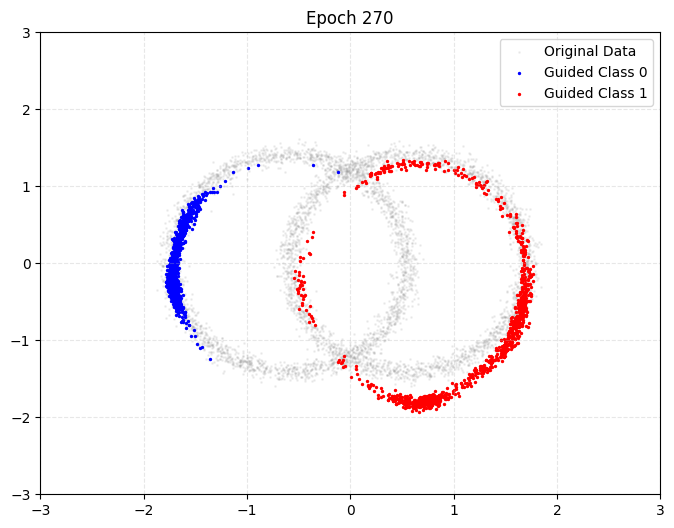

39/39 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.3664
Epoch 271/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3700
Epoch 272/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3591
Epoch 273/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3589
Epoch 274/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3637
Epoch 275/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3469
Epoch 276/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3564
Epoch 277/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3613
Epoch 278/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3519
Epoch 279/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3553
Epoch 280/300
29/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3567
--- Generating points at epoch 280 (Classifier-Free Guidance Scale: 5.0) ---


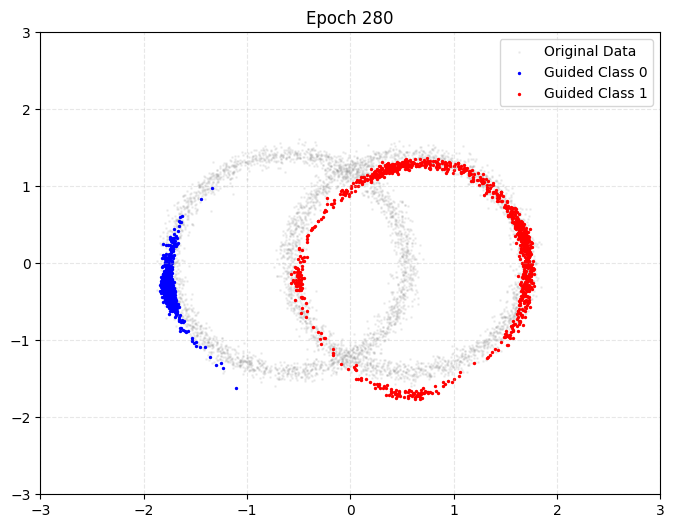

39/39 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.3589
Epoch 281/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3579
Epoch 282/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3477
Epoch 283/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3578
Epoch 284/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3508
Epoch 285/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3605
Epoch 286/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3569
Epoch 287/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3445
Epoch 288/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3575
Epoch 289/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3563
Epoch 290/300
27/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3547
--- Generating points at epoch 290 (Classifier-Free Guidance Scale: 5.0) ---


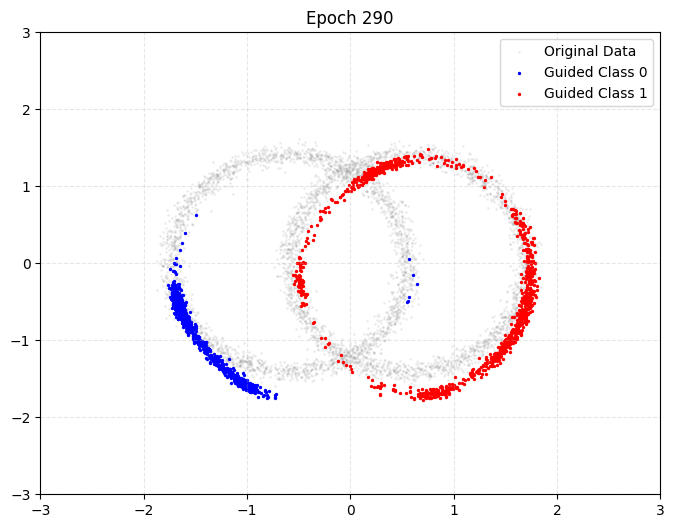

39/39 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.3561
Epoch 291/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3511
Epoch 292/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3507
Epoch 293/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3518
Epoch 294/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3553
Epoch 295/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3524
Epoch 296/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3572
Epoch 297/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3479
Epoch 298/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3543
Epoch 299/300
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3424
Epoch 300/300
29/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3424
--- Generating points at epoch 300 (Classifier-Free Guidance Scale: 5.0) ---


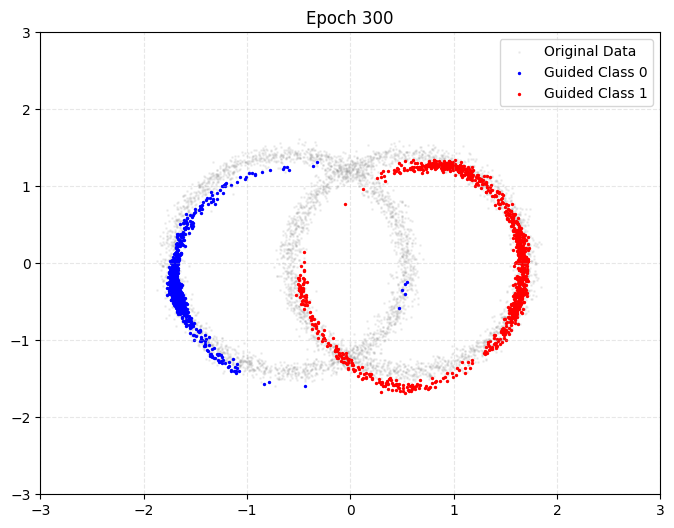

39/39 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.3456


In [ ]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
import numpy as np
import matplotlib.pyplot as plt
from sklearn.datasets import make_moons
from sklearn.preprocessing import StandardScaler

def get_noise_scheduler_vars(timesteps):
    s = 0.008
    steps = timesteps + 1
    x = tf.linspace(0.0, tf.cast(timesteps, tf.float32), steps)

    pi_f32 = tf.constant(np.pi, dtype=tf.float32)

    alphas_cumprod = tf.cos(((x / tf.cast(timesteps, tf.float32)) + s) / (1 + s) * pi_f32 * 0.5) ** 2
    alphas_cumprod = alphas_cumprod / alphas_cumprod[0]
    alphas_cumprod = alphas_cumprod[1:]

    betas = 1.0 - (alphas_cumprod / tf.concat([tf.constant([1.0], dtype=tf.float32), alphas_cumprod[:-1]], axis=0))
    betas = tf.clip_by_value(betas, 0.0001, 0.02)

    alphas = 1.0 - betas
    alphas_cumprod = tf.math.cumprod(alphas)

    sqrt_alphas_cumprod = tf.sqrt(alphas_cumprod)
    sqrt_one_minus_alphas_cumprod = tf.sqrt(1.0 - alphas_cumprod)

    return betas, alphas, alphas_cumprod, sqrt_alphas_cumprod, sqrt_one_minus_alphas_cumprod


def add_noise_at_timestep(original_points, t, sqrt_alphas_cumprod, sqrt_one_minus_alphas_cumprod):
    t_broadcast = tf.fill(dims=(tf.shape(original_points)[0],), value=t)

    sqrt_alpha_t = tf.gather(sqrt_alphas_cumprod, t_broadcast)
    sqrt_one_minus_alpha_t = tf.gather(sqrt_one_minus_alphas_cumprod, t_broadcast)

    sqrt_alpha_t = tf.reshape(sqrt_alpha_t, [-1, 1])
    sqrt_one_minus_alpha_t = tf.reshape(sqrt_one_minus_alpha_t, [-1, 1])

    noise = tf.random.normal(shape=tf.shape(original_points), dtype=original_points.dtype)

    noisy_points = (
        sqrt_alpha_t * original_points +
        sqrt_one_minus_alpha_t * noise
    )
    return noisy_points

def plot_forward_process(all_points, timesteps_to_plot, sqrt_alphas_cumprod, sqrt_one_minus_alphas_cumprod):
    print("Generating noisy examples for forward process (full dataset)...")

    plt.figure(figsize=(12, 8))

    for i, t in enumerate(timesteps_to_plot):
        noisy_points = add_noise_at_timestep(
            all_points, t,
            sqrt_alphas_cumprod,
            sqrt_one_minus_alphas_cumprod
        )

        ax = plt.subplot(2, 3, i + 1)
        ax.scatter(noisy_points[:, 0], noisy_points[:, 1], s=1, alpha=0.1)
        ax.set_title(f"t = {t}")
        ax.set_xlim(-3, 3)
        ax.set_ylim(-3, 3)
        ax.grid(True, linestyle='--', alpha=0.3)

    plt.suptitle("Forward Noising Process (on the Full Dataset)")
    plt.tight_layout()
    plt.show()


def create_diffusion_dataset(x_train, y_train, batch_size, timesteps,
                             sqrt_alphas_cumprod, sqrt_one_minus_alphas_cumprod,
                             uncond_label, uncond_prob):
    dataset = tf.data.Dataset.from_tensor_slices((x_train, y_train))
    dataset = dataset.shuffle(buffer_size=1024).batch(batch_size, drop_remainder=True)

    def add_noise_and_cond(points, labels):
        batch_size_ = tf.shape(points)[0]

        t = tf.random.uniform(minval=0, maxval=timesteps, shape=(batch_size_,), dtype=tf.int64)
        noise = tf.random.normal(shape=tf.shape(points), dtype=points.dtype)

        sqrt_alpha_t = tf.gather(sqrt_alphas_cumprod, t)
        sqrt_one_minus_alpha_t = tf.gather(sqrt_one_minus_alphas_cumprod, t)

        sqrt_alpha_t = tf.reshape(sqrt_alpha_t, [-1, 1])
        sqrt_one_minus_alpha_t = tf.reshape(sqrt_one_minus_alpha_t, [-1, 1])

        noisy_points = sqrt_alpha_t * points + sqrt_one_minus_alpha_t * noise

        cond_mask = tf.random.uniform(shape=(batch_size_,), minval=0.0, maxval=1.0) > uncond_prob
        final_labels = tf.where(cond_mask, labels, tf.cast(uncond_label, labels.dtype))

        return (noisy_points, t, final_labels), noise

    dataset = dataset.map(add_noise_and_cond, num_parallel_calls=tf.data.AUTOTUNE)
    dataset = dataset.prefetch(tf.data.AUTOTUNE)
    return dataset


def get_denoising_model(timesteps, num_classes=3):
    point_input = layers.Input(shape=(2,), name="point_input")
    time_input = layers.Input(shape=(), dtype='int64', name="time_input")
    class_input = layers.Input(shape=(), dtype='int64', name="class_input")

    time_emb_dim = 32
    class_emb_dim = 16

    time_emb = layers.Embedding(timesteps, time_emb_dim)(time_input)
    class_emb = layers.Embedding(num_classes, class_emb_dim)(class_input)

    combined_input = layers.Concatenate()([point_input, time_emb, class_emb])

    x = layers.Dense(128, activation='swish')(combined_input)
    x = layers.Dense(128, activation='swish')(x)
    output = layers.Dense(2, activation='linear')(x)

    model = keras.Model([point_input, time_input, class_input], output)
    return model


class PointGeneratorCallback(keras.callbacks.Callback):
    def __init__(self, x_train, num_points, timesteps, betas, alphas, alphas_cumprod,
                 guidance_scale, uncond_label, epoch_interval):
        self.x_train = x_train
        self.num_points_per_class = num_points // 2
        self.timesteps = timesteps
        self.betas = betas
        self.alphas = alphas
        self.alphas_cumprod = alphas_cumprod
        self.guidance_scale = guidance_scale
        self.uncond_label = tf.cast(uncond_label, tf.int64)
        self.epoch_interval = epoch_interval
        self.generator_shape = (self.num_points_per_class, 2)

    @tf.function
    def generate_points(self, betas, alphas, alphas_cumprod, class_label):
        points = tf.random.normal(shape=self.generator_shape)

        class_label_batch = tf.fill(dims=(self.num_points_per_class,), value=tf.cast(class_label, tf.int64))
        uncond_label_batch = tf.fill(dims=(self.num_points_per_class,), value=self.uncond_label)

        for t in reversed(range(self.timesteps)):
            t_batch = tf.fill(dims=(self.num_points_per_class,), value=t)

            pred_noise_cond = self.model([points, t_batch, class_label_batch], training=False)
            pred_noise_uncond = self.model([points, t_batch, uncond_label_batch], training=False)

            predicted_noise = (
                (1.0 + self.guidance_scale) * pred_noise_cond -
                self.guidance_scale * pred_noise_uncond
            )

            alpha_t = tf.gather(alphas, t)
            alpha_cumprod_t = tf.gather(alphas_cumprod, t)
            beta_t = tf.gather(betas, t)

            term1 = 1.0 / tf.sqrt(alpha_t)
            term2 = (1.0 - alpha_t) / tf.sqrt(1.0 - alpha_cumprod_t)

            mean_theta = term1 * (points - term2 * predicted_noise)

            variance = beta_t

            if t > 0:
                points = mean_theta + tf.sqrt(variance) * tf.random.normal(shape=self.generator_shape)
            else:
                points = mean_theta

        return points

    def on_epoch_end(self, epoch, logs=None):
        if (epoch + 1) % self.epoch_interval == 0:
            print(f"\n--- Generating points at epoch {epoch + 1} (Classifier-Free Guidance Scale: {self.guidance_scale}) ---")

            generated_points_0 = self.generate_points(
                self.betas, self.alphas, self.alphas_cumprod, 0
            )
            generated_points_1 = self.generate_points(
                self.betas, self.alphas, self.alphas_cumprod, 1
            )

            plt.figure(figsize=(8, 6))
            plt.scatter(self.x_train[:, 0], self.x_train[:, 1], s=1, c='gray', alpha=0.1, label='Original Data')
            plt.scatter(generated_points_0[:, 0], generated_points_0[:, 1], s=2, c='blue', alpha=1.0, label='Guided Class 0')
            plt.scatter(generated_points_1[:, 0], generated_points_1[:, 1], s=2, c='red', alpha=1.0, label='Guided Class 1')
            plt.title(f"Epoch {epoch + 1}")
            plt.legend()
            plt.xlim(-3, 3)
            plt.ylim(-3, 3)
            plt.grid(True, linestyle='--', alpha=0.3)
            plt.show()


TIMESTEPS = 200
N_SAMPLES = 5000
BATCH_SIZE = 128
EPOCHS = 300
EPOCH_INTERVAL = 10
NUM_GEN_POINTS = 2000
LEARNING_RATE = 1e-3
WEIGHT_DECAY = 0.0
GUIDANCE_SCALE = 5.0

NUM_CLASSES = 3
UNCOND_LABEL = 2
UNCOND_PROB = 0.1

print("--- 1. Getting Data ---")
x_train, y_train = get_data(n_samples=N_SAMPLES)
plot_data(x_train, y_train)

print(f"\n--- 2. Getting Noise Schedule (T={TIMESTEPS}) ---")
betas, alphas, alphas_cumprod, sqrt_alphas_cumprod, sqrt_one_minus_alphas_cumprod = get_noise_scheduler_vars(TIMESTEPS)

print("\n--- 3. Plotting Forward Process ---")
timesteps_to_plot = [0, 10, 20, 50, 100, 199]
plot_forward_process(x_train, timesteps_to_plot, sqrt_alphas_cumprod, sqrt_one_minus_alphas_cumprod)

print("\n--- 4. Creating Diffusion Training Dataset ---")
train_dataset = create_diffusion_dataset(
    x_train,
    y_train,
    BATCH_SIZE,
    TIMESTEPS,
    sqrt_alphas_cumprod,
    sqrt_one_minus_alphas_cumprod,
    uncond_label=UNCOND_LABEL,
    uncond_prob=UNCOND_PROB
)

print("\n--- 5. Building Denoising Model ---")
denoising_model = get_denoising_model(TIMESTEPS, num_classes=NUM_CLASSES)
denoising_model.summary()

print("\n--- 6. Setting up Denoising Training ---")
denoising_model.compile(
    optimizer=keras.optimizers.AdamW(learning_rate=LEARNING_RATE, weight_decay=WEIGHT_DECAY),
    loss=keras.losses.MeanSquaredError()
)

print("\n--- 7. Starting Denoising Training (with Classifier-Free Guidance Callback) ---")
point_gen_callback = PointGeneratorCallback(
    x_train=x_train,
    num_points=NUM_GEN_POINTS,
    timesteps=TIMESTEPS,
    betas=betas,
    alphas=alphas,
    alphas_cumprod=alphas_cumprod,
    guidance_scale=GUIDANCE_SCALE,
    uncond_label=UNCOND_LABEL,
    epoch_interval=EPOCH_INTERVAL
)

denoising_model.fit(
    train_dataset,
    epochs=EPOCHS,
    callbacks=[point_gen_callback]
)